<a href="https://colab.research.google.com/github/HansAzharr/ML-Material-Screening/blob/main/05_Model_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import joblib
import pandas as pd
import numpy as np
import random
import sys

from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor

## Load files

In [ ]:
# Define paths to saved model, scaler, and data

model_folder_path = '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model'
data_output_folder_path = '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data' # Where X_test_scaled.csv is saved


scaler_filename = os.path.join(model_folder_path, "scaler_X_v2.joblib")
feature_names_filename = os.path.join(model_folder_path, "feature_column_names_v2.joblib")
X_test_filename = os.path.join(data_output_folder_path, "X_test_scaled.csv")
Y_test_filename = os.path.join(data_output_folder_path, "Y_test.csv")

# Define filenames for the models
xgb_model_filename = os.path.join(model_folder_path, "tuned_xgboost_multi_output_model_v2.joblib")
rf_model_filename = os.path.join(model_folder_path, "tuned_random_forest_multi_output_model_v2.joblib")
lgbm_model_filename = os.path.join(model_folder_path, "tuned_lightgbm_multi_output_model_v2.joblib")


print(f"XGBoost Model will be loaded from: '{xgb_model_filename}'")
print(f"Random Forest Model will be loaded from: '{rf_model_filename}'")
print(f"LightGBM Model will be loaded from: '{lgbm_model_filename}'")
print(f"Scaler will be loaded from: '{scaler_filename}'")
print(f"Feature names will be loaded from: '{feature_names_filename}'")
print(f"X_test data will be loaded from: '{X_test_filename}'")
print(f"Y_test data will be loaded from: '{Y_test_filename}'")

XGBoost Model will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model/tuned_xgboost_multi_output_model_v2.joblib'
Random Forest Model will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model/tuned_random_forest_multi_output_model_v2.joblib'
LightGBM Model will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model/tuned_lightgbm_multi_output_model_v2.joblib'
Scaler will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model/scaler_X_v2.joblib'
Feature names will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model/feature_column_names_v2.joblib'
X_test data will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data/X_test_scaled.csv'
Y_test data will be loaded from: '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data/Y_test.csv'


In [ ]:
# Load Model, Scaler, and Feature Names


try:
    # Load all three models
    loaded_xgboost_model = joblib.load(xgb_model_filename) # XGBoost model
    loaded_random_forest_model = joblib.load(rf_model_filename) # Random Forest model
    loaded_lightgbm_model = joblib.load(lgbm_model_filename) # LightGBM model


    loaded_scaler_X = joblib.load(scaler_filename)
    loaded_feature_names = joblib.load(feature_names_filename)
    print("Models, scaler, and feature names loaded successfully.")
    print(f"Type of loaded XGBoost model: {type(loaded_xgboost_model)}")
    print(f"Type of loaded Random Forest model: {type(loaded_random_forest_model)}")
    print(f"Type of loaded LightGBM model: {type(loaded_lightgbm_model)}")
    print(f"Type of loaded scaler: {type(loaded_scaler_X)}")

    # Inspect loaded_feature_names
    print("\n--- Inspection of loaded_feature_names ---")
    print(f"Type of loaded_feature_names: {type(loaded_feature_names)}")
    print(f"Number of feature names loaded: {len(loaded_feature_names)}")
    print(f"First 5 feature names: {loaded_feature_names[:5]}")
    print(f"Last 5 feature names: {loaded_feature_names[-5:]}")


except Exception as e:
    print(f"Error loading models, scaler, or feature names: {e}")
    sys.exit("Exiting due to critical loading error.") # Exit if these critical components can't be loaded

Models, scaler, and feature names loaded successfully.
Type of loaded XGBoost model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded Random Forest model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded LightGBM model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded scaler: <class 'sklearn.preprocessing._data.StandardScaler'>

--- Inspection of loaded_feature_names ---
Type of loaded_feature_names: <class 'list'>
Number of feature names loaded: 49
First 5 feature names: ['density', 'nelements', 'volume', 'band_gap', 'total_magnetization']
Last 5 feature names: ['theoretical_True', 'exp_band_gap', 'exp_energy_vol', 'theo_band_gap', 'theo_energy_vol']


In [ ]:
#  Define Target KPIs
target_kpis = ['theoretical_capacity_grav', 'average_voltage', 'energy_above_hull']
print(f"\nTarget KPIs for analysis: {target_kpis}")

# Load the Test Data (X_test_scaled and Y_test)
print("\n--- Loading Test Data ---")
try:
    # Load X_test_scaled.csv (which includes material_id and formula_pretty)
    # index_col=0 is crucial if saved with index=True
    X_test_loaded_df_full = pd.read_csv(X_test_filename, index_col=0)

    # Load Y_test.csv
    Y_test_loaded_df = pd.read_csv(Y_test_filename, index_col=0)

    print("Test data loaded successfully.")
    print(f"Shape of loaded X_test_loaded_df_full: {X_test_loaded_df_full.shape}")
    print(f"Shape of loaded Y_test_loaded_df: {Y_test_loaded_df.shape}")

except Exception as e:
    print(f"Error loading test data: {e}")
    sys.exit("Exiting due to critical data loading error.") # Exit if test data can't be loaded



Target KPIs for analysis: ['theoretical_capacity_grav', 'average_voltage', 'energy_above_hull']

--- Loading Test Data ---
Test data loaded successfully.
Shape of loaded X_test_loaded_df_full: (689, 51)
Shape of loaded Y_test_loaded_df: (689, 3)


In [ ]:
# Inspect the loaded X_test_loaded_df_full DataFrame

print(X_test_loaded_df_full.info())
print(f"Number of columns in X_test_loaded_df_full: {X_test_loaded_df_full.shape[1]}")
print(f"First 5 rows of X_test_loaded_df_full:\n{X_test_loaded_df_full.head()}")
print(f"Columns of X_test_loaded_df_full:\n{X_test_loaded_df_full.columns.tolist()}")


<class 'pandas.core.frame.DataFrame'>
Index: 689 entries, 2466 to 3338
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   density                      689 non-null    float64
 1   nelements                    689 non-null    float64
 2   volume                       689 non-null    float64
 3   band_gap                     689 non-null    float64
 4   total_magnetization          689 non-null    float64
 5   energy_grav                  689 non-null    float64
 6   energy_vol                   689 non-null    float64
 7   num_steps                    689 non-null    float64
 8   max_voltage_step             689 non-null    float64
 9   stability_discharge          689 non-null    float64
 10  e_fermi                      689 non-null    float64
 11  nsites                       689 non-null    float64
 12  num_unique_elements          689 non-null    float64
 13  avg_atomic_number    

## Prepare Data for Analysis

In [ ]:
# Separate material_id and formula_pretty from features

if 'material_id' in X_test_loaded_df_full.columns and 'formula_pretty' in X_test_loaded_df_full.columns:
    material_ids = X_test_loaded_df_full['material_id']
    formula_pretties = X_test_loaded_df_full['formula_pretty']

    # Select only the features needed for the model (using the loaded_feature_names)
    try:
        X_test_scaled = X_test_loaded_df_full[loaded_feature_names]
        print(f"Selected {len(loaded_feature_names)} features from X_test_loaded_df_full for modeling.")
    except KeyError as e:
        print(f"Error: One or more feature names from 'loaded_feature_names' not found in 'X_test_loaded_df_full'.")
        print(f"Missing feature: {e}")
        print(f"Columns in loaded CSV: {X_test_loaded_df_full.columns.tolist()}")
        print(f"Features expected by model: {loaded_feature_names}")
        sys.exit("Exiting due to feature mismatch during selection.")
else:
    print("Warning: 'material_id' or 'formula_pretty' not found in loaded X_test data. Assuming all columns are features.")
    X_test_scaled = X_test_loaded_df_full.copy()
    material_ids = X_test_scaled.index.to_series() # Use index if no material_id column
    formula_pretties = X_test_scaled.index.to_series() # Placeholder if no formula_pretty

# Ensure y_test is a DataFrame for consistency
y_test = Y_test_loaded_df.copy()

print(f"Final X_test_scaled shape for prediction: {X_test_scaled.shape}")
print(f"Final y_test shape: {y_test.shape}")
print(f"Columns in X_test_scaled (first 5): {X_test_scaled.columns.tolist()[:5]}")
print(f"Columns in X_test_scaled (last 5): {X_test_scaled.columns.tolist()[-5:]}")


Selected 49 features from X_test_loaded_df_full for modeling.
Final X_test_scaled shape for prediction: (689, 49)
Final y_test shape: (689, 3)
Columns in X_test_scaled (first 5): ['density', 'nelements', 'volume', 'band_gap', 'total_magnetization']
Columns in X_test_scaled (last 5): ['theoretical_True', 'exp_band_gap', 'exp_energy_vol', 'theo_band_gap', 'theo_energy_vol']


## Quick Model prediction test

In [ ]:
# Quick Model Test: Predict for a Random Material ID

# Choose a random index from the test set
# Ensure the random index is valid for the actual feature set
random_idx = random.randint(0, X_test_scaled.shape[0] - 1)

# Get the material ID and formula for this random index
test_material_id = material_ids.iloc[random_idx]
test_formula_pretty = formula_pretties.iloc[random_idx]

print(f"Testing prediction for Random Material ID: {test_material_id}")
print(f"Formula: {test_formula_pretty}")

# Get the scaled features for this specific material
# Ensure it's a 2D array for the model's predict method (even for a single sample)
material_scaled_features = X_test_scaled.iloc[random_idx:random_idx+1] # Use .iloc for DataFrame subsetting

# Get the actual KPIs for comparison
actual_kpis = y_test.iloc[random_idx].values # .values to get numpy array

# Display results
print("\n--- Results for Randomly Selected Material ---")
print(f"Material ID: {test_material_id} (Index: {random_idx})")
print(f"Formula: {test_formula_pretty}")
print("\nActual KPIs:")
for i, kpi in enumerate(target_kpis):
    print(f"  {kpi}: {actual_kpis[i]:.4f}")


# Make predictions using each loaded model
models_to_test = {
    "XGBoost": loaded_xgboost_model,
    "Random Forest": loaded_random_forest_model,
    "LightGBM": loaded_lightgbm_model
}

print("\nPredicted KPIs by Model:")
for model_name, model in models_to_test.items():
    try:
        predicted_kpis = model.predict(material_scaled_features)[0] # [0] to get the single array of predictions
        print(f"\n--- {model_name} Predictions ---")
        for i, kpi in enumerate(target_kpis):
            print(f"  {kpi}:")
            print(f"    Predicted: {predicted_kpis[i]:.4f}")
            if actual_kpis[i] != 0:
                error_percent = ((predicted_kpis[i] - actual_kpis[i]) / actual_kpis[i]) * 100
                print(f"    Error:     {error_percent:.2f}%")
            else:
                print(f"    Error:     N/A (Actual KPI is zero)")
    except Exception as e:
        print(f"\nError predicting with {model_name}: {e}")

Testing prediction for Random Material ID: mp-850188
Formula: LiVOF4

--- Results for Randomly Selected Material ---
Material ID: mp-850188 (Index: 283)
Formula: LiVOF4

Actual KPIs:
  theoretical_capacity_grav: 170.9098
  average_voltage: 4.0230
  energy_above_hull: 0.0407

Predicted KPIs by Model:

--- XGBoost Predictions ---
  theoretical_capacity_grav:
    Predicted: 200.2216
    Error:     17.15%
  average_voltage:
    Predicted: 3.9235
    Error:     -2.47%
  energy_above_hull:
    Predicted: 0.0428
    Error:     5.12%

--- Random Forest Predictions ---
  theoretical_capacity_grav:
    Predicted: 189.9849
    Error:     11.16%
  average_voltage:
    Predicted: 3.7451
    Error:     -6.91%
  energy_above_hull:
    Predicted: 0.0596
    Error:     46.51%

--- LightGBM Predictions ---
  theoretical_capacity_grav:
    Predicted: 180.1192
    Error:     5.39%
  average_voltage:
    Predicted: 3.7893
    Error:     -5.81%
  energy_above_hull:
    Predicted: 0.0536
    Error:     31.73

## Model Analysis (All 3 models)

### Model Evaluation & Performance Metrics

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# Evaluate all three loaded models on the entire test set

print("\n--- Evaluating All Loaded Models on Test Set ---")

# Ensure y_test is a numpy array for easier calculation
y_test_values = y_test.values
print(f"Shape of actual values (y_test_values): {y_test_values.shape}")

# Dictionary to store performance metrics for all models
all_models_performance_metrics = {}

# Define the models to evaluate
models_to_evaluate = {
    "XGBoost": loaded_xgboost_model,
    "Random Forest": loaded_random_forest_model,
    "LightGBM": loaded_lightgbm_model
}

for model_name, model in models_to_evaluate.items():
    print(f"\n--- Evaluating {model_name} ---")

    try:
        # Make predictions using the current model
        y_pred = model.predict(X_test_scaled)
        print(f"  Predictions complete for {model_name}. Shape: {y_pred.shape}")

        # Dictionary to store metrics for the current model
        model_metrics = {}

        for i, kpi in enumerate(target_kpis):
            # Extract the actual and predicted values for the current KPI
            y_test_kpi = y_test_values[:, i]
            y_pred_kpi = y_pred[:, i]

            # Calculate MAE
            mae = mean_absolute_error(y_test_kpi, y_pred_kpi)

            # Calculate RMSE
            rmse = np.sqrt(mean_squared_error(y_test_kpi, y_pred_kpi))

            # Calculate R-squared
            r2 = r2_score(y_test_kpi, y_pred_kpi)

            # Calculate MAPE (handle division by zero)
            mape_filtered = None # Initialize MAPE
            non_zero_mask = y_test_kpi != 0
            if np.sum(non_zero_mask) > 0:
                mape_filtered = np.mean(np.abs((y_test_kpi[non_zero_mask] - y_pred_kpi[non_zero_mask]) / y_test_kpi[non_zero_mask])) * 100

            # Store metrics for this KPI
            model_metrics[kpi] = {
                'MAE': mae,
                'RMSE': rmse,
                'R-squared': r2,
                'MAPE': mape_filtered
            }

            # Print metrics for the current KPI and model
            print(f"  KPI: {kpi}")
            print(f"    MAE: {mae:.4f}")
            print(f"    RMSE: {rmse:.4f}")
            print(f"    R-squared: {r2:.4f}")
            if mape_filtered is not None:
                print(f"    MAPE (excluding actual=0): {mape_filtered:.4f}%")
            else:
                print(f"    MAPE: N/A (All actual values are zero)")


        # Store metrics for the current model in the overall dictionary
        all_models_performance_metrics[model_name] = model_metrics

    except Exception as e:
        print(f"\nError evaluating {model_name}: {e}")
        # Decide if you want to continue with other models or exit


print("\n--- Overall Performance Metrics Summary (All Models) ---")

# Convert to DataFrame for a better visual summary
summary_df_list = []
for model_name, kpi_metrics in all_models_performance_metrics.items():
     for kpi, metrics in kpi_metrics.items():
         row = {'Model': model_name, 'KPI': kpi, **metrics}
         summary_df_list.append(row)
summary_df = pd.DataFrame(summary_df_list)
print("\n--- Performance Summary DataFrame ---")
display(summary_df)


--- Evaluating All Loaded Models on Test Set ---
Shape of actual values (y_test_values): (689, 3)

--- Evaluating XGBoost ---
  Predictions complete for XGBoost. Shape: (689, 3)
  KPI: theoretical_capacity_grav
    MAE: 18.2208
    RMSE: 42.0546
    R-squared: 0.6534
    MAPE (excluding actual=0): 20.9994%
  KPI: average_voltage
    MAE: 0.3676
    RMSE: 1.5609
    R-squared: 0.8449
    MAPE (excluding actual=0): 21.4799%
  KPI: energy_above_hull
    MAE: 0.0236
    RMSE: 0.0326
    R-squared: 0.5002
    MAPE (excluding actual=0): 75.5307%

--- Evaluating Random Forest ---
  Predictions complete for Random Forest. Shape: (689, 3)
  KPI: theoretical_capacity_grav
    MAE: 19.0836
    RMSE: 42.8224
    R-squared: 0.6406
    MAPE (excluding actual=0): 22.7658%
  KPI: average_voltage
    MAE: 0.3814
    RMSE: 1.3002
    R-squared: 0.8924
    MAPE (excluding actual=0): 20.2026%
  KPI: energy_above_hull
    MAE: 0.0251
    RMSE: 0.0342
    R-squared: 0.4496
    MAPE (excluding actual=0): 90

,Model,KPI,MAE,RMSE,R-squared,MAPE
0,XGBoost,theoretical_capacity_grav,18.220798,42.054630,0.653395,20.999387
1,XGBoost,average_voltage,0.367621,1.560931,0.844870,21.479921
2,XGBoost,energy_above_hull,0.023619,0.032587,0.500242,75.530669
3,Random Forest,theoretical_capacity_grav,19.083629,42.822411,0.640623,22.765799
4,Random Forest,average_voltage,0.381397,1.300159,0.892373,20.202604
5,Random Forest,energy_above_hull,0.025094,0.034200,0.449566,90.437640
6,LightGBM,theoretical_capacity_grav,18.091932,31.195233,0.809285,18.030532
7,LightGBM,average_voltage,0.479379,2.739142,0.522299,24.588229
8,LightGBM,energy_above_hull,0.024679,0.034170,0.450508,79.140528


In [ ]:
print("\n--- Calculating Absolute and Relative Errors per sample for All Models ---")

# Ensure y_test_values is available
if 'y_test_values' not in locals():
    print("Error: y_test_values not found. Please run the evaluation cell first.")
    sys.exit("Exiting due to missing actual values.")

# Define the models to calculate errors for (using the same loop as the evaluation cell)
models_to_evaluate = {
    "XGBoost": loaded_xgboost_model,
    "Random Forest": loaded_random_forest_model,
    "LightGBM": loaded_lightgbm_model
}

# Iterate through each model to calculate and display errors
for model_name, model in models_to_evaluate.items():
    print(f"\n--- Analyzing Errors for {model_name} ---")

    try:
        y_pred = model.predict(X_test_scaled)
        print(f"  Predictions obtained for {model_name}. Shape: {y_pred.shape}")


        # Create DataFrames to store errors for easier analysis
        absolute_errors_df = pd.DataFrame(index=y_test.index)
        relative_errors_df = pd.DataFrame(index=y_test.index)

        for i, kpi in enumerate(target_kpis):
            y_test_kpi = y_test_values[:, i]
            y_pred_kpi = y_pred[:, i]

            # Calculate Absolute Error: |Actual - Predicted|
            abs_error = np.abs(y_test_kpi - y_pred_kpi)
            absolute_errors_df[kpi] = abs_error

            # Calculate Relative Error: |Actual - Predicted| / |Actual|
            # Handle cases where the actual value is zero to avoid division errors
            relative_error = np.where(
                y_test_kpi != 0,  # Condition: actual value is not zero
                np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation
                np.nan # Result if actual is zero (set to NaN)
            )
            relative_errors_df[kpi] = relative_error


        # Display summary statistics for errors for the current model
        print(f"\n--- Absolute Error Summary Statistics ({model_name}) ---")
        display(absolute_errors_df.describe()) # Use display for better formatting

        print(f"\n--- Relative Error Summary Statistics ({model_name}) ---")
        display(relative_errors_df.describe()) # Note: describe() on a DataFrame with NaNs will handle them


        # Create the combined Error Analysis DataFrame for the current model
        error_analysis_df = pd.DataFrame({
            'material_id': material_ids if 'material_ids' in locals() else y_test.index,
            'formula_pretty': formula_pretties if 'formula_pretties' in locals() else 'N/A'
        }, index=y_test.index) # Use y_test.index for consistency

        # Add actual and predicted values for comparison
        for i, kpi in enumerate(target_kpis):
            error_analysis_df[f'{kpi}_actual'] = y_test_values[:, i]
            error_analysis_df[f'{kpi}_predicted'] = y_pred[:, i]
            error_analysis_df[f'{kpi}_abs_error'] = absolute_errors_df[kpi]
            error_analysis_df[f'{kpi}_rel_error'] = relative_errors_df[kpi]

        # Display errors for the first few samples for the current model
        print(f"\n--- {model_name}: First 5 samples - Combined Error Analysis ---")
        display(error_analysis_df.head())

        # Sort and display materials with the largest errors for the current model
        # Example: Materials with largest absolute error for theoretical_capacity_grav
        print(f"\n--- {model_name}: Materials with Largest Absolute Error for theoretical_capacity_grav ---")
        display(error_analysis_df.sort_values(by='theoretical_capacity_grav_abs_error', ascending=False).head())

        # Example: Materials with largest relative error for average_voltage (excluding NaNs)
        print(f"\n--- {model_name}: Materials with Largest Relative Error for average_voltage (excluding NaNs) ---")
        display(error_analysis_df.sort_values(by='average_voltage_rel_error', ascending=False, na_position='last').head())

    except Exception as e:
        print(f"\nError calculating or displaying errors for {model_name}: {e}")




--- Calculating Absolute and Relative Errors per sample for All Models ---

--- Analyzing Errors for XGBoost ---
  Predictions obtained for XGBoost. Shape: (689, 3)

--- Absolute Error Summary Statistics (XGBoost) ---


/tmp/ipython-input-51-3188177499.py:40: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,18.220798,0.367621,0.023619
std,37.929968,1.518126,0.022468
min,0.009044,0.000037,0.000211
25%,3.848636,0.072930,0.007444
50%,9.777640,0.189000,0.016023
75%,20.719554,0.390972,0.032769
max,724.982672,28.133330,0.125124



--- Relative Error Summary Statistics (XGBoost) ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.209994,0.214799,0.755307
std,1.062066,0.427795,2.354918
min,0.000023,0.000068,0.002482
25%,0.036486,0.037487,0.112228
50%,0.095165,0.095030,0.239269
75%,0.196504,0.227999,0.500857
max,26.914919,5.523339,26.444141



--- XGBoost: First 5 samples - Combined Error Analysis ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,mp-762387,Li2(NiO2)5,315.937843,248.333084,67.604759,0.213981,2.588103,3.178188,0.590085,0.227999,0.062887,0.095518,0.032631,0.518892
1923,mp-755078,Sr2Ti6N2O11,39.800842,76.548141,36.747299,0.923279,0.455458,0.394875,0.060583,0.133016,0.030885,0.028731,0.002155,0.069765
3127,mp-776395,LiMnP2O7,110.401669,101.657082,8.744588,0.079207,3.038464,3.533633,0.495169,0.162967,0.017045,0.057086,0.040041,2.349049
2689,mp-768547,Li2MnV(PO4)3,128.065906,131.327240,3.261334,0.025466,2.895618,2.993660,0.098042,0.033859,0.011854,0.029099,0.017245,1.454759
3155,mp-777002,Li4V5Cr3O16,218.461781,169.674637,48.787144,0.223321,1.075329,1.631932,0.556602,0.517611,0.027895,0.042643,0.014748,0.528672



--- XGBoost: Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
1421,mp-573471,Li17Sn4,26.936090,751.918762,724.982672,26.914919,-0.840299,0.334827,1.175126,1.398462,0.000000,0.047693,0.047693,NaN
493,mp-11830,LiCeSn,98.279043,473.039886,374.760844,3.813233,-0.059807,-0.060189,0.000382,0.006391,0.168595,0.094708,0.073887,0.438254
2457,mp-761891,Li3Ti4O8,77.187159,315.710938,238.523778,3.090200,29.977711,2.542783,27.434928,0.915178,0.046684,0.086762,0.040078,0.858509
3412,mp-865014,Mg2Cu,392.807925,182.280319,210.527606,0.535956,-0.231746,-0.626263,0.394517,1.702372,0.004629,0.089480,0.084851,18.329150
1210,mp-35925,NiO2,512.583049,336.703003,175.880046,0.343125,2.598907,3.254950,0.656043,0.252430,0.126580,0.066380,0.060200,0.475592



--- XGBoost: Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
3391,mp-850995,Na4V2C4SO16,93.073655,98.554359,5.480704,0.058886,0.059163,0.385938,0.326775,5.523339,0.000000,0.023634,0.023634,NaN
114,mp-1044162,PWO5,87.311690,79.849854,7.461836,0.085462,0.047282,0.294524,0.247242,5.229040,0.073883,0.041512,0.032371,0.438144
821,mp-20117,TiFe2O5,106.479098,106.173470,0.305629,0.002870,0.024176,-0.062887,0.087063,3.601239,0.042783,0.066070,0.023287,0.544297
249,mp-1094714,Mg5Bi,282.779134,315.426849,32.647715,0.115453,0.034998,0.140387,0.105389,3.011242,0.071861,0.066082,0.005779,0.080417
588,mp-1247743,TiCrS4,212.349427,116.075630,96.273796,0.453374,-0.023035,-0.078139,0.055104,2.392213,0.060397,0.053346,0.007051,0.116749



--- Analyzing Errors for Random Forest ---
  Predictions obtained for Random Forest. Shape: (689, 3)

--- Absolute Error Summary Statistics (Random Forest) ---


/tmp/ipython-input-51-3188177499.py:40: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,19.083629,0.381397,0.025094
std,38.362872,1.243863,0.023253
min,0.001008,0.000043,0.000012
25%,3.965848,0.080600,0.008104
50%,10.490857,0.215003,0.018086
75%,22.454307,0.473493,0.035053
max,672.935685,30.926155,0.139202



--- Relative Error Summary Statistics (Random Forest) ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.227658,0.202026,0.904376
std,1.013693,0.284211,3.035212
min,0.000009,0.000013,0.000186
25%,0.037271,0.042233,0.117895
50%,0.098964,0.109489,0.254425
75%,0.217008,0.231665,0.512200
max,24.982679,2.943468,39.654482



--- Random Forest: First 5 samples - Combined Error Analysis ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,mp-762387,Li2(NiO2)5,315.937843,278.363000,37.574843,0.118931,2.588103,3.264306,0.676203,0.261274,0.062887,0.088119,0.025233,0.401239
1923,mp-755078,Sr2Ti6N2O11,39.800842,59.531717,19.730875,0.495740,0.455458,0.369283,0.086175,0.189205,0.030885,0.035038,0.004152,0.134447
3127,mp-776395,LiMnP2O7,110.401669,95.182321,15.219348,0.137854,3.038464,3.577294,0.538830,0.177336,0.017045,0.052320,0.035274,2.069428
2689,mp-768547,Li2MnV(PO4)3,128.065906,115.569824,12.496082,0.097575,2.895618,3.220887,0.325268,0.112331,0.011854,0.052288,0.040434,3.410923
3155,mp-777002,Li4V5Cr3O16,218.461781,149.276250,69.185531,0.316694,1.075329,1.772108,0.696779,0.647968,0.027895,0.064457,0.036561,1.310652



--- Random Forest: Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
1421,mp-573471,Li17Sn4,26.936090,699.871775,672.935685,24.982679,-0.840299,-0.361252,0.479047,0.570091,0.000000,0.029406,0.029406,NaN
493,mp-11830,LiCeSn,98.279043,586.538079,488.259036,4.968089,-0.059807,-0.112080,0.052274,0.874044,0.168595,0.070369,0.098225,0.582612
1210,mp-35925,NiO2,512.583049,330.291938,182.291112,0.355632,2.598907,3.614717,1.015810,0.390860,0.126580,0.081375,0.045205,0.357124
1675,mp-752960,VO2F,424.599096,246.540004,178.059092,0.419358,1.029352,1.604432,0.575080,0.558681,0.062113,0.074274,0.012160,0.195775
3082,mp-775739,LiMn28O56,403.140145,236.822753,166.317393,0.412555,1.691661,2.410259,0.718598,0.424789,0.066693,0.096687,0.029994,0.449741



--- Random Forest: Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
3391,mp-850995,Na4V2C4SO16,93.073655,92.734179,0.339476,0.003647,0.059163,0.233306,0.174143,2.943468,0.000000,0.039364,0.039364,NaN
50,mp-1041295,Ho(WO3)2,82.098331,69.427869,12.670461,0.154333,-0.029034,-0.092054,0.063020,2.170569,0.118665,0.098238,0.020427,0.172137
1158,mp-29719,LiNiN,309.549909,146.743337,162.806572,0.525946,1.215956,3.418278,2.202322,1.811186,0.173219,0.073243,0.099976,0.577166
3412,mp-865014,Mg2Cu,392.807925,533.453047,140.645121,0.358051,-0.231746,-0.597323,0.365578,1.577497,0.004629,0.083503,0.078874,17.037984
114,mp-1044162,PWO5,87.311690,73.122016,14.189674,0.162517,0.047282,0.121246,0.073963,1.564284,0.073883,0.067813,0.006070,0.082157



--- Analyzing Errors for LightGBM ---
  Predictions obtained for LightGBM. Shape: (689, 3)

--- Absolute Error Summary Statistics (LightGBM) ---


/tmp/ipython-input-51-3188177499.py:40: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,18.091932,0.479379,0.024679
std,25.431541,2.698826,0.023651
min,0.036916,0.000266,0.000022
25%,3.984816,0.087728,0.007404
50%,9.827466,0.209215,0.017126
75%,21.909637,0.439184,0.034616
max,255.034518,56.523084,0.142489



--- Relative Error Summary Statistics (LightGBM) ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.180305,0.245882,0.791405
std,0.331350,0.591316,2.575593
min,0.000394,0.000113,0.000280
25%,0.038327,0.044426,0.117472
50%,0.097187,0.102943,0.261695
75%,0.211466,0.238548,0.502291
max,5.568188,8.628763,33.693833



--- LightGBM: First 5 samples - Combined Error Analysis ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,mp-762387,Li2(NiO2)5,315.937843,249.231067,66.706776,0.211139,2.588103,3.077491,0.489388,0.189091,0.062887,0.075977,0.013090,0.208159
1923,mp-755078,Sr2Ti6N2O11,39.800842,48.410304,8.609462,0.216314,0.455458,0.513295,0.057838,0.126988,0.030885,0.034505,0.003620,0.117215
3127,mp-776395,LiMnP2O7,110.401669,87.055461,23.346208,0.211466,3.038464,3.556790,0.518327,0.170588,0.017045,0.052551,0.035506,2.083006
2689,mp-768547,Li2MnV(PO4)3,128.065906,127.874628,0.191279,0.001494,2.895618,2.888500,0.007118,0.002458,0.011854,0.052653,0.040799,3.441720
3155,mp-777002,Li4V5Cr3O16,218.461781,125.713470,92.748311,0.424552,1.075329,1.882951,0.807621,0.751045,0.027895,0.080056,0.052161,1.869878



--- LightGBM: Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
3307,mp-799,V3S4,45.802067,300.836585,255.034518,5.568188,1.444673,0.935371,0.509303,0.352538,0.056970,0.039218,0.017752,0.311601
1210,mp-35925,NiO2,512.583049,269.148261,243.434789,0.474918,2.598907,4.035469,1.436562,0.552756,0.126580,0.101055,0.025525,0.201652
368,mp-1143551,Si3(WO6)2,224.328891,78.985713,145.343178,0.647902,0.336865,0.643347,0.306482,0.909808,0.142887,0.092129,0.050758,0.355233
369,mp-1143651,Si3(MoO6)2,297.219446,152.606944,144.612502,0.486551,1.071070,1.864893,0.793823,0.741149,0.180833,0.118123,0.062710,0.346786
370,mp-1147673,Cu3O4,50.354023,193.719603,143.365580,2.847152,49.195765,10.828344,38.367422,0.779893,0.079720,0.178168,0.098448,1.234919



--- LightGBM: Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,formula_pretty,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
821,mp-20117,TiFe2O5,106.479098,95.216367,11.262731,0.105774,0.024176,-0.184432,0.208608,8.628763,0.042783,0.051520,0.008736,0.204198
493,mp-11830,LiCeSn,98.279043,179.102825,80.823783,0.822391,-0.059807,0.403768,0.463574,7.751212,0.168595,0.065874,0.102721,0.609275
588,mp-1247743,TiCrS4,212.349427,115.059184,97.290242,0.458161,-0.023035,-0.159095,0.136060,5.906769,0.060397,0.059584,0.000813,0.013456
2460,mp-761986,Li5La3Nb2O12,32.052748,21.057822,10.994926,0.343026,-0.064301,0.217134,0.281435,4.376813,0.053300,0.025566,0.027734,0.520334
114,mp-1044162,PWO5,87.311690,69.996357,17.315333,0.198316,0.047282,-0.079459,0.126742,2.680522,0.073883,0.046277,0.027606,0.373643


#### Prediction vs. Actual Plots

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns



--- Generating Actual vs. Predicted Plots for XGBoost ---
  Predictions obtained for XGBoost. Shape: (689, 3)


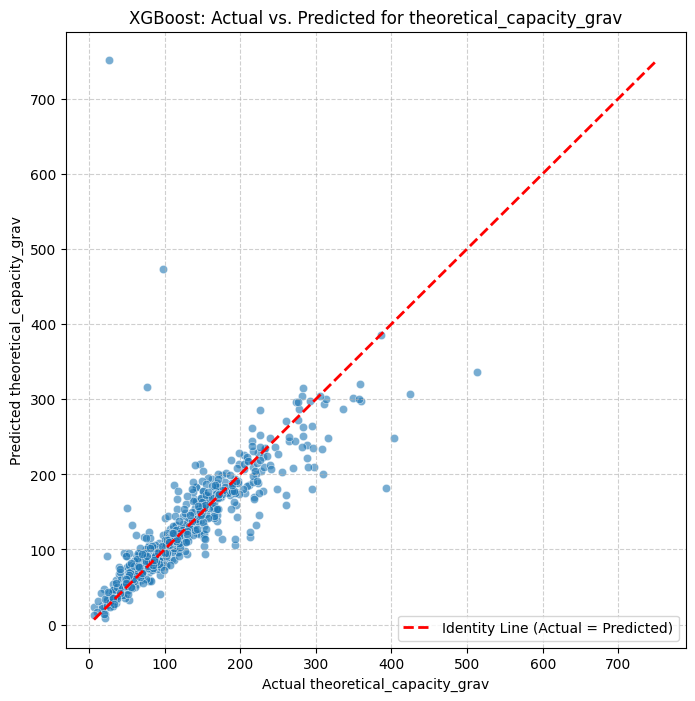

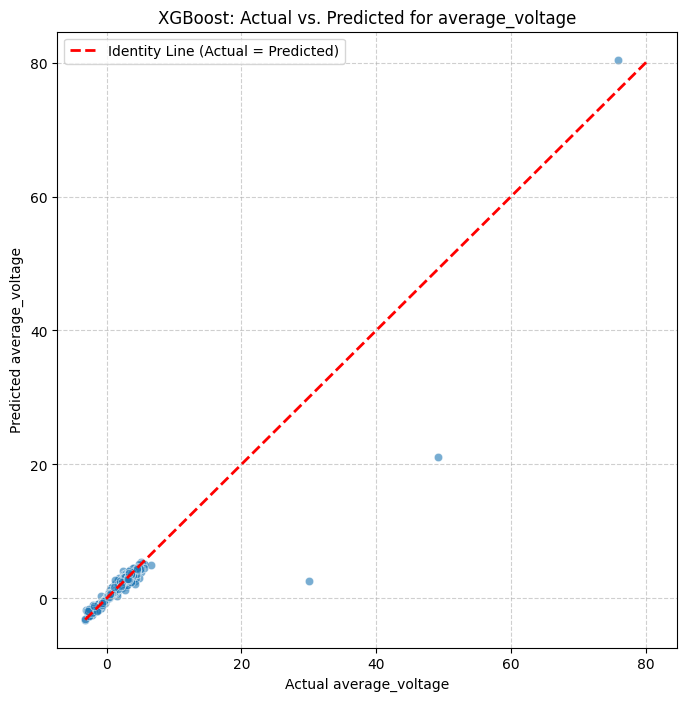

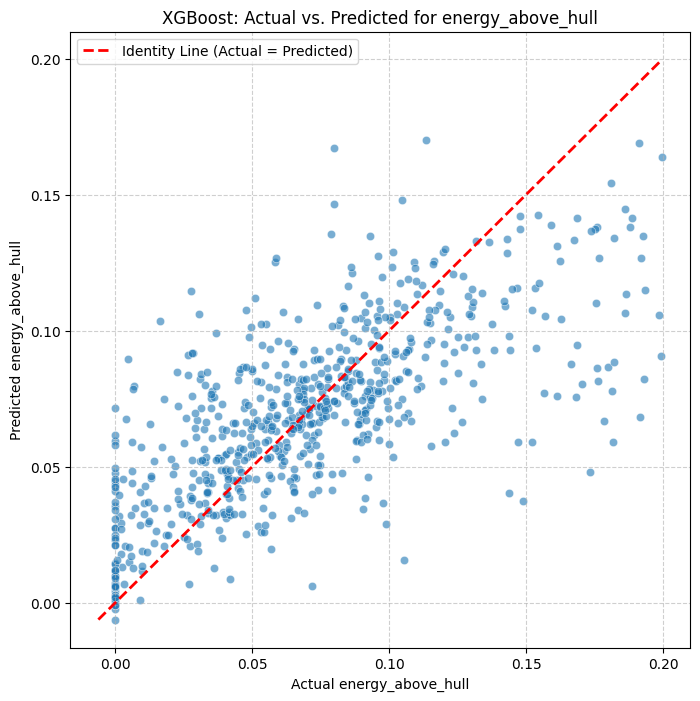


--- Generating Actual vs. Predicted Plots for Random Forest ---
  Predictions obtained for Random Forest. Shape: (689, 3)


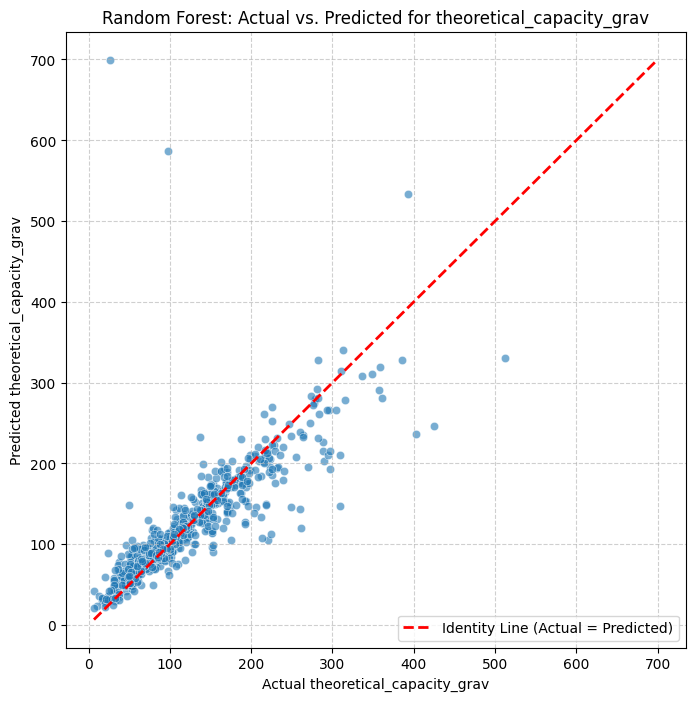

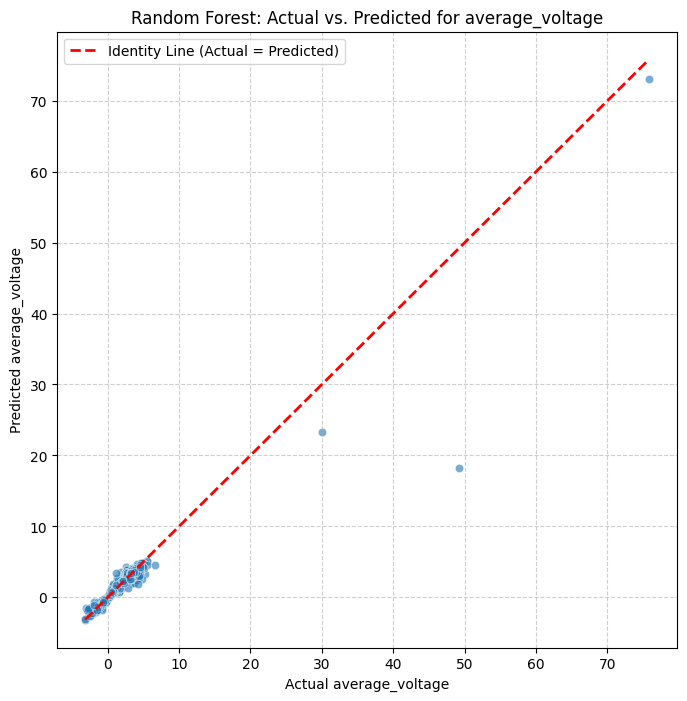

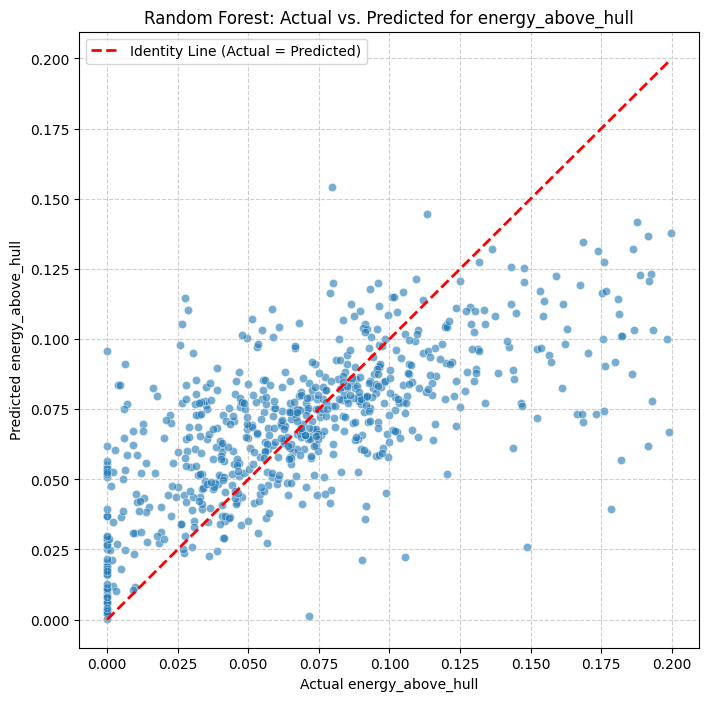


--- Generating Actual vs. Predicted Plots for LightGBM ---
  Predictions obtained for LightGBM. Shape: (689, 3)


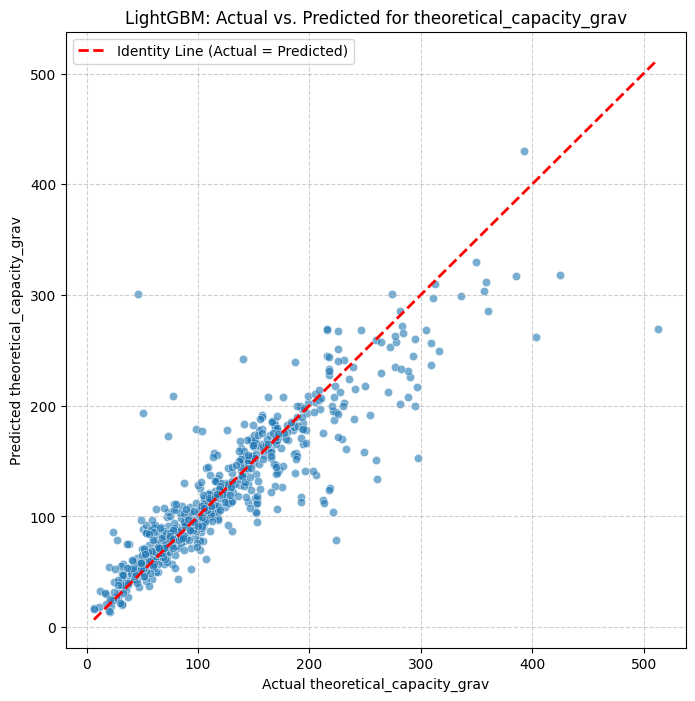

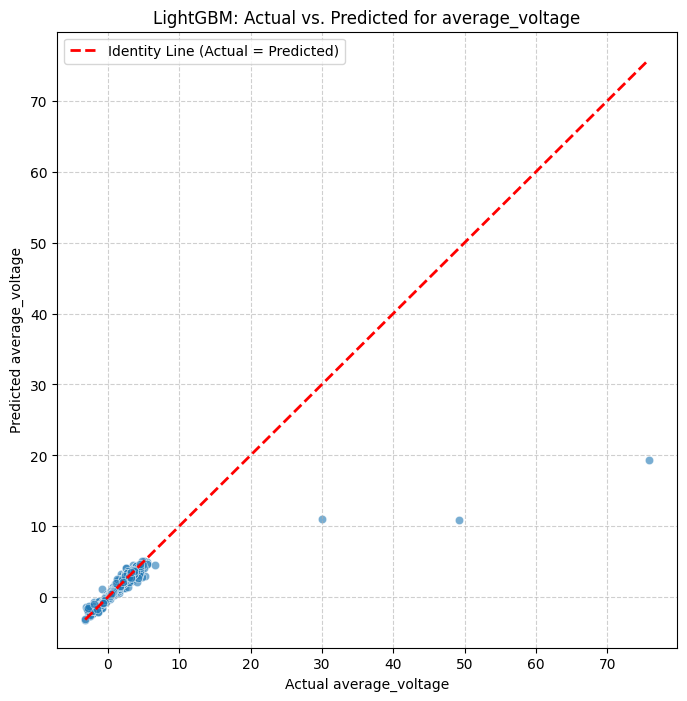

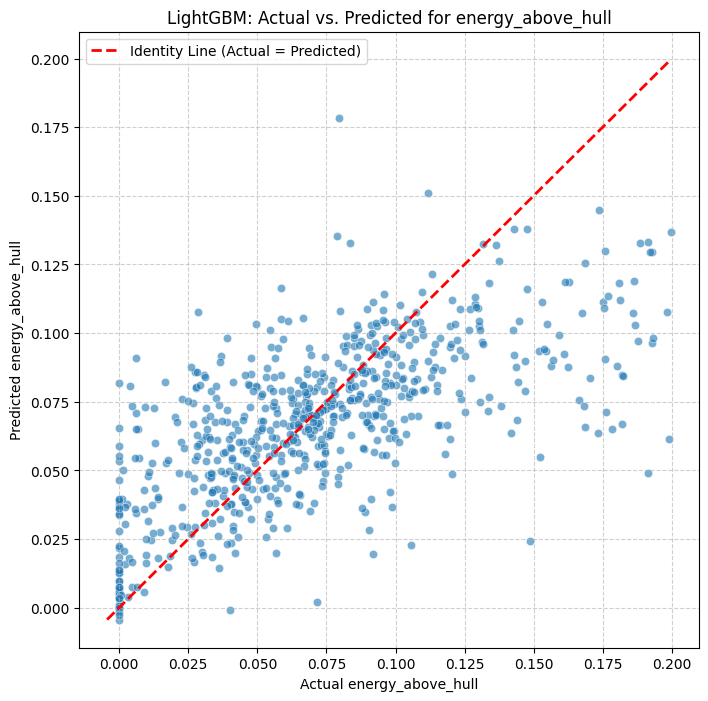

In [ ]:
# Ensure y_test_values and target_kpis are available
if 'y_test_values' not in locals() or 'target_kpis' not in locals():
    print("Error: y_test_values or target_kpis not found. Please run the evaluation cell first.")
else:
    # Define the models to plot predictions for
    models_to_plot = {
        "XGBoost": loaded_xgboost_model,
        "Random Forest": loaded_random_forest_model,
        "LightGBM": loaded_lightgbm_model
    }

    for model_name, model in models_to_plot.items():
        print(f"\n--- Generating Actual vs. Predicted Plots for {model_name} ---")

        try:
            # Make predictions using the current model
            y_pred = model.predict(X_test_scaled)
            print(f"  Predictions obtained for {model_name}. Shape: {y_pred.shape}")

            for i, kpi in enumerate(target_kpis):
                y_test_kpi = y_test_values[:, i]
                y_pred_kpi = y_pred[:, i]

                plt.figure(figsize=(8, 8))
                sns.scatterplot(x=y_test_kpi, y=y_pred_kpi, alpha=0.6)

                # Add the y=x identity line
                # Determine the range for the line based on the min and max of actual and predicted values
                min_val = min(y_test_kpi.min(), y_pred_kpi.min())
                max_val = max(y_test_kpi.max(), y_pred_kpi.max())
                plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Identity Line (Actual = Predicted)')

                plt.title(f'{model_name}: Actual vs. Predicted for {kpi}')
                plt.xlabel(f'Actual {kpi}')
                plt.ylabel(f'Predicted {kpi}')
                plt.grid(True, linestyle='--', alpha=0.6)
                plt.legend()
                plt.show()

        except Exception as e:
            print(f"\nError generating plots for {model_name}: {e}")


#### Absolute Error Plot


--- Plotting Absolute Errors per sample for All Models ---

--- Analyzing Absolute Errors for XGBoost ---
  Generating plots for absolute error of XGBoost...


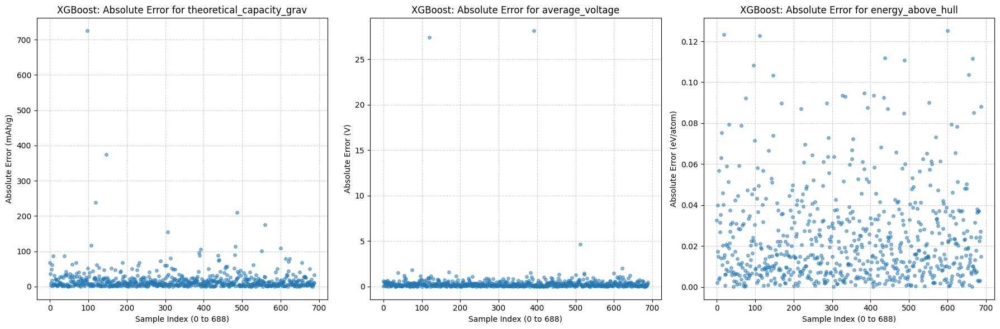

--- Finished plotting Absolute Errors for XGBoost ---

--- Analyzing Absolute Errors for Random Forest ---
  Generating plots for absolute error of Random Forest...


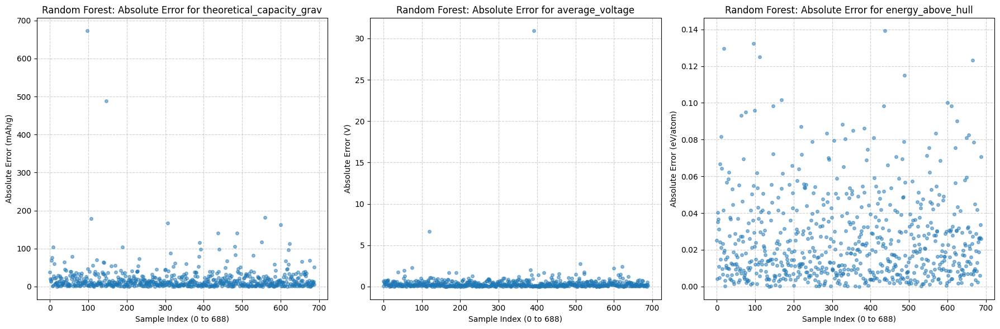

--- Finished plotting Absolute Errors for Random Forest ---

--- Analyzing Absolute Errors for LightGBM ---
  Generating plots for absolute error of LightGBM...


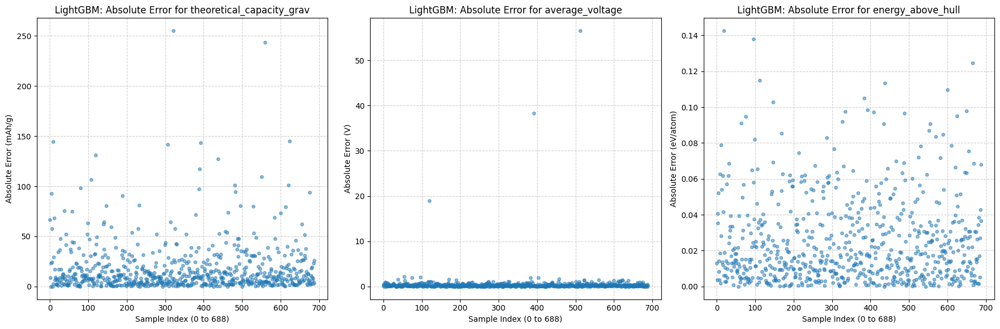

--- Finished plotting Absolute Errors for LightGBM ---


In [ ]:
# Absolute Error Plot for all models

# Ensure y_test_values and target_kpis are available
if 'y_test_values' not in locals() or 'target_kpis' not in locals():
    print("Error: y_test_values or target_kpis not found. Please run the evaluation cell first.")
else:
    # Define the models to plot errors for
    models_to_plot = {
        "XGBoost": loaded_xgboost_model,
        "Random Forest": loaded_random_forest_model,
        "LightGBM": loaded_lightgbm_model
    }

    # Define units for each KPI
    kpi_units = {
        'theoretical_capacity_grav': 'mAh/g',
        'average_voltage': 'V',
        'energy_above_hull': 'eV/atom'}

    print("\n--- Plotting Absolute Errors per sample for All Models ---")

    for model_name, model in models_to_plot.items():
        print(f"\n--- Analyzing Absolute Errors for {model_name} ---")

        try:
            # Make predictions using the current model to calculate errors
            y_pred = model.predict(X_test_scaled)

            # Calculate Absolute Errors for this model
            absolute_errors_df = pd.DataFrame(index=y_test.index)
            for i, kpi in enumerate(target_kpis):
                y_test_kpi = y_test_values[:, i]
                y_pred_kpi = y_pred[:, i]
                abs_error = np.abs(y_test_kpi - y_pred_kpi)
                absolute_errors_df[kpi] = abs_error

            # --- Plotting Absolute Error per sample for the current model ---
            num_kpis = len(target_kpis)
            fig, axes = plt.subplots(1, num_kpis, figsize=(6 * num_kpis, 6))
            if num_kpis == 1:
                axes = [axes]

            print(f"  Generating plots for absolute error of {model_name}...")

            for i, kpi in enumerate(target_kpis):
                # Get the absolute errors for the current KPI
                kpi_absolute_errors = absolute_errors_df[kpi]

                # Create a temporary DataFrame with a reset index for plotting
                plot_data = kpi_absolute_errors.reset_index(drop=True)

                # Create the plot on the corresponding axis
                axes[i].plot(plot_data.index, plot_data.values, marker='o', linestyle='', alpha=0.5, markersize=4)

                axes[i].set_title(f'{model_name}: Absolute Error for {kpi}')
                axes[i].set_xlabel('Sample Index (0 to 688)')

                # Include units in the y-axis label
                y_label = f'Absolute Error ({kpi_units.get(kpi, "Units Unknown")})'
                axes[i].set_ylabel(y_label)

                axes[i].grid(True, linestyle='--', alpha=0.6)

            # Adjust layout to prevent titles/labels overlapping
            plt.tight_layout()
            plt.show()
            print(f"--- Finished plotting Absolute Errors for {model_name} ---")

        except Exception as e:
            print(f"\nError calculating or plotting errors for {model_name}: {e}")


#### Relative Error plot


--- Plotting Relative Errors per sample for All Models ---

--- Analyzing Relative Errors for XGBoost ---


/tmp/ipython-input-58-1459014402.py:33: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


  Generating plots for relative error of XGBoost...
Generated plot for relative error of theoretical_capacity_grav for XGBoost. Plotted 689 samples.
Generated plot for relative error of average_voltage for XGBoost. Plotted 689 samples.
Generated plot for relative error of energy_above_hull for XGBoost. Plotted 643 samples.


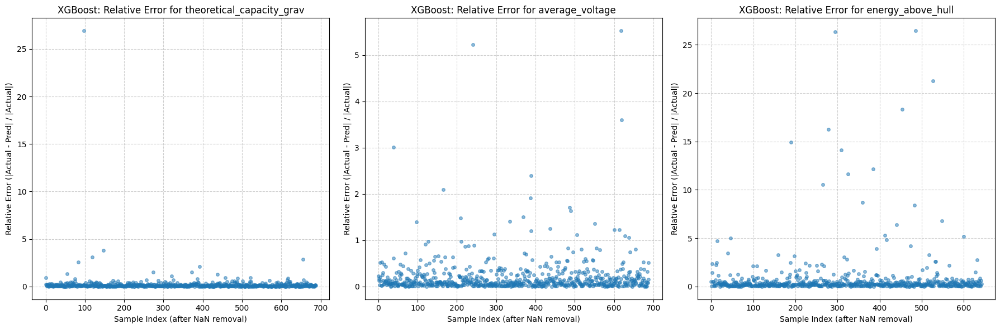

--- Finished plotting Relative Errors for XGBoost ---

--- Analyzing Relative Errors for Random Forest ---


/tmp/ipython-input-58-1459014402.py:33: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


  Generating plots for relative error of Random Forest...
Generated plot for relative error of theoretical_capacity_grav for Random Forest. Plotted 689 samples.
Generated plot for relative error of average_voltage for Random Forest. Plotted 689 samples.
Generated plot for relative error of energy_above_hull for Random Forest. Plotted 643 samples.


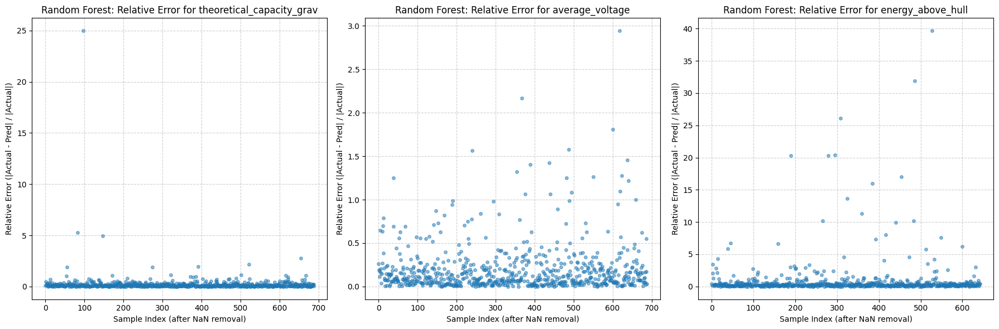

--- Finished plotting Relative Errors for Random Forest ---

--- Analyzing Relative Errors for LightGBM ---
  Generating plots for relative error of LightGBM...
Generated plot for relative error of theoretical_capacity_grav for LightGBM. Plotted 689 samples.
Generated plot for relative error of average_voltage for LightGBM. Plotted 689 samples.
Generated plot for relative error of energy_above_hull for LightGBM. Plotted 643 samples.


/tmp/ipython-input-58-1459014402.py:33: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation


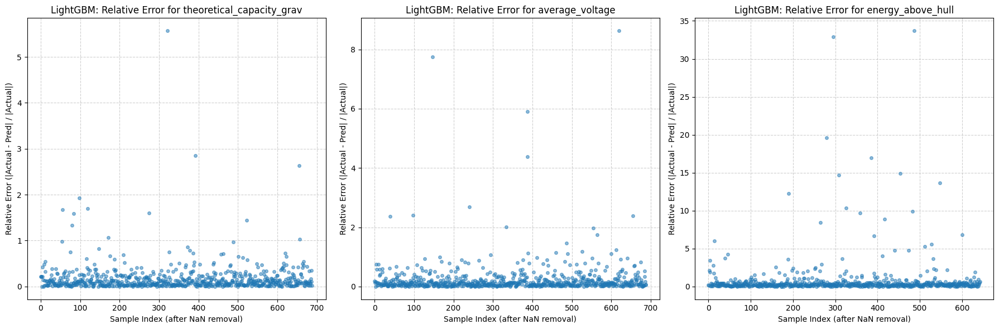

--- Finished plotting Relative Errors for LightGBM ---


In [ ]:
# Relative error plot per sample for all models

# Ensure y_test_values and target_kpis are available
if 'y_test_values' not in locals() or 'target_kpis' not in locals():
    print("Error: y_test_values or target_kpis not found. Please run the evaluation cell first.")
else:
    # Define the models to plot errors for
    models_to_plot = {
        "XGBoost": loaded_xgboost_model,
        "Random Forest": loaded_random_forest_model,
        "LightGBM": loaded_lightgbm_model
    }

    print("\n--- Plotting Relative Errors per sample for All Models ---")

    for model_name, model in models_to_plot.items():
        print(f"\n--- Analyzing Relative Errors for {model_name} ---")

        try:
            # Make predictions using the current model to calculate errors
            y_pred = model.predict(X_test_scaled)

            # Calculate Relative Errors for this model
            relative_errors_df = pd.DataFrame(index=y_test.index)
            for i, kpi in enumerate(target_kpis):
                y_test_kpi = y_test_values[:, i]
                y_pred_kpi = y_pred[:, i]

                # Calculate Relative Error: |Actual - Predicted| / |Actual|
                # Handle cases where the actual value is zero to avoid division errors
                relative_error = np.where(
                    y_test_kpi != 0,  # Condition: actual value is not zero
                    np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation
                    np.nan # Result if actual is zero (set to NaN)
                )
                relative_errors_df[kpi] = relative_error

            # --- Plotting Relative Error per sample for the current model ---
            num_kpis = len(target_kpis)
            fig, axes = plt.subplots(1, num_kpis, figsize=(6 * num_kpis, 6))
            if num_kpis == 1:
                axes = [axes]

            print(f"  Generating plots for relative error of {model_name}...")

            for i, kpi in enumerate(target_kpis):
                # Get the relative errors for the current KPI and drop NaNs
                kpi_relative_errors = relative_errors_df[kpi].dropna()

                # Create a temporary DataFrame with a reset index for plotting
                plot_data = kpi_relative_errors.reset_index(drop=True)

                # Create the plot on the corresponding axis
                axes[i].plot(plot_data.index, plot_data.values, marker='o', linestyle='', alpha=0.5, markersize=4)

                axes[i].set_title(f'{model_name}: Relative Error for {kpi}')
                axes[i].set_xlabel('Sample Index (after NaN removal)')
                axes[i].set_ylabel('Relative Error (|Actual - Pred| / |Actual|)')
                axes[i].grid(True, linestyle='--', alpha=0.6)

                print(f"Generated plot for relative error of {kpi} for {model_name}. Plotted {len(kpi_relative_errors)} samples.")


            # Adjust layout to prevent titles/labels overlapping
            plt.tight_layout()
            plt.show()
            print(f"--- Finished plotting Relative Errors for {model_name} ---")


        except Exception as e:
            print(f"\nError calculating or plotting errors for {model_name}: {e}")


#### Logarithmic Error Plot


--- Plotting Logarithmic Absolute and Relative Errors per sample for All Models ---

--- Analyzing Errors for XGBoost for Logarithmic Plots ---
  Generating logarithmic plots for XGBoost...
Generated log plots for theoretical_capacity_grav for XGBoost. Plotted 689 abs samples, 689 rel samples.
Generated log plots for average_voltage for XGBoost. Plotted 689 abs samples, 689 rel samples.
Generated log plots for energy_above_hull for XGBoost. Plotted 689 abs samples, 643 rel samples.


/tmp/ipython-input-59-1926314055.py:45: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi),


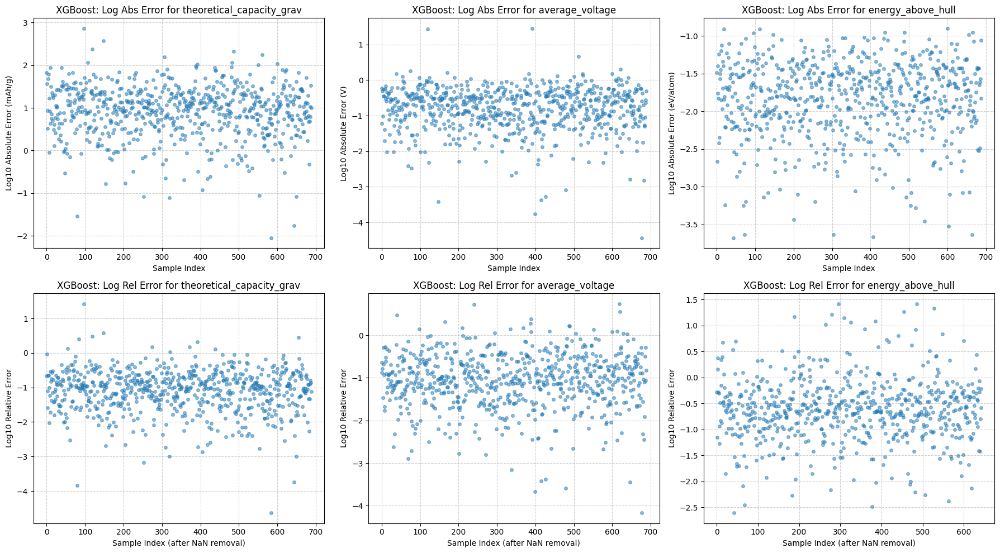

--- Finished plotting Logarithmic Errors for XGBoost ---

--- Analyzing Errors for Random Forest for Logarithmic Plots ---


/tmp/ipython-input-59-1926314055.py:45: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi),


  Generating logarithmic plots for Random Forest...
Generated log plots for theoretical_capacity_grav for Random Forest. Plotted 689 abs samples, 689 rel samples.
Generated log plots for average_voltage for Random Forest. Plotted 689 abs samples, 689 rel samples.
Generated log plots for energy_above_hull for Random Forest. Plotted 689 abs samples, 643 rel samples.


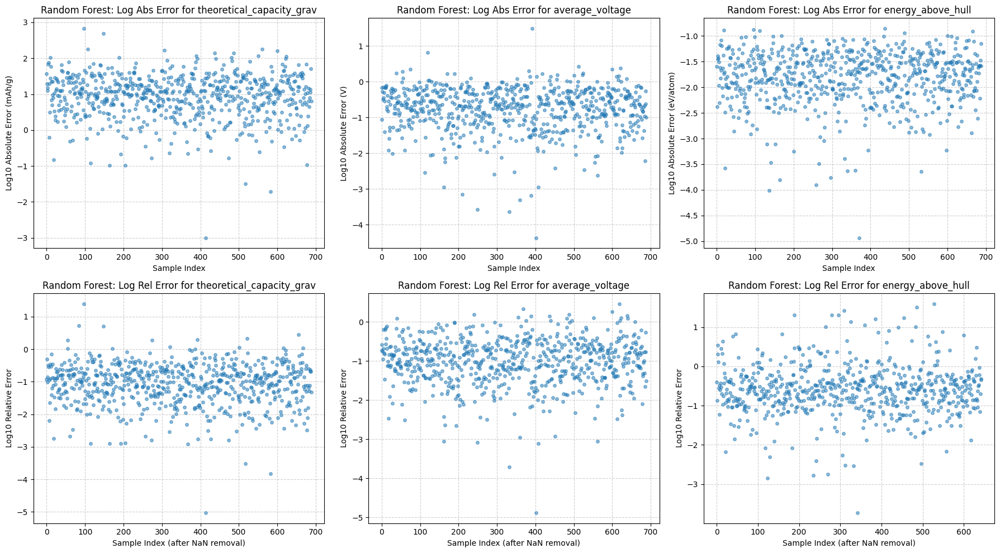

--- Finished plotting Logarithmic Errors for Random Forest ---

--- Analyzing Errors for LightGBM for Logarithmic Plots ---
  Generating logarithmic plots for LightGBM...
Generated log plots for theoretical_capacity_grav for LightGBM. Plotted 689 abs samples, 689 rel samples.
Generated log plots for average_voltage for LightGBM. Plotted 689 abs samples, 689 rel samples.
Generated log plots for energy_above_hull for LightGBM. Plotted 689 abs samples, 643 rel samples.


/tmp/ipython-input-59-1926314055.py:45: RuntimeWarning: divide by zero encountered in divide
  np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi),


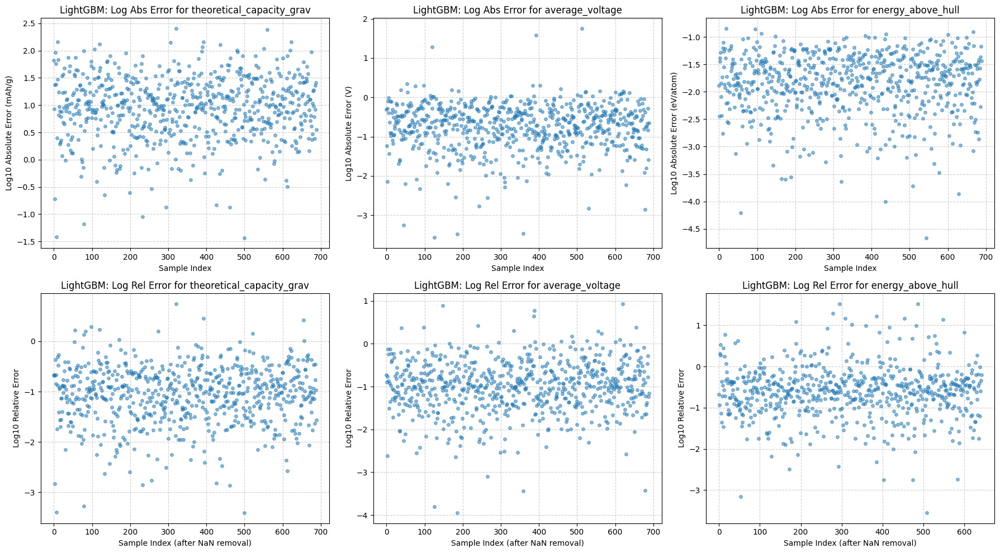

--- Finished plotting Logarithmic Errors for LightGBM ---


In [ ]:
# Logarithmic Error Plot for Absolute and Relative Errors for all models

# Ensure y_test_values and target_kpis are available
if 'y_test_values' not in locals() or 'target_kpis' not in locals():
    print("Error: y_test_values or target_kpis not found. Please run the evaluation cell first.")
else:
    # Define the models to plot errors for
    models_to_plot = {
        "XGBoost": loaded_xgboost_model,
        "Random Forest": loaded_random_forest_model,
        "LightGBM": loaded_lightgbm_model
    }

    print("\n--- Plotting Logarithmic Absolute and Relative Errors per sample for All Models ---")

    # Define units for each KPI for plotting
    kpi_units = {
        'theoretical_capacity_grav': 'mAh/g',
        'average_voltage': 'V',
        'energy_above_hull': 'eV/atom'
    }

    for model_name, model in models_to_plot.items():
        print(f"\n--- Analyzing Errors for {model_name} for Logarithmic Plots ---")

        try:
            # Make predictions using the current model to calculate errors
            y_pred = model.predict(X_test_scaled)

            # Calculate Absolute and Relative Errors for this model
            absolute_errors_df = pd.DataFrame(index=y_test.index)
            relative_errors_df = pd.DataFrame(index=y_test.index)

            for i, kpi in enumerate(target_kpis):
                y_test_kpi = y_test_values[:, i]
                y_pred_kpi = y_pred[:, i]

                # Calculate Absolute Error
                abs_error = np.abs(y_test_kpi - y_pred_kpi)
                absolute_errors_df[kpi] = abs_error

                # Calculate Relative Error (handling division by zero)
                relative_error = np.where(
                    y_test_kpi != 0,
                    np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi),
                    np.nan
                )
                relative_errors_df[kpi] = relative_error

            # --- Logarithmic Error Plotting for the current model ---
            num_kpis = len(target_kpis)
            fig, axes = plt.subplots(2, num_kpis, figsize=(6 * num_kpis, 10))

            if num_kpis == 1:
                axes = axes.reshape(2, 1)

            print(f"  Generating logarithmic plots for {model_name}...")

            for i, kpi in enumerate(target_kpis):
                # Logarithmic Absolute Error Plot
                kpi_absolute_errors = absolute_errors_df[kpi]
                log_abs_errors = np.log10(kpi_absolute_errors + 1e-9) # Add small epsilon

                plot_data_abs = pd.DataFrame({'log_error': log_abs_errors}).reset_index(drop=True)

                axes[0, i].plot(plot_data_abs.index, plot_data_abs['log_error'], marker='o', linestyle='', alpha=0.5, markersize=4)
                axes[0, i].set_title(f'{model_name}: Log Abs Error for {kpi}')
                axes[0, i].set_xlabel('Sample Index')
                y_label_abs = f'Log10 Absolute Error ({kpi_units.get(kpi, "Units Unknown")})'
                axes[0, i].set_ylabel(y_label_abs)
                axes[0, i].grid(True, linestyle='--', alpha=0.6)

                # Logarithmic Relative Error Plot
                kpi_relative_errors = relative_errors_df[kpi].dropna() # Drop NaNs
                log_rel_errors = np.log10(kpi_relative_errors + 1e-9) # Add small epsilon

                plot_data_rel = pd.DataFrame({'log_error': log_rel_errors}).reset_index(drop=True)

                axes[1, i].plot(plot_data_rel.index, plot_data_rel['log_error'], marker='o', linestyle='', alpha=0.5, markersize=4)
                axes[1, i].set_title(f'{model_name}: Log Rel Error for {kpi}')
                axes[1, i].set_xlabel('Sample Index (after NaN removal)')
                axes[1, i].set_ylabel('Log10 Relative Error')
                axes[1, i].grid(True, linestyle='--', alpha=0.6)

                print(f"Generated log plots for {kpi} for {model_name}. Plotted {len(kpi_absolute_errors)} abs samples, {len(kpi_relative_errors)} rel samples.")


            plt.tight_layout()
            plt.show()
            print(f"--- Finished plotting Logarithmic Errors for {model_name} ---")

        except Exception as e:
            print(f"\nError calculating or plotting errors for {model_name}: {e}")


### Model Interpretability (using SHAP Values)

In [ ]:
import shap

In [ ]:
# Create SHAP Explainers for All MultiOutputRegressors

# Define the models for which to create SHAP explainers
models_for_shap = {
    "XGBoost": loaded_xgboost_model,
    "Random Forest": loaded_random_forest_model,
    "LightGBM": loaded_lightgbm_model
}

# Dictionary to store explainers for all models and each target KPI
all_models_kpi_explainers = {}

print("\n--- Creating SHAP explainers for all loaded models ---")

for model_name, model_for_shap in models_for_shap.items():
    print(f"\n--- Creating explainers for {model_name} ---")

    # Check if the model is a MultiOutputRegressor and has estimators
    if isinstance(model_for_shap, MultiOutputRegressor) and hasattr(model_for_shap, 'estimators_'):
        print(f"{model_name} is a MultiOutputRegressor. Creating explainers for each estimator.")
        # Create a dictionary to store explainers for each target KPI for this model
        kpi_explainers = {}
        for i, estimator in enumerate(model_for_shap.estimators_):
            kpi_name = target_kpis[i] # Get the name of the target KPI
            print(f"  Creating explainer for estimator predicting {kpi_name} ({model_name} Estimator {i+1}/{len(model_for_shap.estimators_)})...")
            try:
                # Use TreeExplainer for the individual tree-based estimator
                kpi_explainers[kpi_name] = shap.TreeExplainer(estimator)
                print(f"  Explainer created for {kpi_name} ({model_name}).")
            except Exception as e:
                print(f"  Error creating SHAP explainer for {kpi_name} ({model_name}): {e}")
                # Decide if you want to skip this KPI/model or exit
                print(f"  Skipping SHAP explainer creation for {kpi_name} for {model_name} due to error.")
                kpi_explainers[kpi_name] = None # Store None to indicate failure

        # Store the KPI explainers for this model in the overall dictionary
        all_models_kpi_explainers[model_name] = kpi_explainers
        print(f"\nSHAP explainers created/attempted for all target KPIs for {model_name}.")

    else:
        print(f"{model_name} is not a MultiOutputRegressor or does not have estimators_. Cannot create explainers using this method.")
        all_models_kpi_explainers[model_name] = None # Store None if explainers couldn't be created


print("\n--- SHAP explainers creation process complete for all loaded models ---")

# Inspect the all_models_kpi_explainers dictionary if needed
# print(all_models_kpi_explainers.keys())
# print(all_models_kpi_explainers['XGBoost'].keys())


--- Creating SHAP explainers for all loaded models ---

--- Creating explainers for XGBoost ---
XGBoost is a MultiOutputRegressor. Creating explainers for each estimator.
  Creating explainer for estimator predicting theoretical_capacity_grav (XGBoost Estimator 1/3)...
  Explainer created for theoretical_capacity_grav (XGBoost).
  Creating explainer for estimator predicting average_voltage (XGBoost Estimator 2/3)...
  Explainer created for average_voltage (XGBoost).
  Creating explainer for estimator predicting energy_above_hull (XGBoost Estimator 3/3)...
  Explainer created for energy_above_hull (XGBoost).

SHAP explainers created/attempted for all target KPIs for XGBoost.

--- Creating explainers for Random Forest ---
Random Forest is a MultiOutputRegressor. Creating explainers for each estimator.
  Creating explainer for estimator predicting theoretical_capacity_grav (Random Forest Estimator 1/3)...
  Explainer created for theoretical_capacity_grav (Random Forest).
  Creating expla

In [ ]:
# Calculate SHAP Values for All Models and KPIs

print("\n--- Calculating SHAP values for all models and each KPI ---")

shap_results = {}

# Ensure X_test_scaled is a pandas DataFrame for consistent feature name handling
if not isinstance(X_test_scaled, pd.DataFrame):
    print("Warning: X_test_scaled is not a DataFrame. Converting to DataFrame.")

    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=loaded_feature_names if 'loaded_feature_names' in locals() else None)
else:
    X_test_scaled_df = X_test_scaled

# If feature names are still missing after conversion, try to get them
if X_test_scaled_df.columns.empty and 'loaded_feature_names' in locals():
     X_test_scaled_df.columns = loaded_feature_names

# Ensure explainers are available for all models and KPIs
if 'all_models_kpi_explainers' not in locals() or not all_models_kpi_explainers:
    print("Error: SHAP explainers not found. Please run the explainer creation cell first.")
    sys.exit("Exiting due to missing SHAP explainers.")


# Iterate through each model's explainers
for model_name, kpi_explainers in all_models_kpi_explainers.items():
    print(f"\n--- Calculating SHAP values for {model_name} ---")
    if kpi_explainers: # Check if explainers were successfully created for this model
        shap_results[model_name] = {} # Create a nested dictionary for this model

        for kpi, explainer in kpi_explainers.items():
            if explainer: # Check if explainer was successfully created for this KPI
                print(f"  Calculating SHAP values for {kpi} ({model_name})...")
                try:
                    # Calculate SHAP values for the test set
                    # Pass the DataFrame to retain feature names for plotting
                    shap_values = explainer.shap_values(X_test_scaled_df)

                    # Store the shap values for this KPI and model
                    shap_results[model_name][kpi] = shap_values
                    print(f"  SHAP values calculated and stored for {kpi} ({model_name}).")

                except Exception as e:
                    print(f"  Error calculating SHAP values for {kpi} ({model_name}): {e}")
                    # Store None to indicate failure for this specific KPI/model combination
                    shap_results[model_name][kpi] = None
                    print(f"  Skipping SHAP value calculation for {kpi} for {model_name} due to error.")
            else:
                 print(f"  Skipping SHAP value calculation for {kpi} ({model_name}) as explainer was not created.")

    else:
        print(f"  Skipping SHAP value calculation for {model_name} as explainers were not created.")


print("\n--- SHAP values calculated for all models and KPIs ---")



--- Calculating SHAP values for all models and each KPI ---

--- Calculating SHAP values for XGBoost ---
  Calculating SHAP values for theoretical_capacity_grav (XGBoost)...
  SHAP values calculated and stored for theoretical_capacity_grav (XGBoost).
  Calculating SHAP values for average_voltage (XGBoost)...
  SHAP values calculated and stored for average_voltage (XGBoost).
  Calculating SHAP values for energy_above_hull (XGBoost)...
  SHAP values calculated and stored for energy_above_hull (XGBoost).

--- Calculating SHAP values for Random Forest ---
  Calculating SHAP values for theoretical_capacity_grav (Random Forest)...
  SHAP values calculated and stored for theoretical_capacity_grav (Random Forest).
  Calculating SHAP values for average_voltage (Random Forest)...
  SHAP values calculated and stored for average_voltage (Random Forest).
  Calculating SHAP values for energy_above_hull (Random Forest)...
  SHAP values calculated and stored for energy_above_hull (Random Forest).

--

#### SHAP Summary Plots (Dot Plots)


--- Generating SHAP Summary (Dot) Plots for All Models and KPIs ---

--- Generating SHAP Summary (Dot) Plots for XGBoost ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (XGBoost) ---


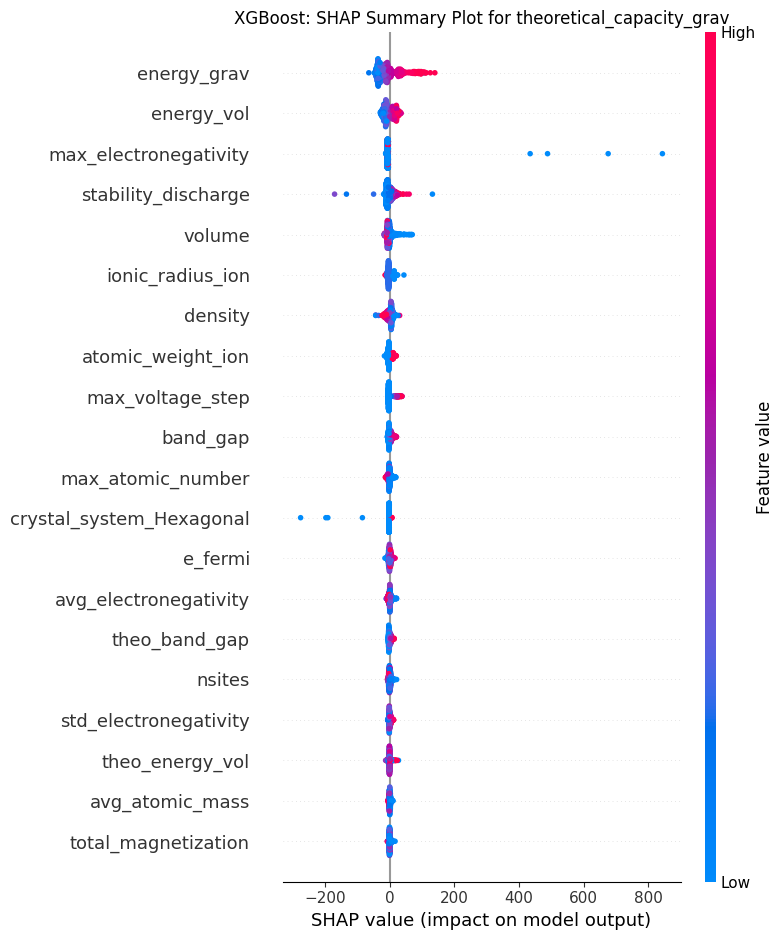

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (XGBoost) ---


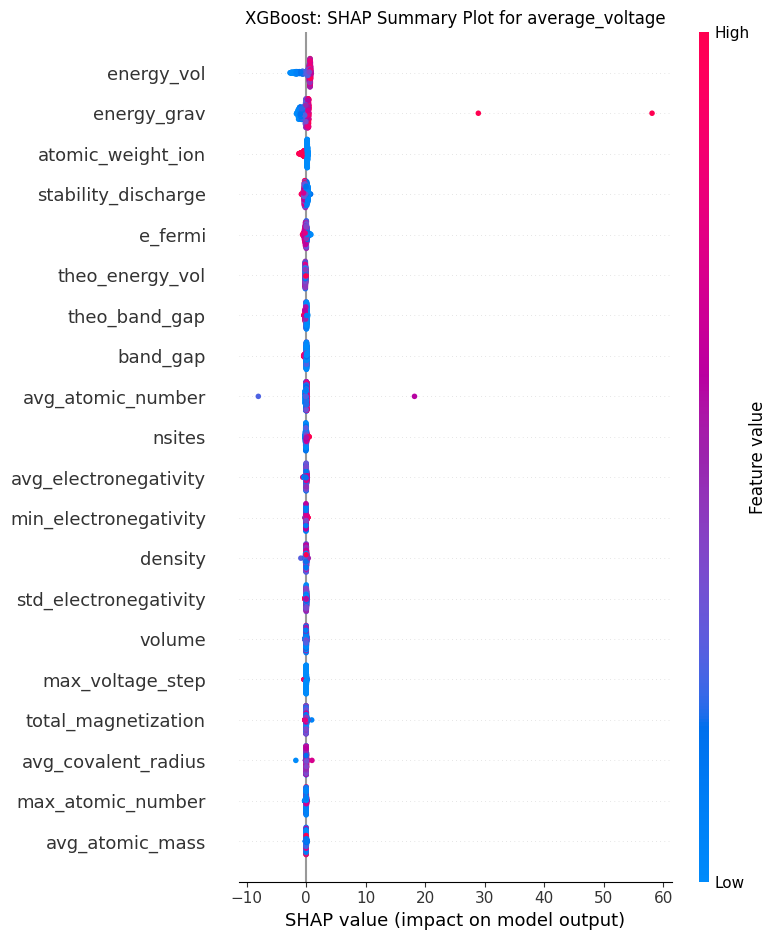

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (XGBoost) ---


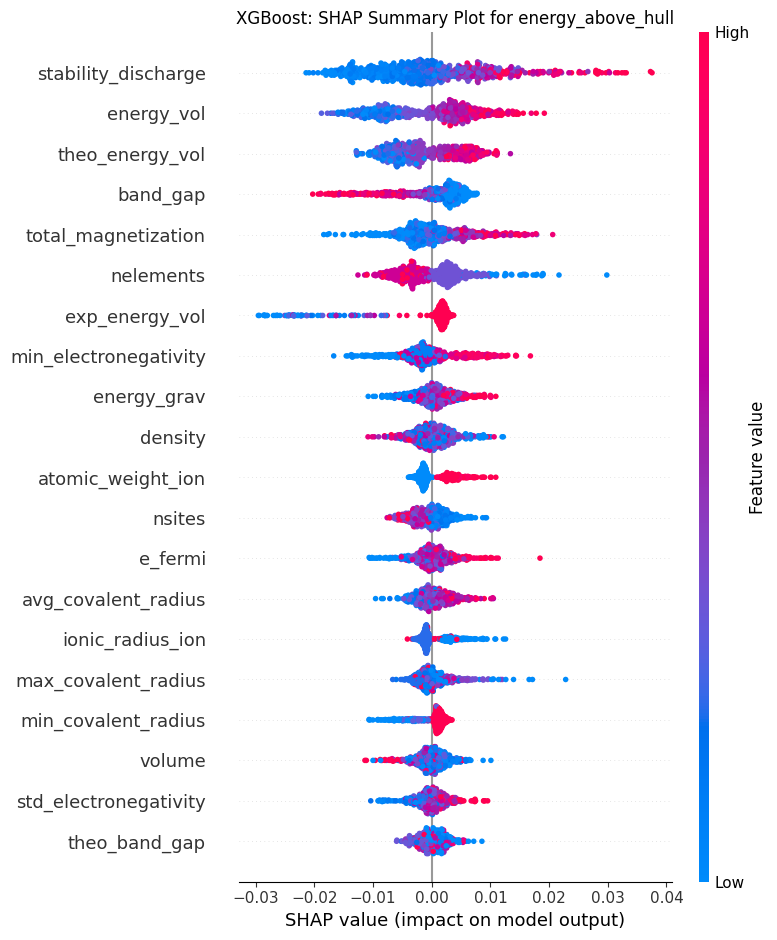


--- Generating SHAP Summary (Dot) Plots for Random Forest ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (Random Forest) ---


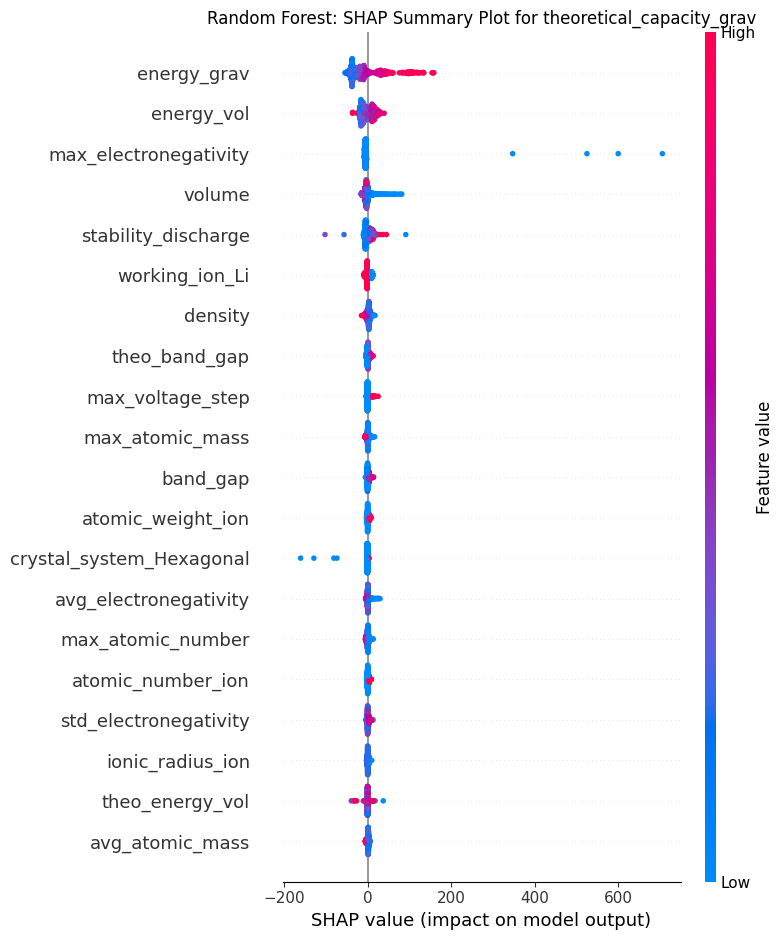

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (Random Forest) ---


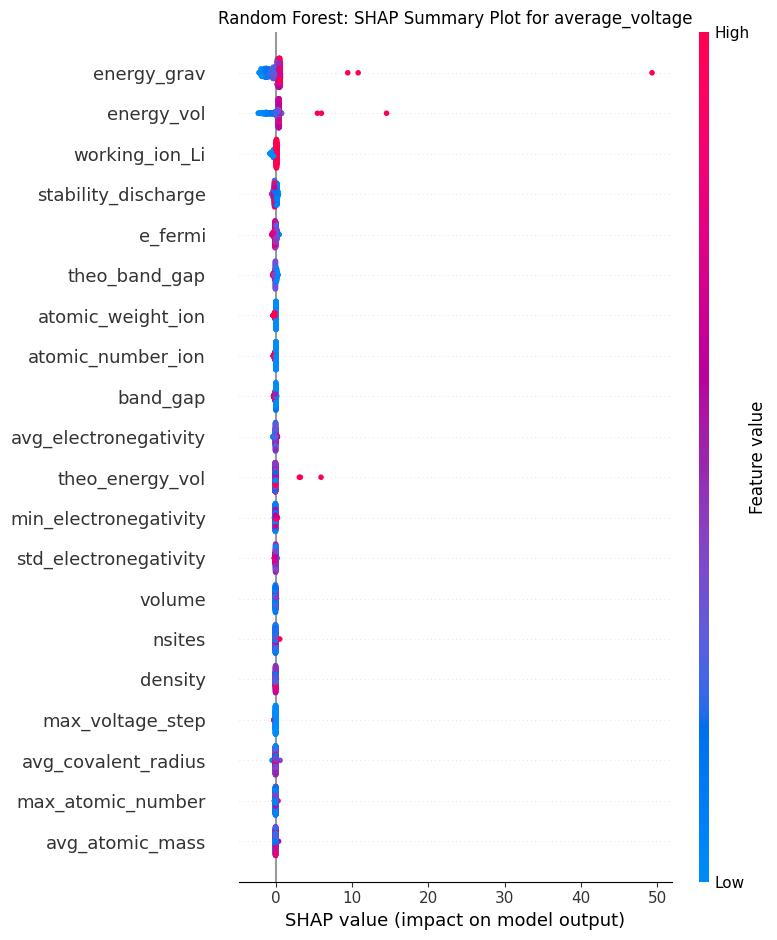

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (Random Forest) ---


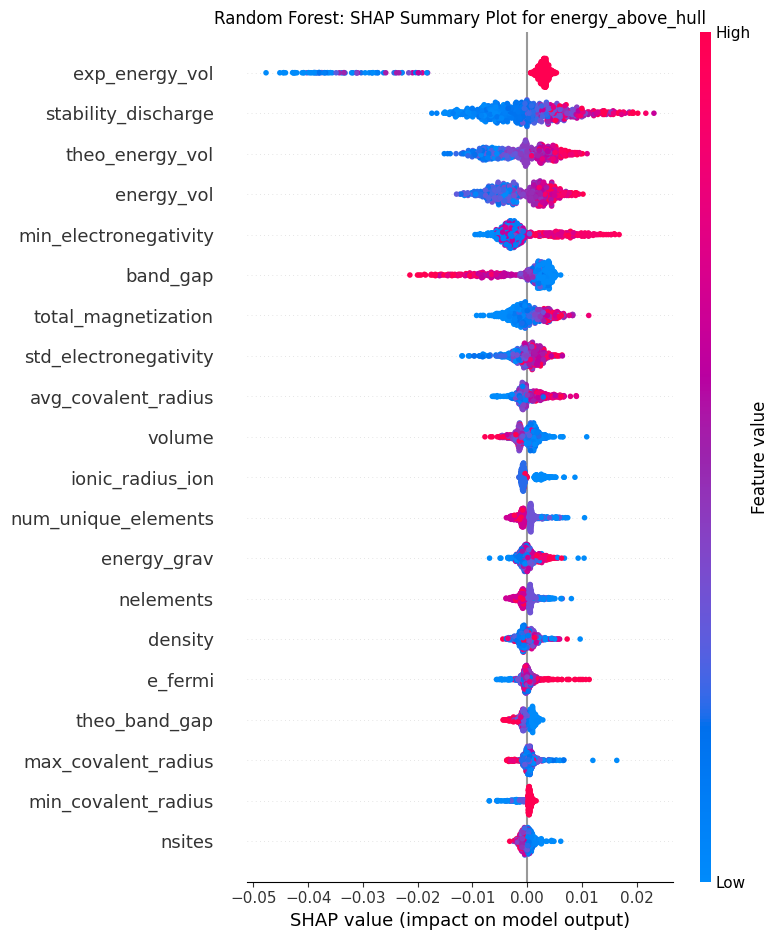


--- Generating SHAP Summary (Dot) Plots for LightGBM ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (LightGBM) ---


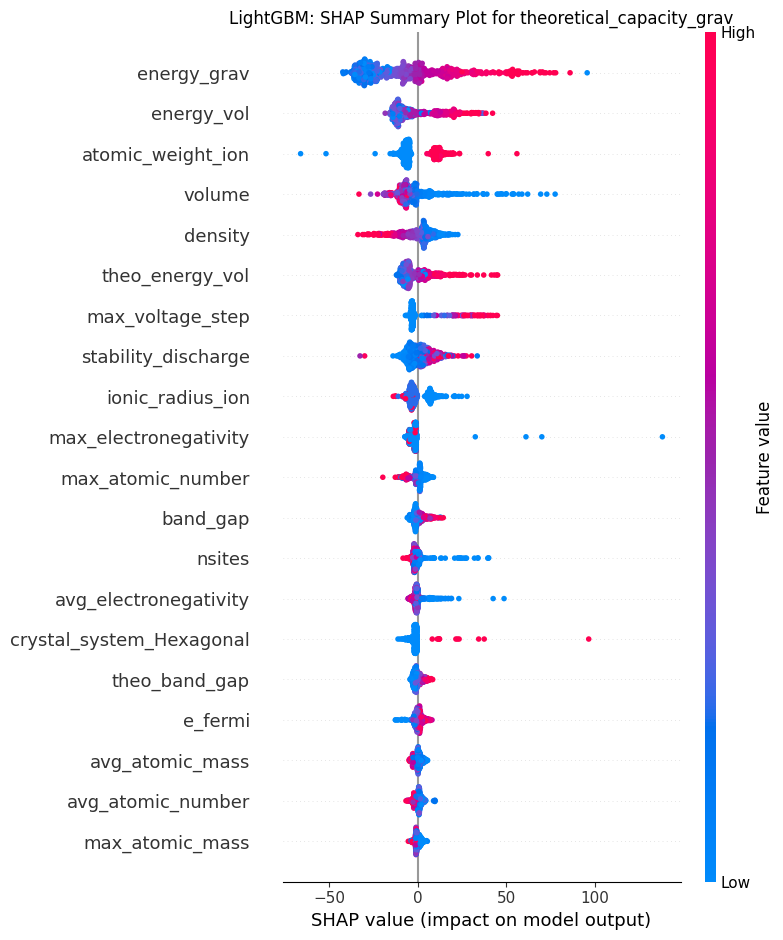

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (LightGBM) ---


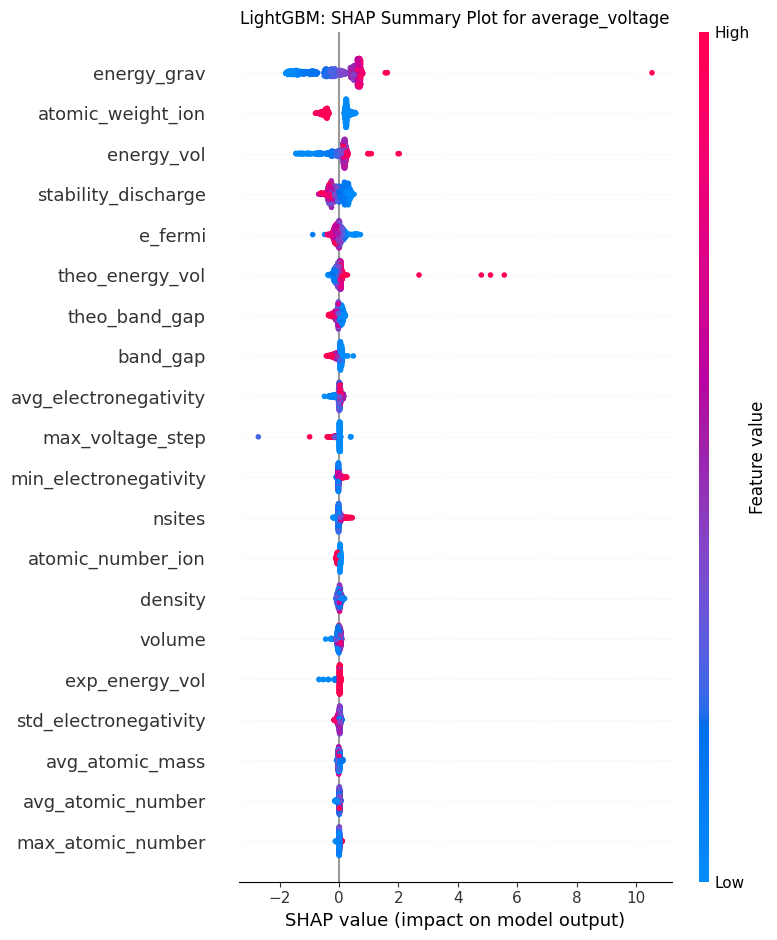

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (LightGBM) ---


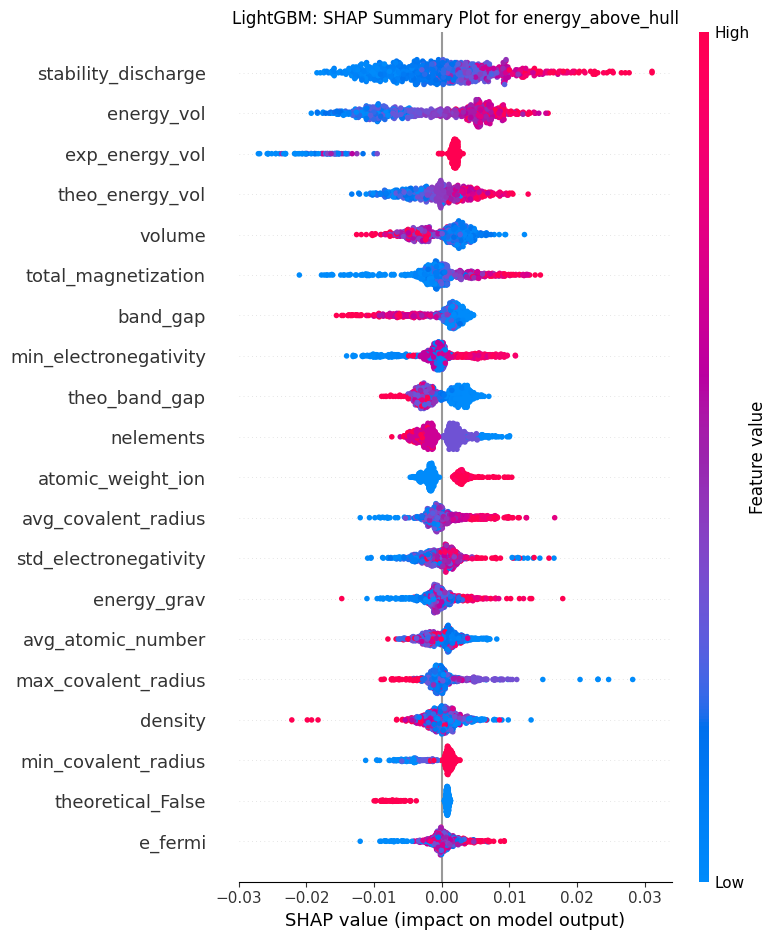

In [ ]:
# Generate SHAP Summary (Dot) Plots for each KPI for all models

if 'shap_results' in locals() and 'target_kpis' in locals() and 'X_test_scaled' in locals():
    print("\n--- Generating SHAP Summary (Dot) Plots for All Models and KPIs ---")

    # Ensure X_test_scaled is a pandas DataFrame for consistent feature name handling in plots
    if not isinstance(X_test_scaled, pd.DataFrame):
        print("Warning: X_test_scaled is not a DataFrame. Converting to DataFrame for plotting.")

        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=loaded_feature_names if 'loaded_feature_names' in locals() else None)
    else:
        X_test_scaled_df = X_test_scaled

    # If feature names are still missing after conversion, try to get them
    if X_test_scaled_df.columns.empty and 'loaded_feature_names' in locals():
         X_test_scaled_df.columns = loaded_feature_names


    # Iterate through each model in the shap_results
    for model_name, kpi_shap_values in shap_results.items():
        print(f"\n--- Generating SHAP Summary (Dot) Plots for {model_name} ---")

        # Iterate through each KPI for the current model
        for kpi, shap_values in kpi_shap_values.items():
            if shap_values is not None: # Check if SHAP values were calculated successfully for this KPI/model
                 print(f"  Generating SHAP Summary (Dot) Plot for KPI: {kpi} ({model_name}) ---")

                 try:
                     # Use the X_test_scaled DataFrame to get feature names for the plot
                     shap.summary_plot(shap_values, X_test_scaled_df, plot_type="dot", show=False)
                     plt.title(f'{model_name}: SHAP Summary Plot for {kpi}')
                     plt.tight_layout()
                     plt.show()
                 except Exception as e:
                     print(f"  Error generating SHAP summary (dot) plot for {kpi} ({model_name}): {e}")
            else:
                 print(f"  SHAP values for {kpi} ({model_name}) are not available. Skipping dot plot.")

else:
    print("Required variables (shap_results, target_kpis, X_test_scaled) not found. Please run previous cells.")


#### SHAP Summary Plots (Bar Plots)


--- Generating SHAP Summary (Bar) Plots for All Models and KPIs ---

--- Generating SHAP Summary (Bar) Plots for XGBoost ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (XGBoost) ---


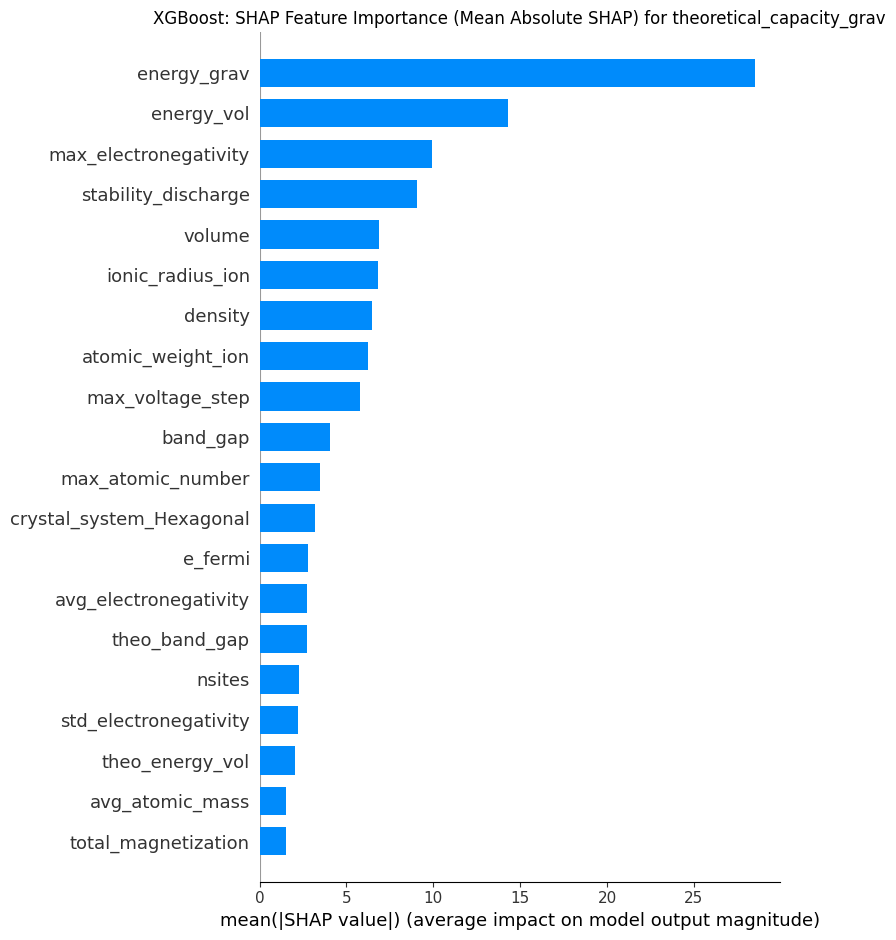

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (XGBoost) ---


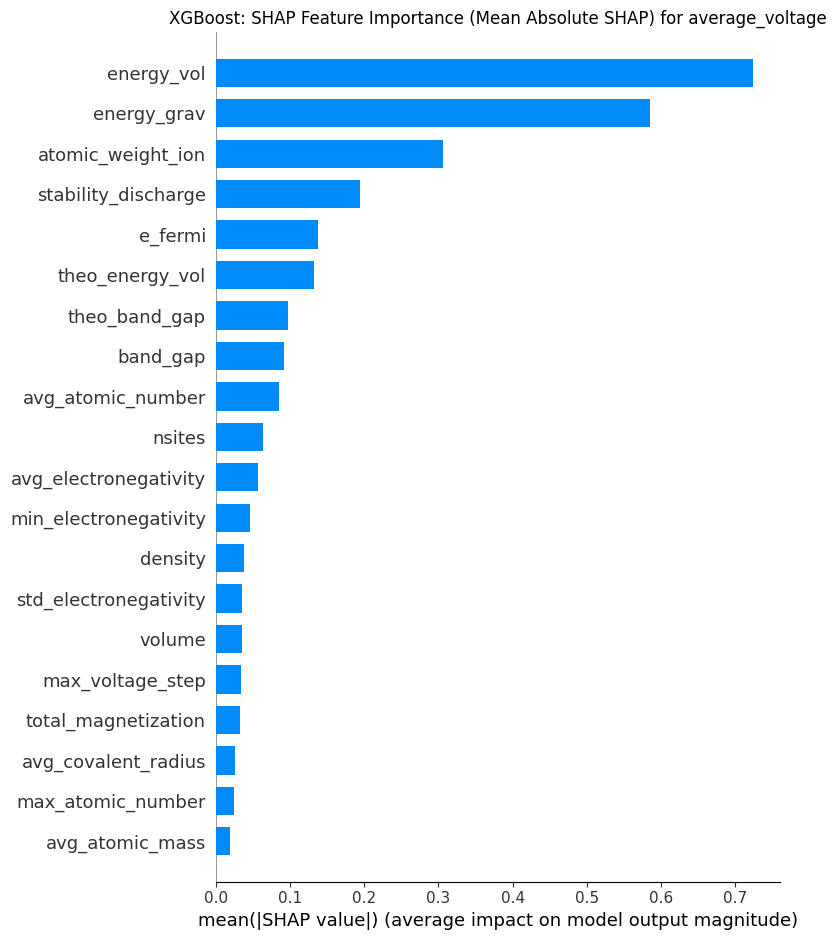

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (XGBoost) ---


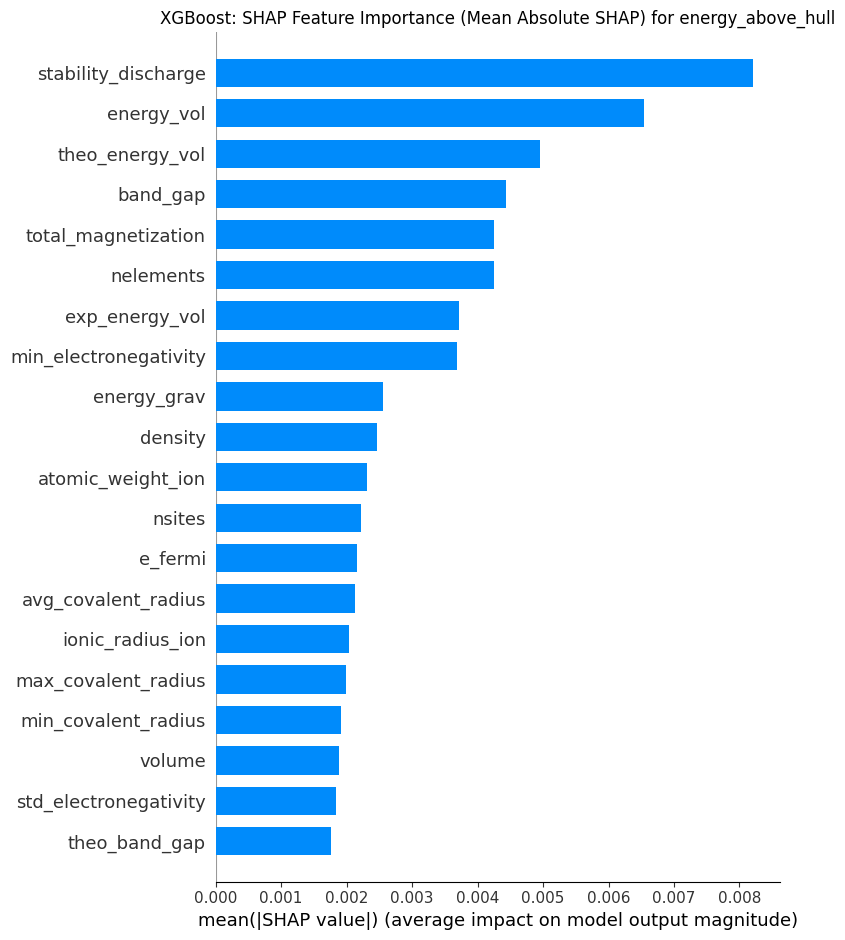


--- Generating SHAP Summary (Bar) Plots for Random Forest ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (Random Forest) ---


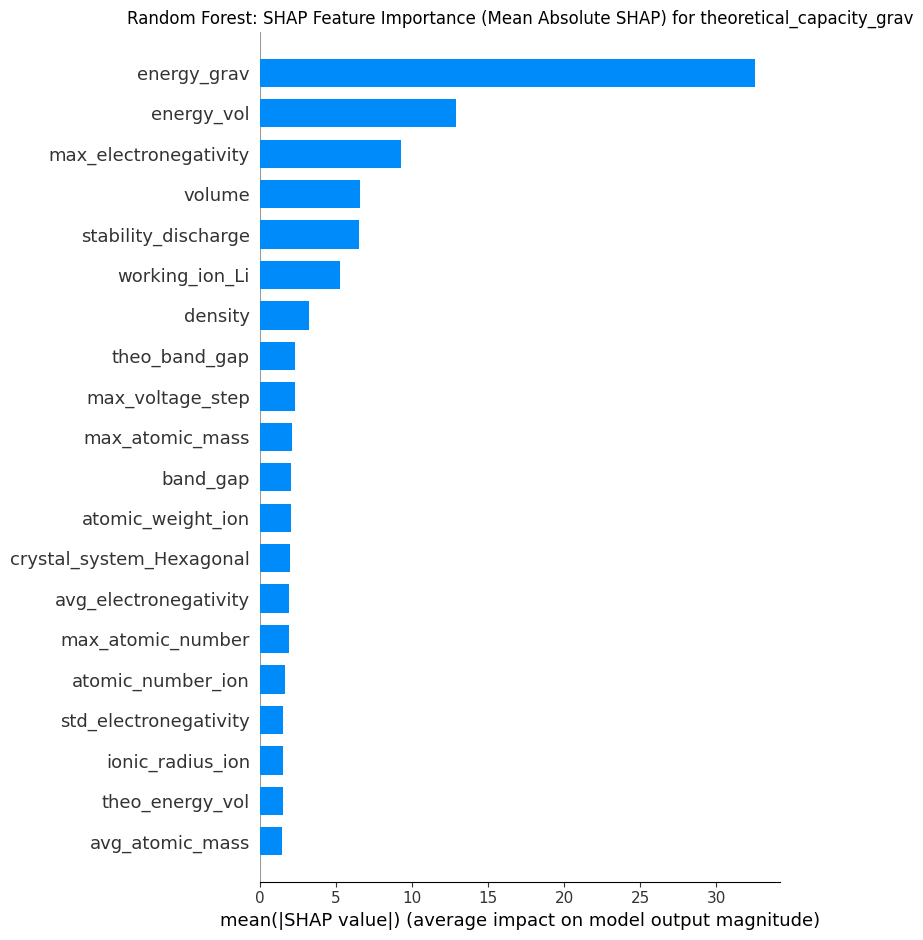

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (Random Forest) ---


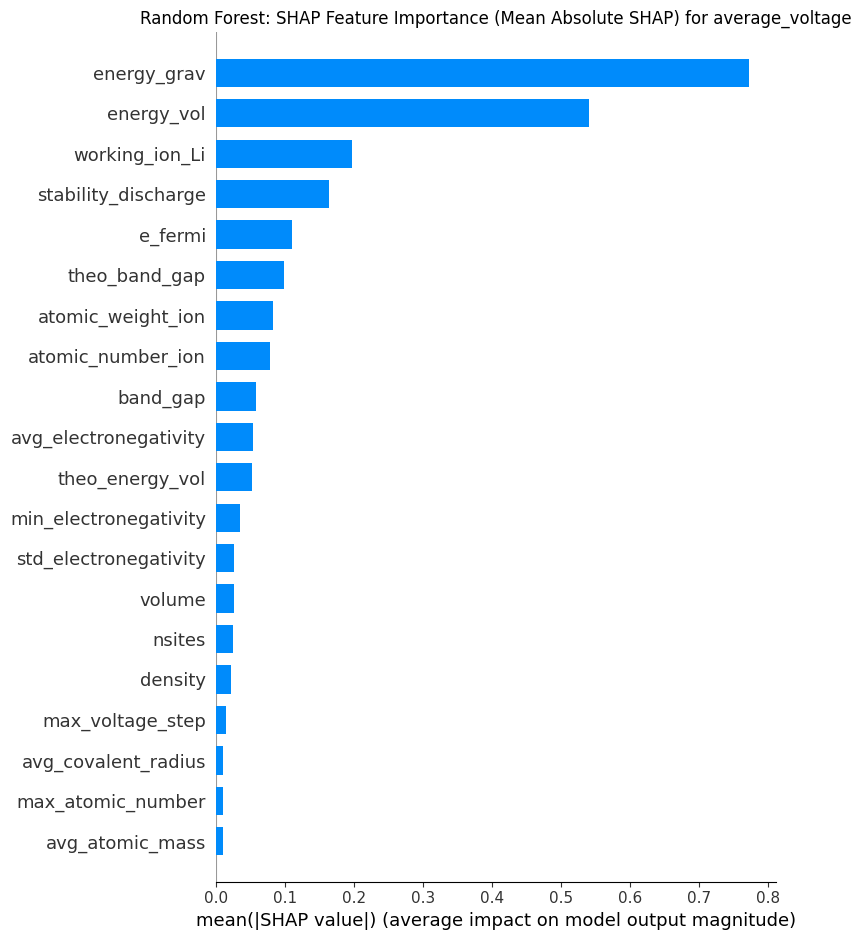

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (Random Forest) ---


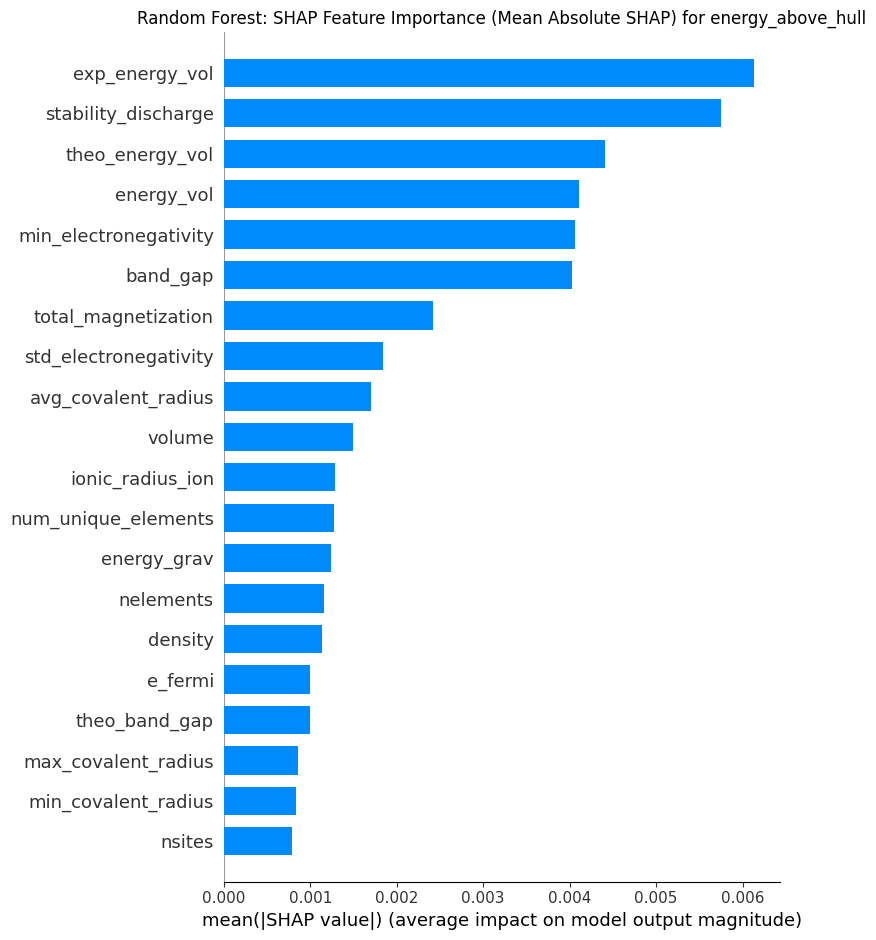


--- Generating SHAP Summary (Bar) Plots for LightGBM ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (LightGBM) ---


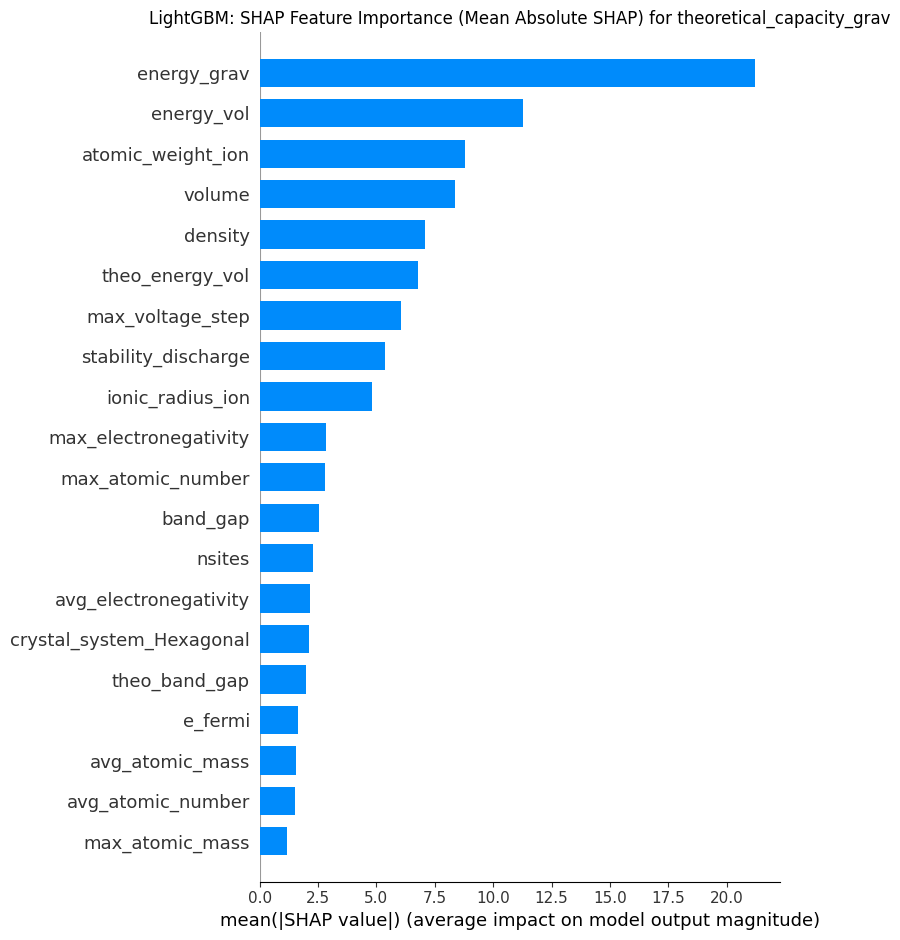

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (LightGBM) ---


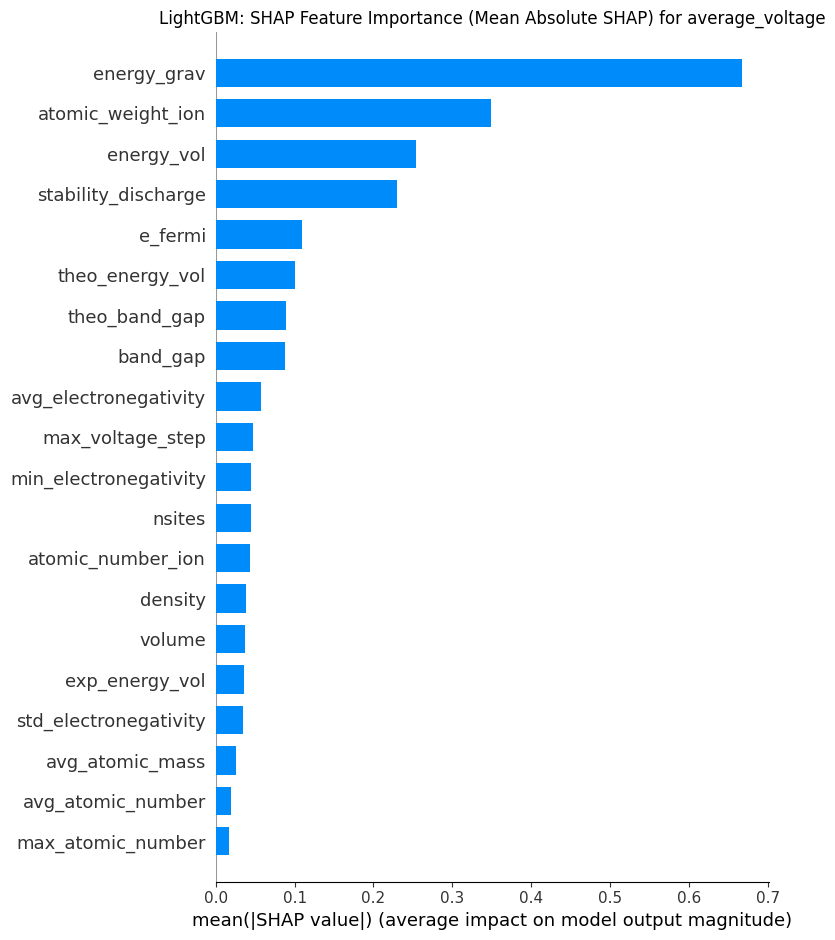

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (LightGBM) ---


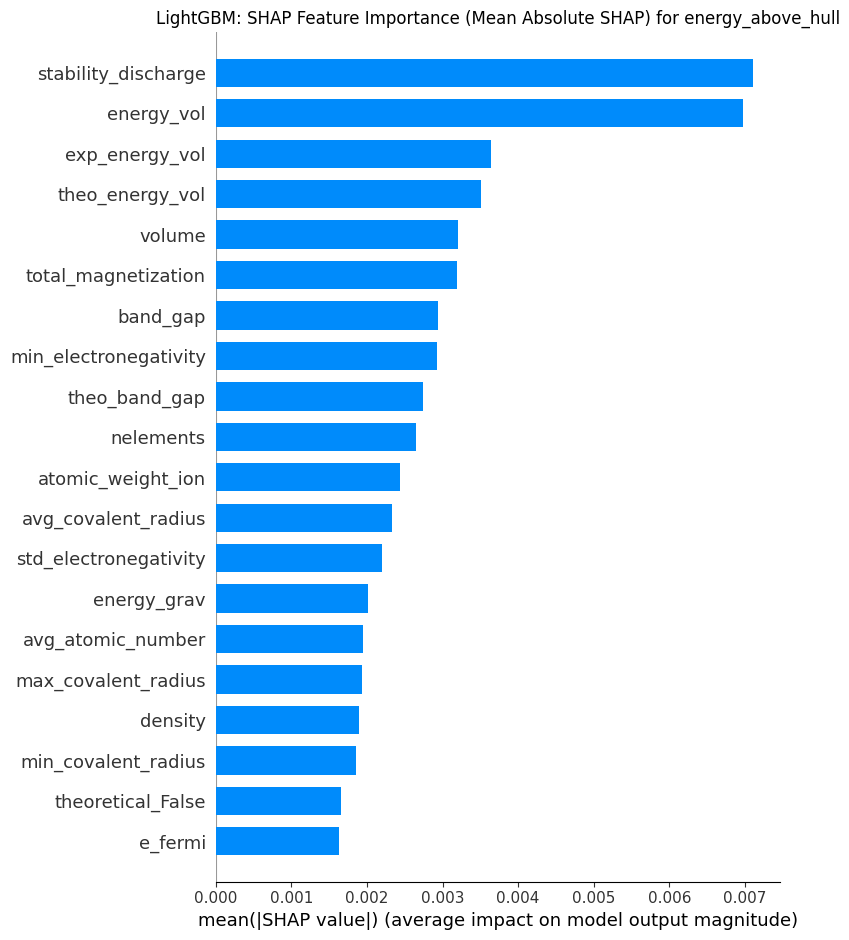


--- SHAP Summary (Bar) Plots Generated for All Models ---


In [ ]:
# Generate SHAP Summary (Bar) Plots for each KPI for all models

if 'shap_results' in locals() and 'target_kpis' in locals() and 'X_test_scaled' in locals():
    print("\n--- Generating SHAP Summary (Bar) Plots for All Models and KPIs ---")

    # Ensure X_test_scaled is a pandas DataFrame for consistent feature name handling in plots
    if not isinstance(X_test_scaled, pd.DataFrame):
        print("Warning: X_test_scaled is not a DataFrame. Converting to DataFrame for plotting.")

        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=loaded_feature_names if 'loaded_feature_names' in locals() else None)
    else:
        X_test_scaled_df = X_test_scaled

    # If feature names are still missing after conversion, try to get them
    if X_test_scaled_df.columns.empty and 'loaded_feature_names' in locals():
         X_test_scaled_df.columns = loaded_feature_names

    # Iterate through each model in the shap_results
    for model_name, kpi_shap_values in shap_results.items():
        print(f"\n--- Generating SHAP Summary (Bar) Plots for {model_name} ---")

        # Iterate through each KPI for the current model
        for kpi, shap_values in kpi_shap_values.items():
            if shap_values is not None: # Check if SHAP values were calculated successfully for this KPI/model
                 print(f"  Generating SHAP Summary (Bar) Plot for KPI: {kpi} ({model_name}) ---")

                 try:
                     # Use the X_test_scaled DataFrame to get feature names for the plot
                     shap.summary_plot(shap_values, X_test_scaled_df, plot_type="bar", show=False)
                     plt.title(f'{model_name}: SHAP Feature Importance (Mean Absolute SHAP) for {kpi}')
                     plt.tight_layout()
                     plt.show()
                 except Exception as e:
                     print(f"  Error generating SHAP summary (bar) plot for {kpi} ({model_name}): {e}")
            else:
                 print(f"  SHAP values for {kpi} ({model_name}) are not available. Skipping bar plot.")

else:
    print("Required variables (shap_results, target_kpis, X_test_scaled) not found. Please run previous cells.")

print("\n--- SHAP Summary (Bar) Plots Generated for All Models ---")

#### SHAP Dependence Plots


--- Generating SHAP Dependence Plots for All Models and KPIs ---

--- Generating SHAP Dependence Plots for XGBoost ---

--- Generating SHAP Dependence Plots for KPI: theoretical_capacity_grav (XGBoost) ---
Top 5 features for theoretical_capacity_grav (XGBoost): ['energy_grav', 'energy_vol', 'max_electronegativity', 'stability_discharge', 'volume']
  Generating dependence plot for feature: energy_grav


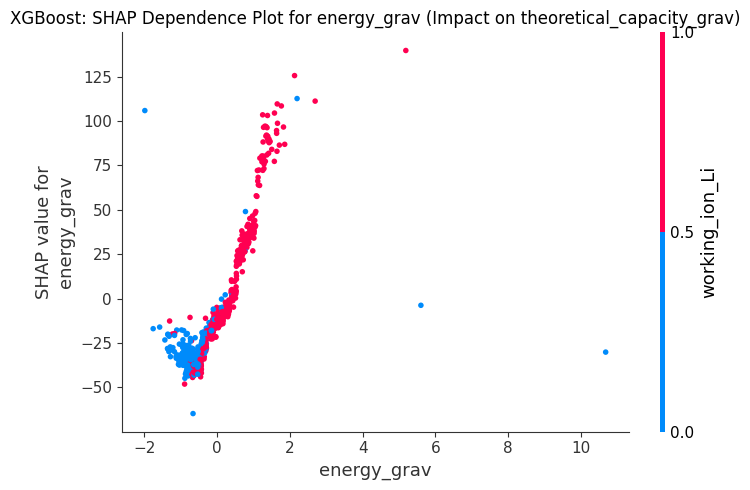

  Generating dependence plot for feature: energy_vol


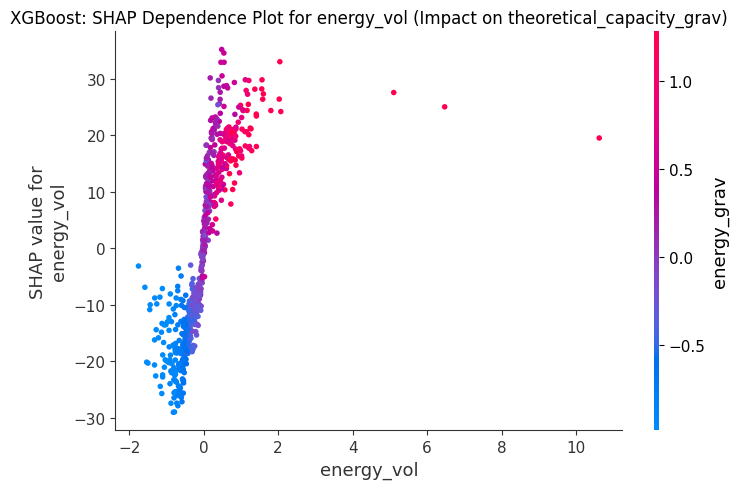

  Generating dependence plot for feature: max_electronegativity


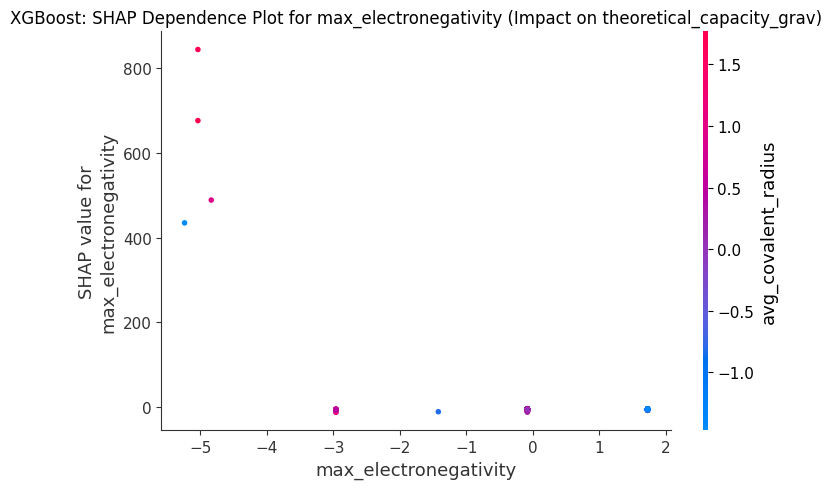

  Generating dependence plot for feature: stability_discharge


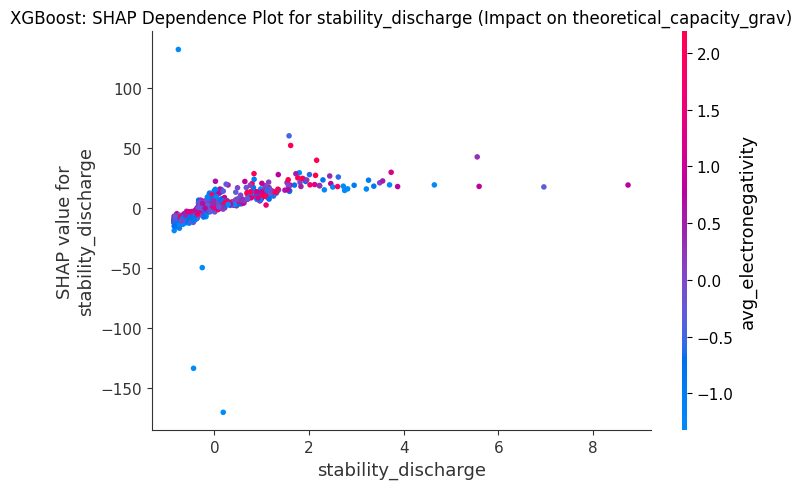

  Generating dependence plot for feature: volume


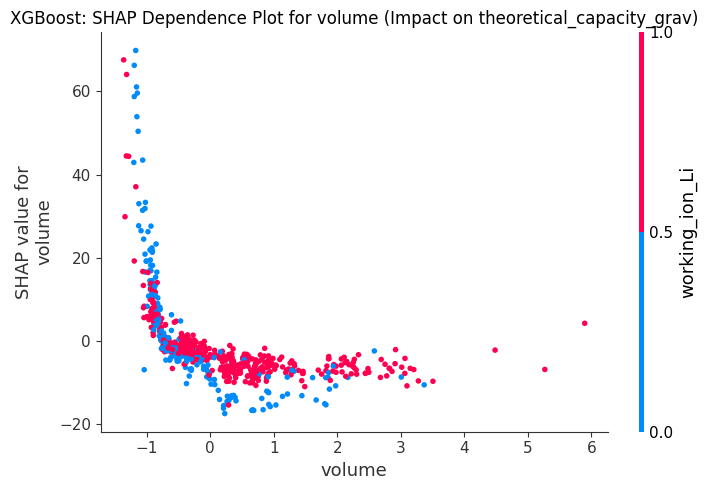


--- Generating SHAP Dependence Plots for KPI: average_voltage (XGBoost) ---
Top 5 features for average_voltage (XGBoost): ['energy_vol', 'energy_grav', 'atomic_weight_ion', 'stability_discharge', 'e_fermi']
  Generating dependence plot for feature: energy_vol


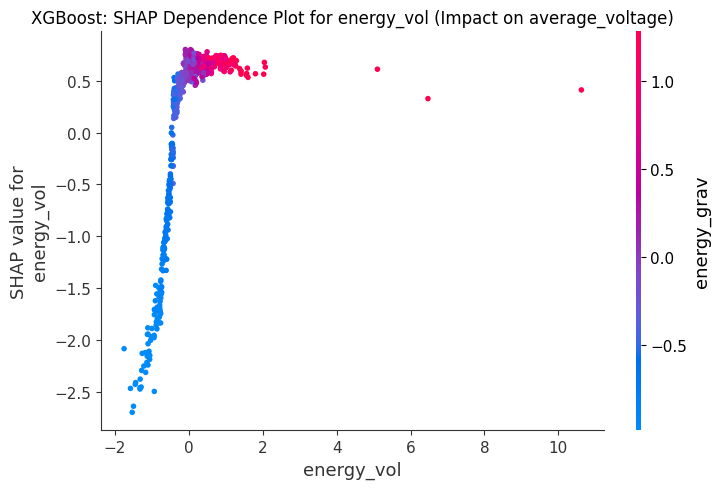

  Generating dependence plot for feature: energy_grav


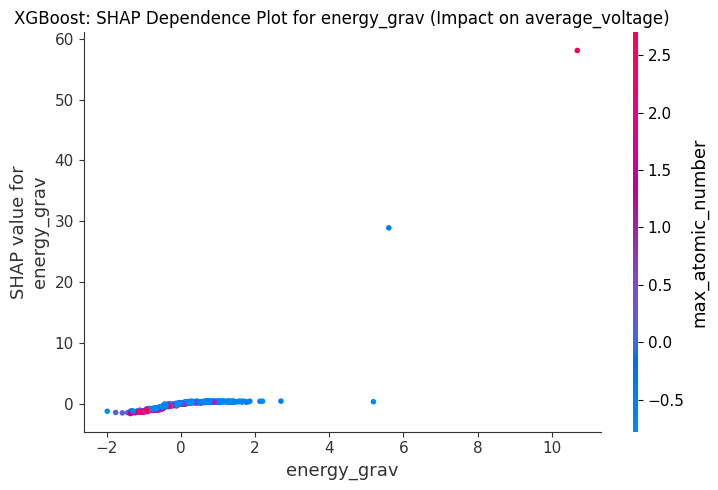

  Generating dependence plot for feature: atomic_weight_ion


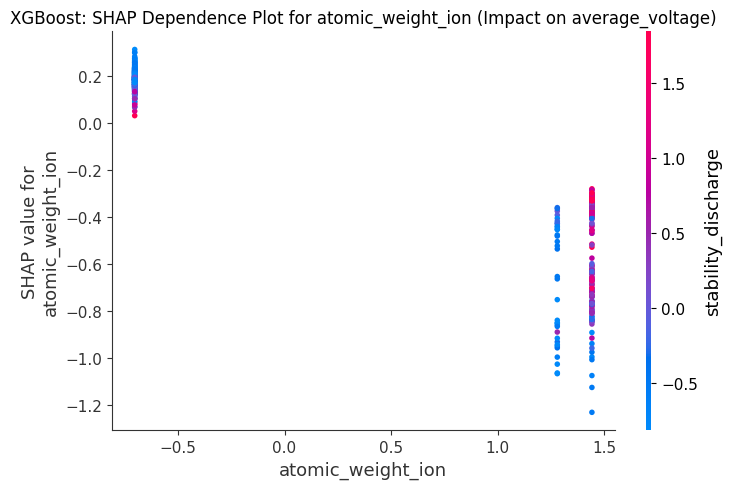

  Generating dependence plot for feature: stability_discharge


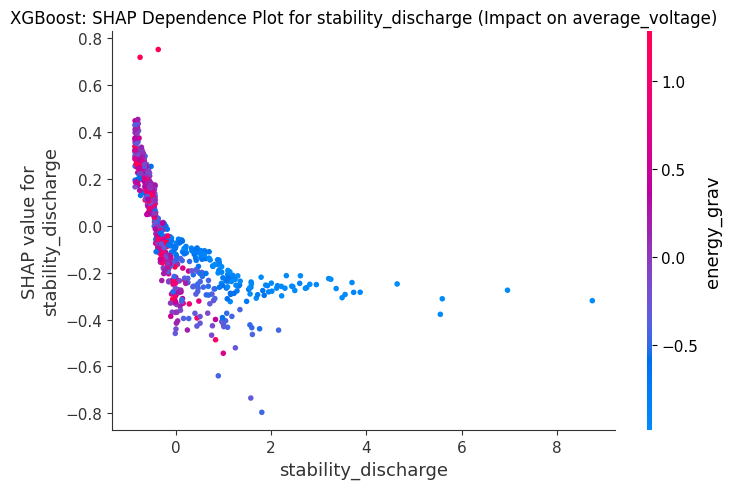

  Generating dependence plot for feature: e_fermi


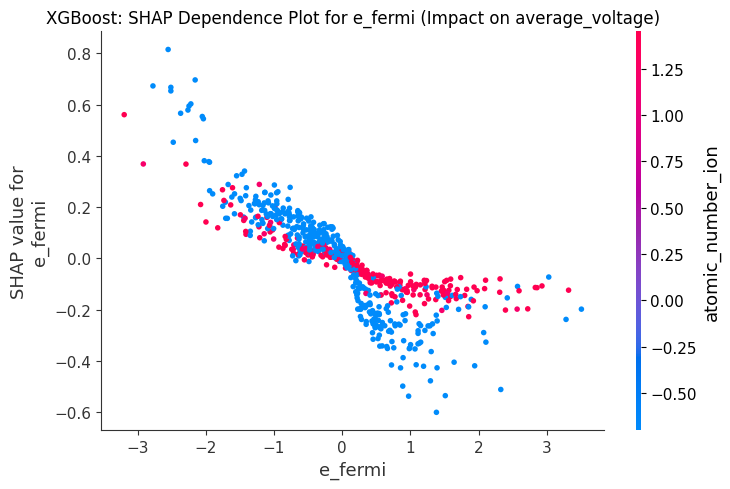


--- Generating SHAP Dependence Plots for KPI: energy_above_hull (XGBoost) ---
Top 5 features for energy_above_hull (XGBoost): ['stability_discharge', 'energy_vol', 'theo_energy_vol', 'band_gap', 'total_magnetization']
  Generating dependence plot for feature: stability_discharge


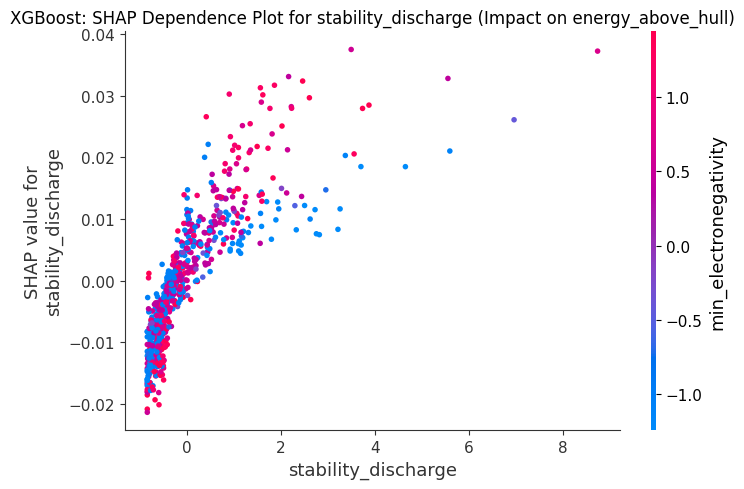

  Generating dependence plot for feature: energy_vol


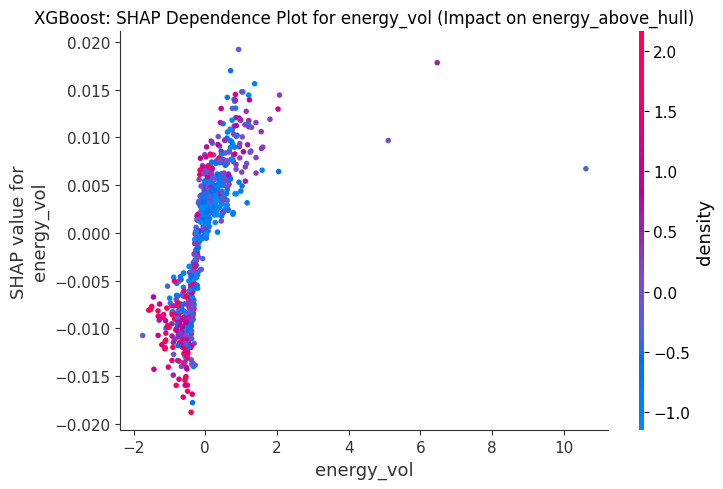

  Generating dependence plot for feature: theo_energy_vol


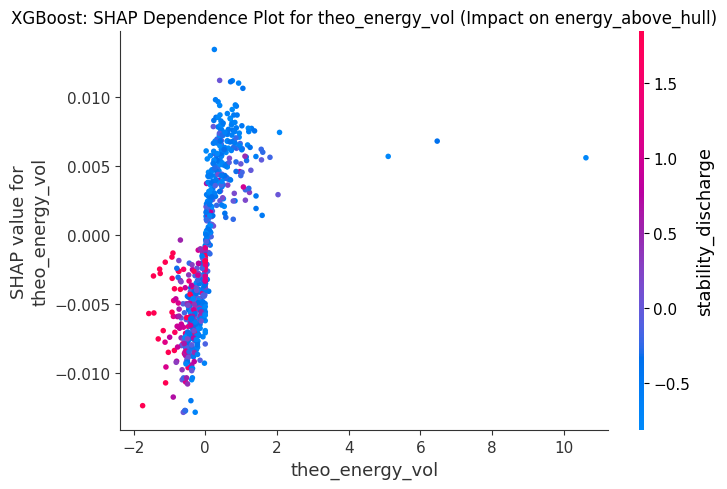

  Generating dependence plot for feature: band_gap


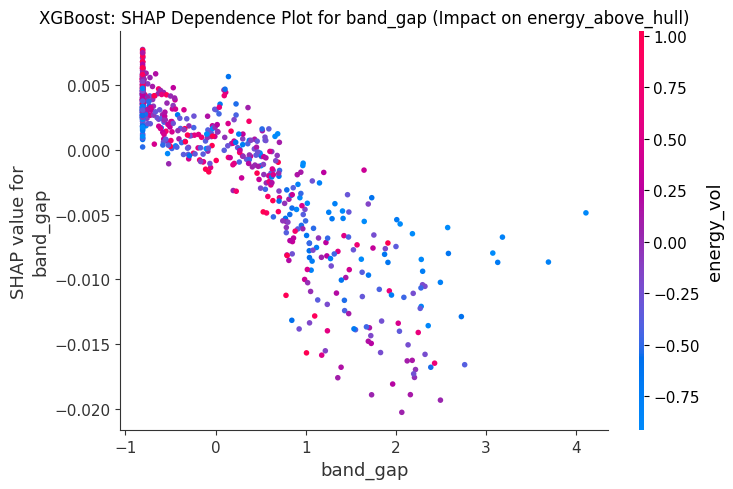

  Generating dependence plot for feature: total_magnetization


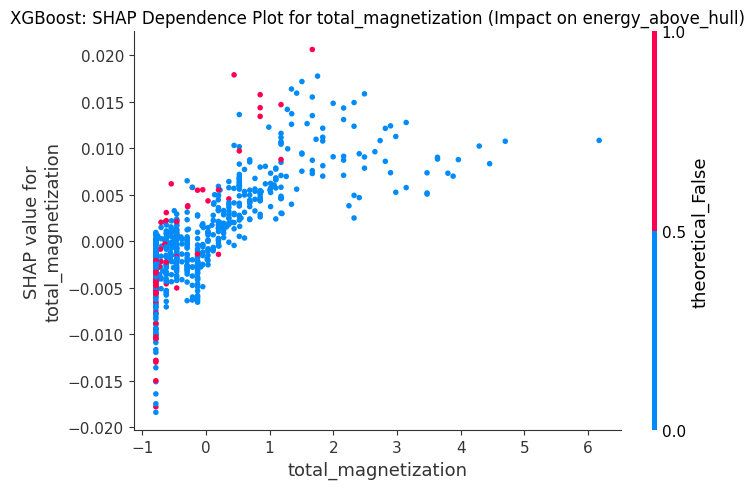


--- Generating SHAP Dependence Plots for Random Forest ---

--- Generating SHAP Dependence Plots for KPI: theoretical_capacity_grav (Random Forest) ---
Top 5 features for theoretical_capacity_grav (Random Forest): ['energy_grav', 'energy_vol', 'max_electronegativity', 'volume', 'stability_discharge']
  Generating dependence plot for feature: energy_grav


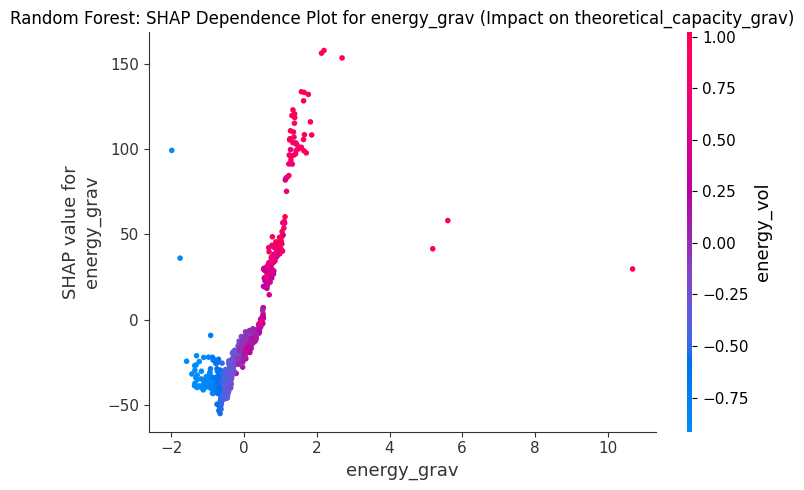

  Generating dependence plot for feature: energy_vol


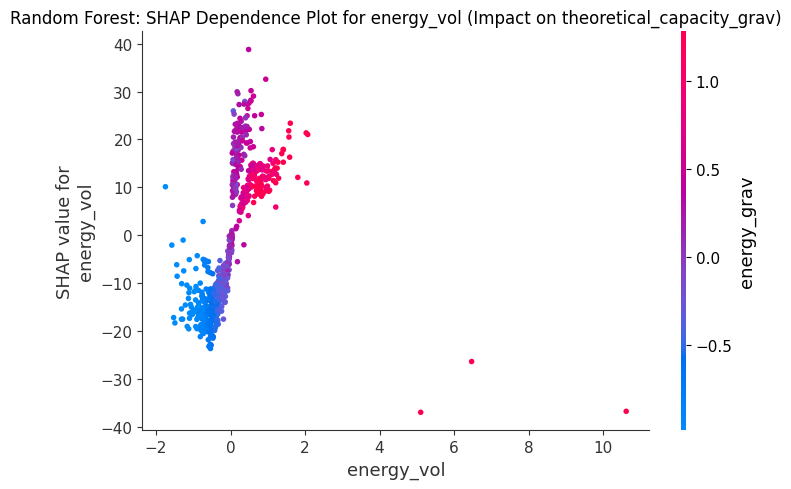

  Generating dependence plot for feature: max_electronegativity


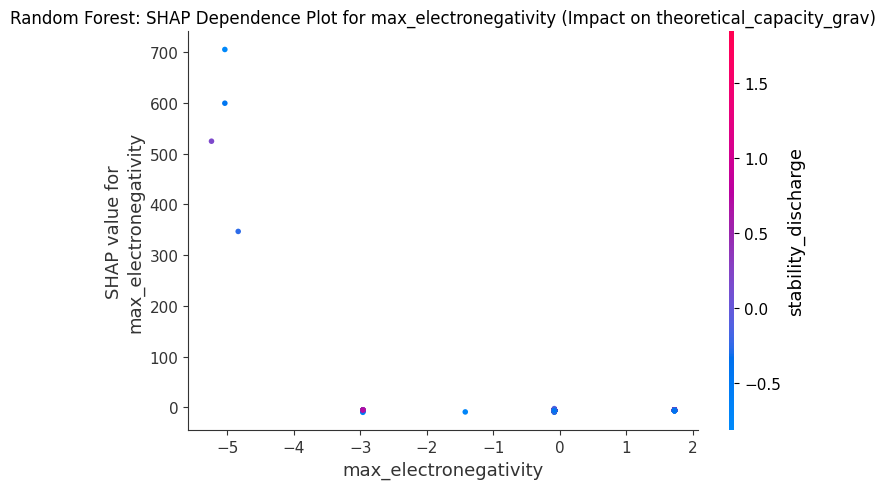

  Generating dependence plot for feature: volume


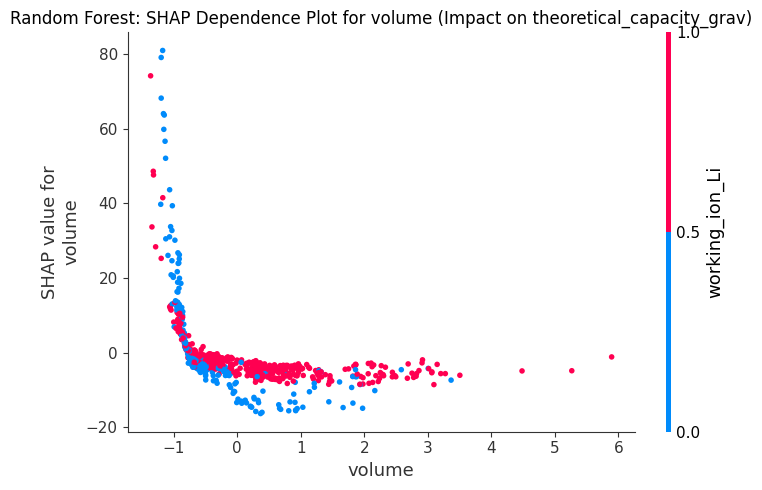

  Generating dependence plot for feature: stability_discharge


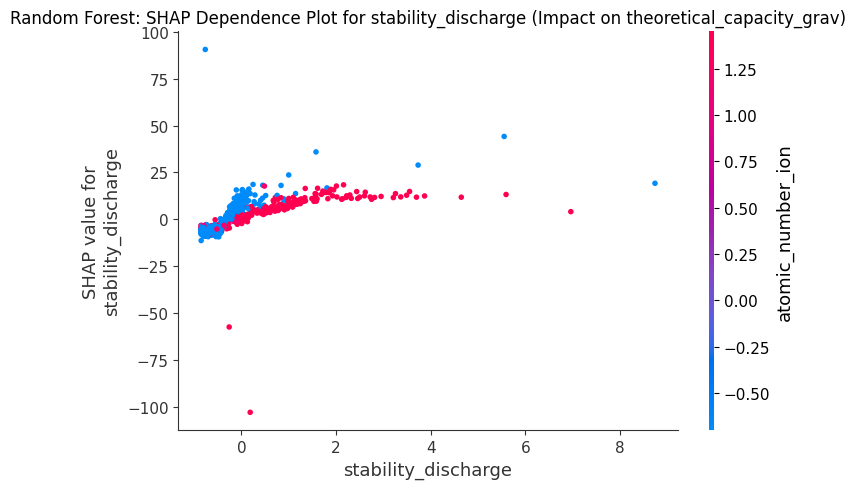


--- Generating SHAP Dependence Plots for KPI: average_voltage (Random Forest) ---
Top 5 features for average_voltage (Random Forest): ['energy_grav', 'energy_vol', 'working_ion_Li', 'stability_discharge', 'e_fermi']
  Generating dependence plot for feature: energy_grav


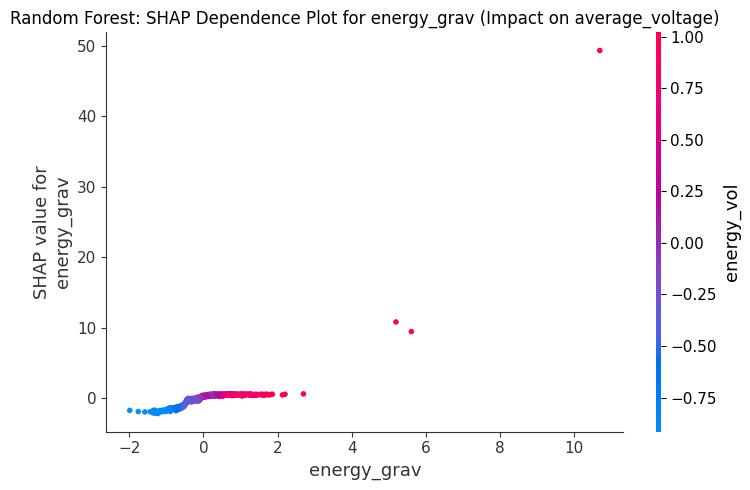

  Generating dependence plot for feature: energy_vol


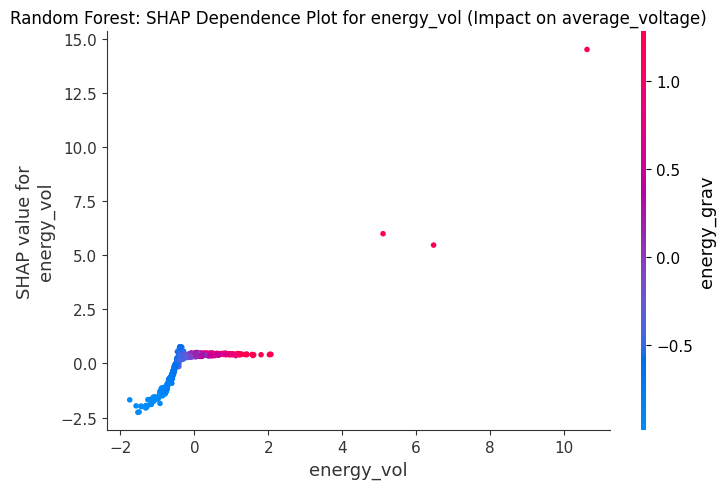

  Generating dependence plot for feature: working_ion_Li


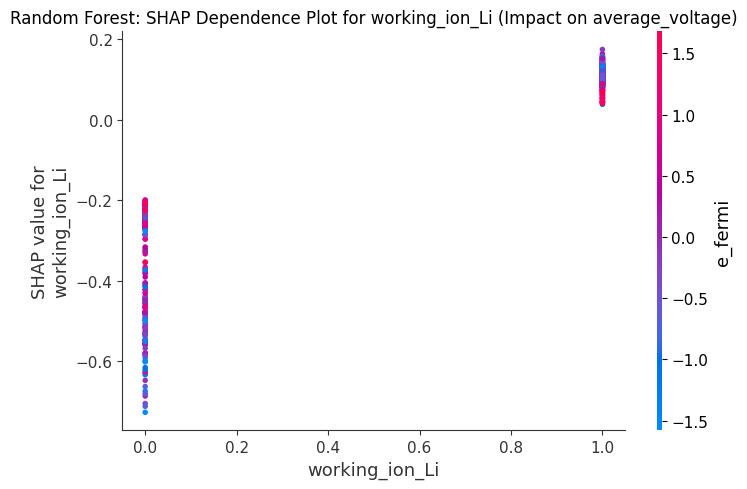

  Generating dependence plot for feature: stability_discharge


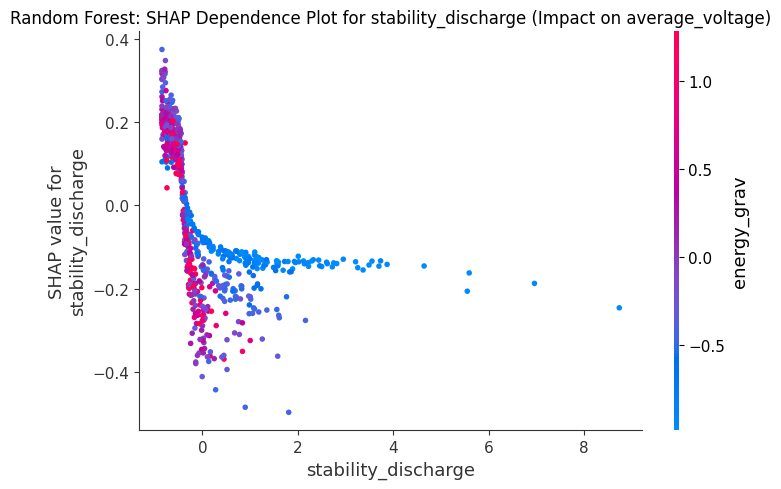

  Generating dependence plot for feature: e_fermi


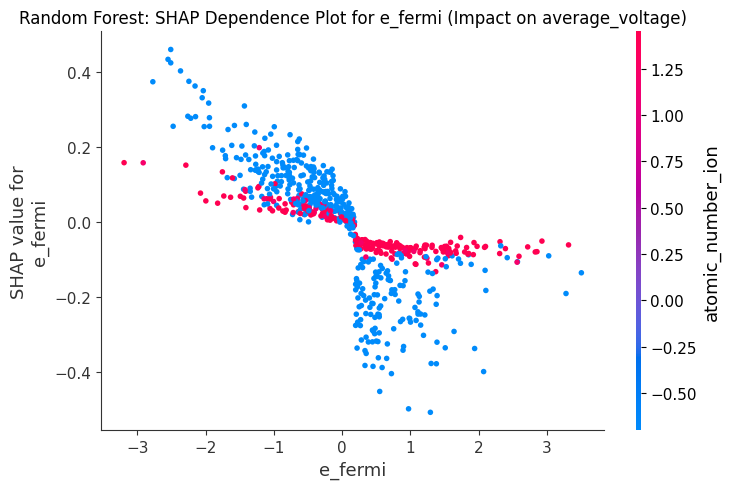


--- Generating SHAP Dependence Plots for KPI: energy_above_hull (Random Forest) ---
Top 5 features for energy_above_hull (Random Forest): ['exp_energy_vol', 'stability_discharge', 'theo_energy_vol', 'energy_vol', 'min_electronegativity']
  Generating dependence plot for feature: exp_energy_vol


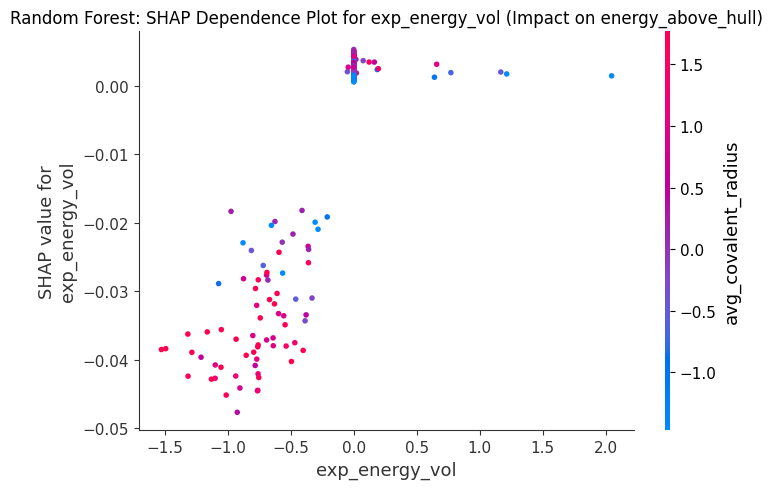

  Generating dependence plot for feature: stability_discharge


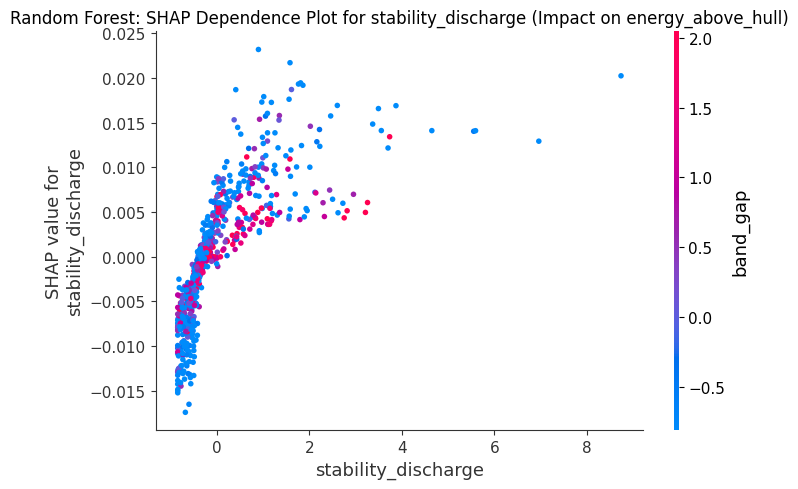

  Generating dependence plot for feature: theo_energy_vol


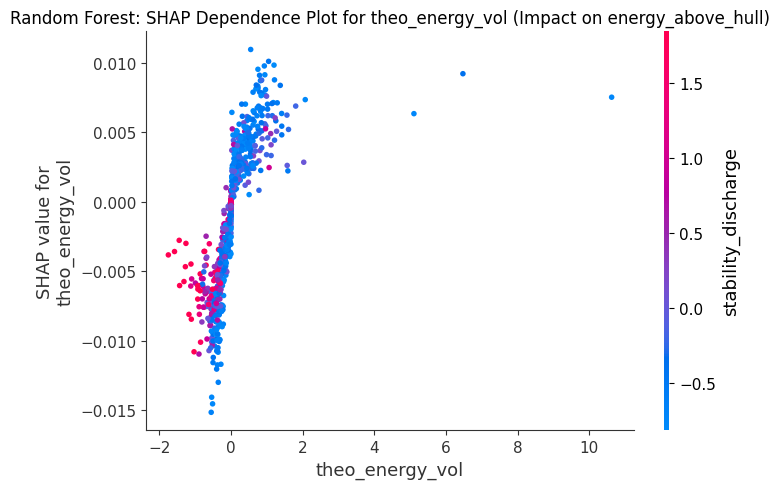

  Generating dependence plot for feature: energy_vol


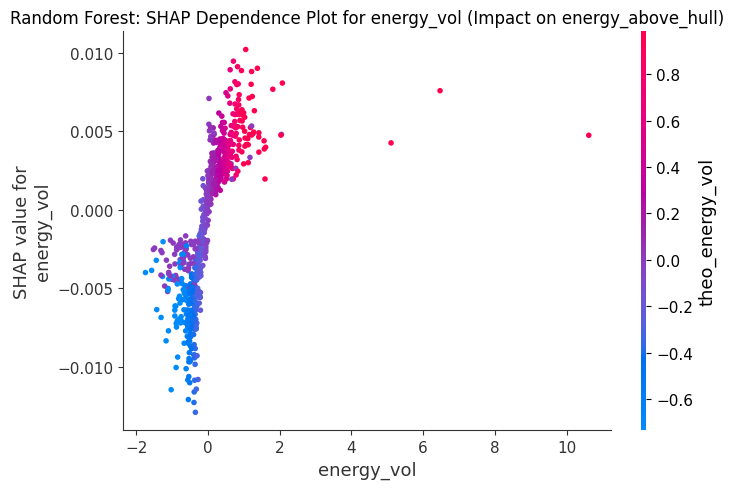

  Generating dependence plot for feature: min_electronegativity


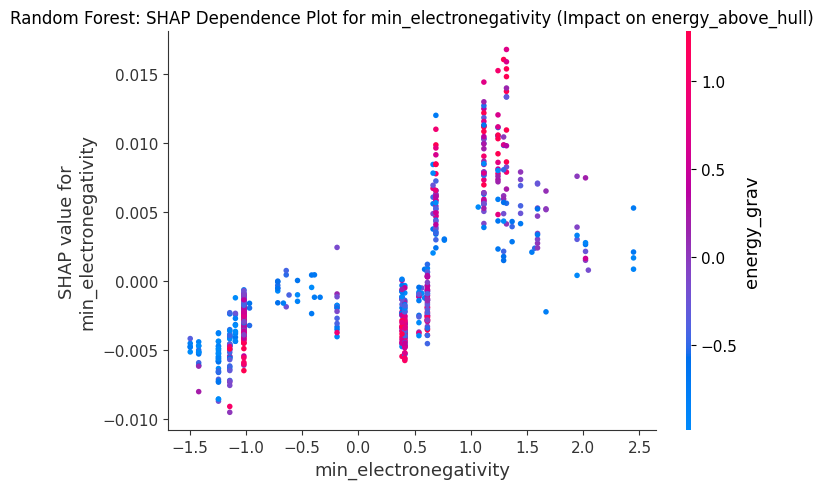


--- Generating SHAP Dependence Plots for LightGBM ---

--- Generating SHAP Dependence Plots for KPI: theoretical_capacity_grav (LightGBM) ---
Top 5 features for theoretical_capacity_grav (LightGBM): ['energy_grav', 'energy_vol', 'atomic_weight_ion', 'volume', 'density']
  Generating dependence plot for feature: energy_grav


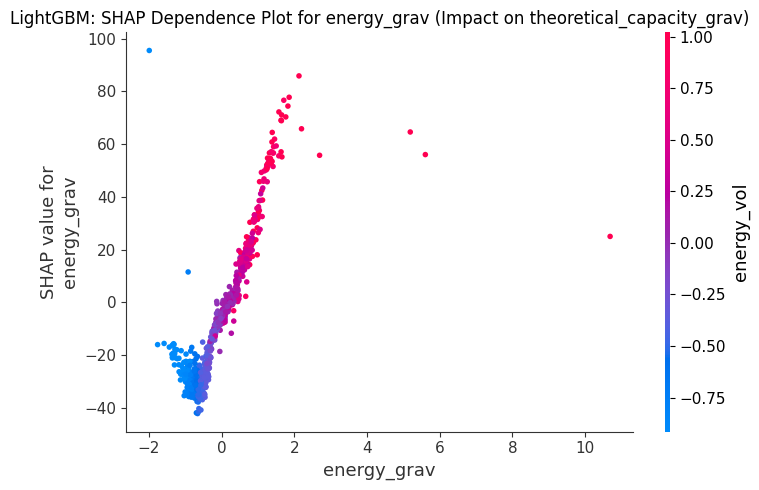

  Generating dependence plot for feature: energy_vol


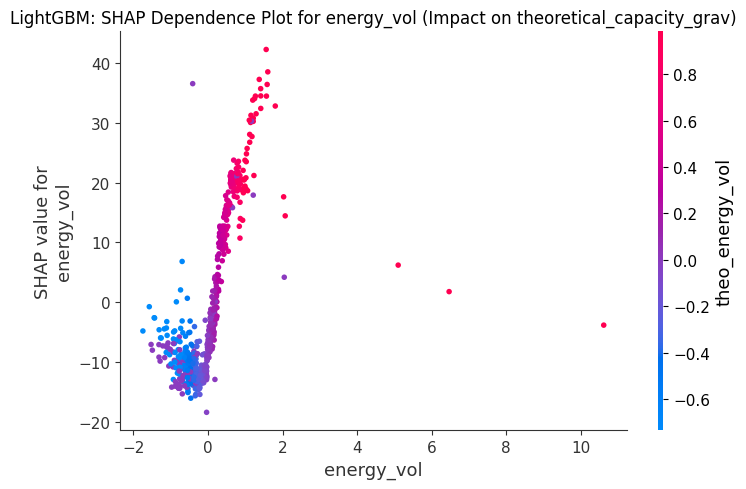

  Generating dependence plot for feature: atomic_weight_ion


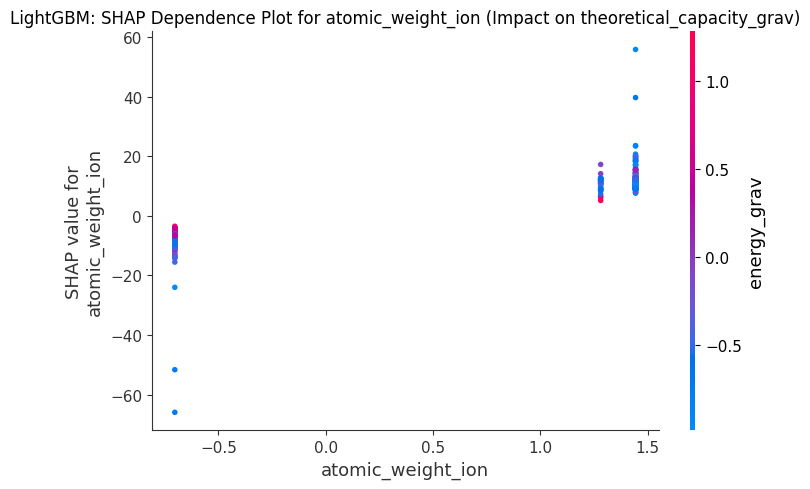

  Generating dependence plot for feature: volume


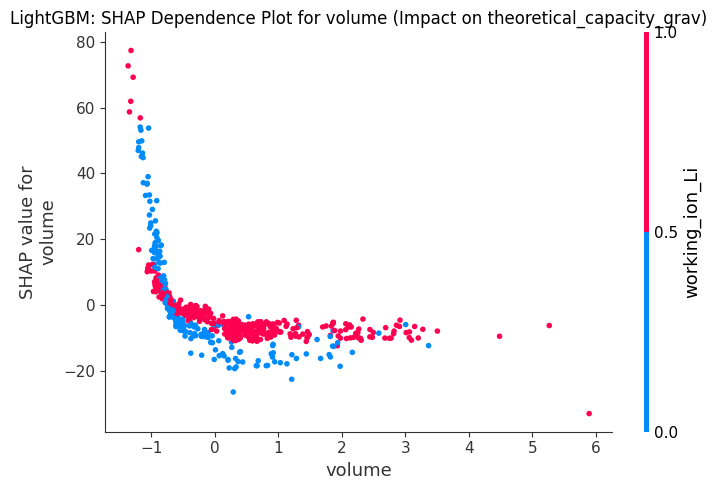

  Generating dependence plot for feature: density


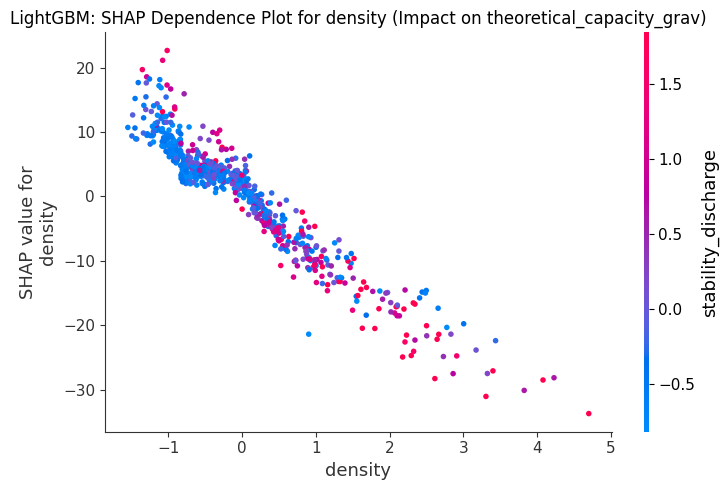


--- Generating SHAP Dependence Plots for KPI: average_voltage (LightGBM) ---
Top 5 features for average_voltage (LightGBM): ['energy_grav', 'atomic_weight_ion', 'energy_vol', 'stability_discharge', 'e_fermi']
  Generating dependence plot for feature: energy_grav


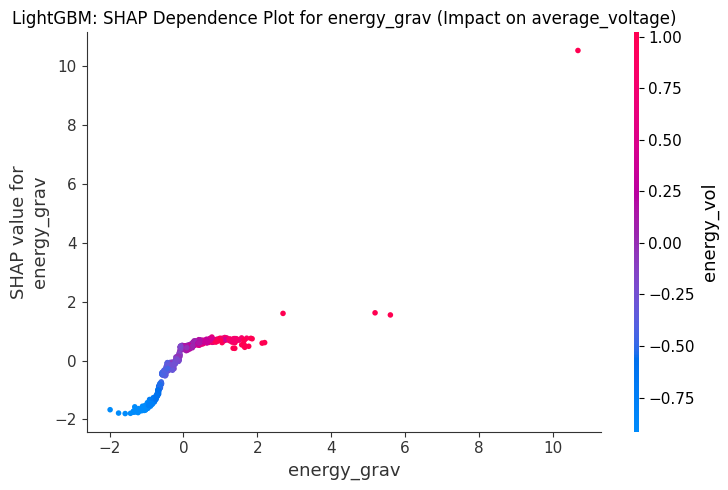

  Generating dependence plot for feature: atomic_weight_ion


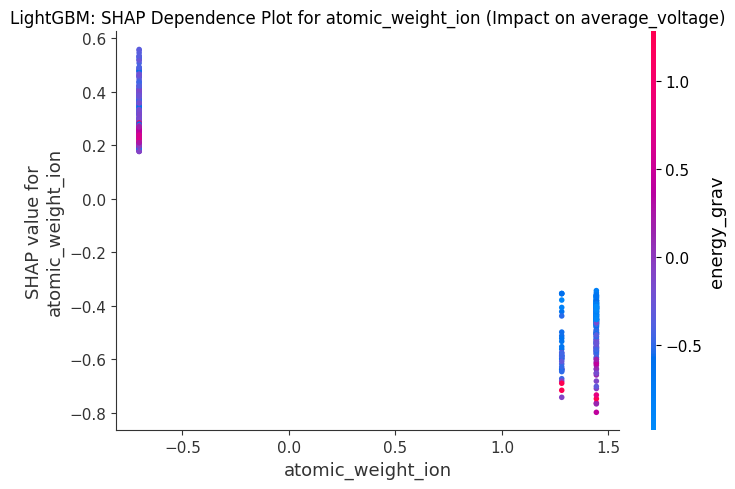

  Generating dependence plot for feature: energy_vol


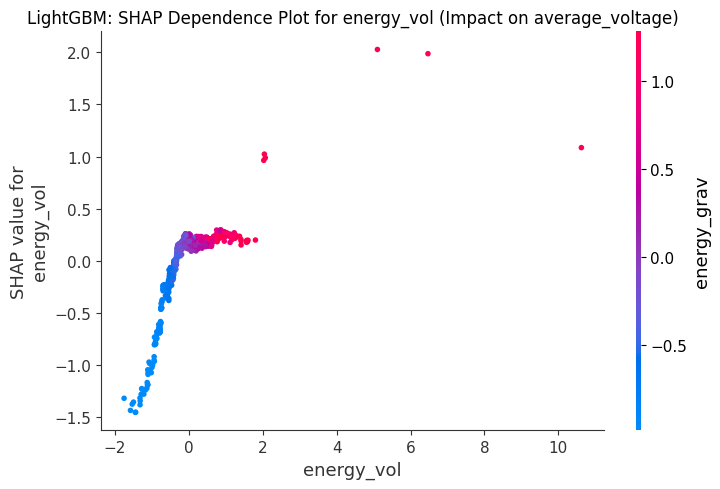

  Generating dependence plot for feature: stability_discharge


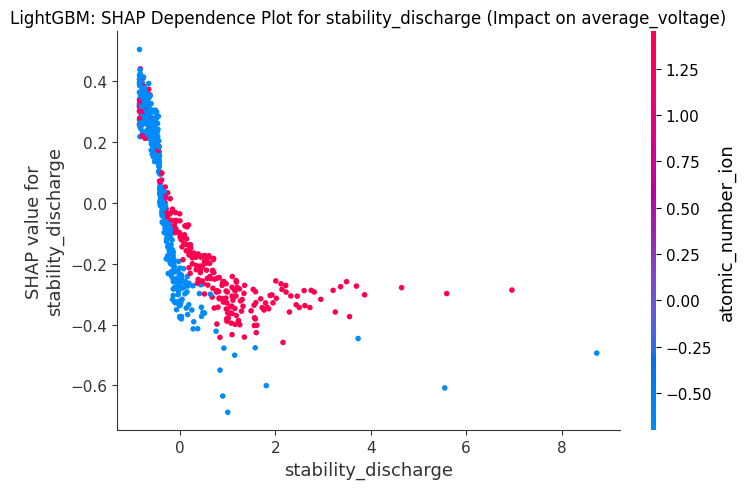

  Generating dependence plot for feature: e_fermi


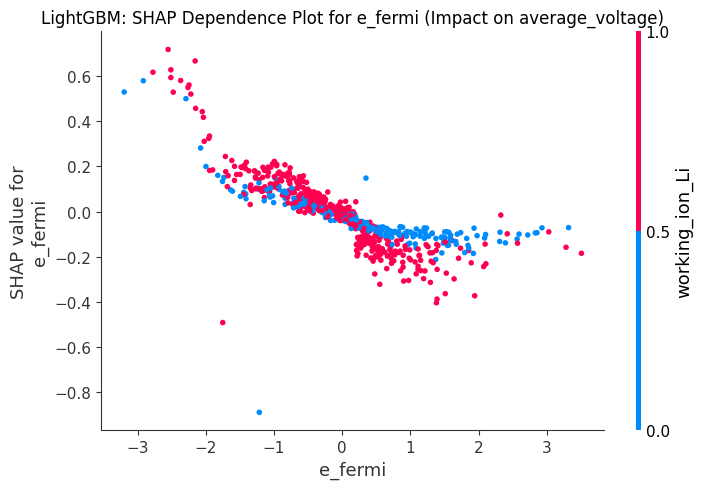


--- Generating SHAP Dependence Plots for KPI: energy_above_hull (LightGBM) ---
Top 5 features for energy_above_hull (LightGBM): ['stability_discharge', 'energy_vol', 'exp_energy_vol', 'theo_energy_vol', 'volume']
  Generating dependence plot for feature: stability_discharge


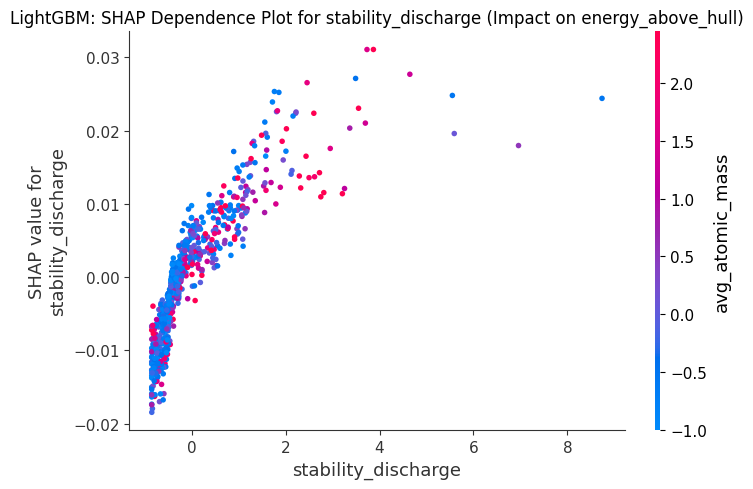

  Generating dependence plot for feature: energy_vol


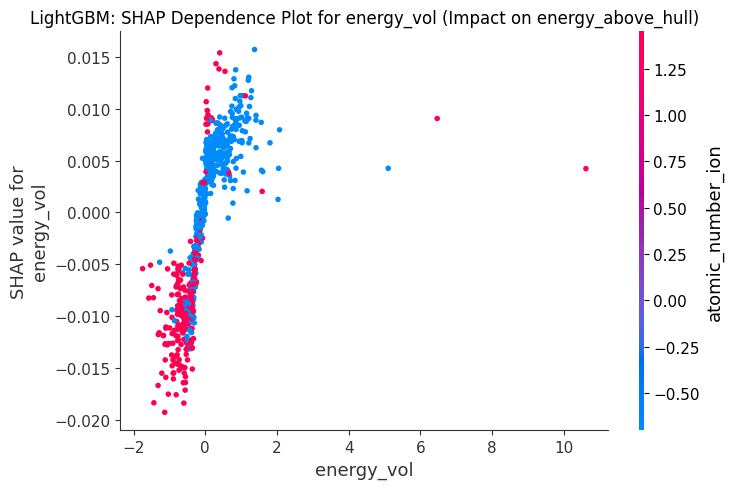

  Generating dependence plot for feature: exp_energy_vol


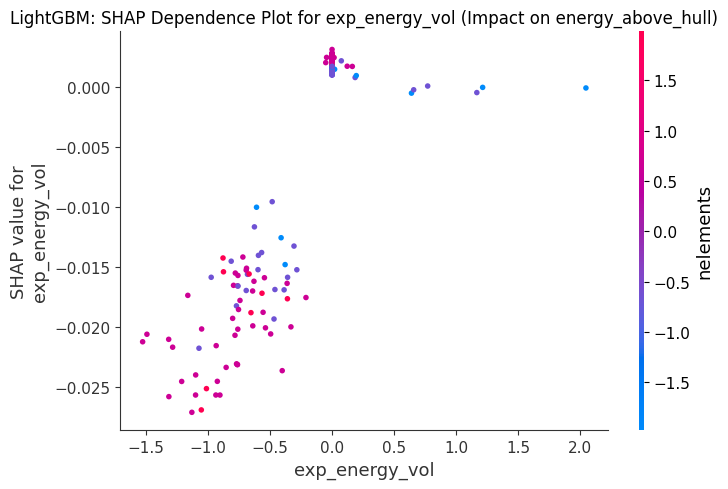

  Generating dependence plot for feature: theo_energy_vol


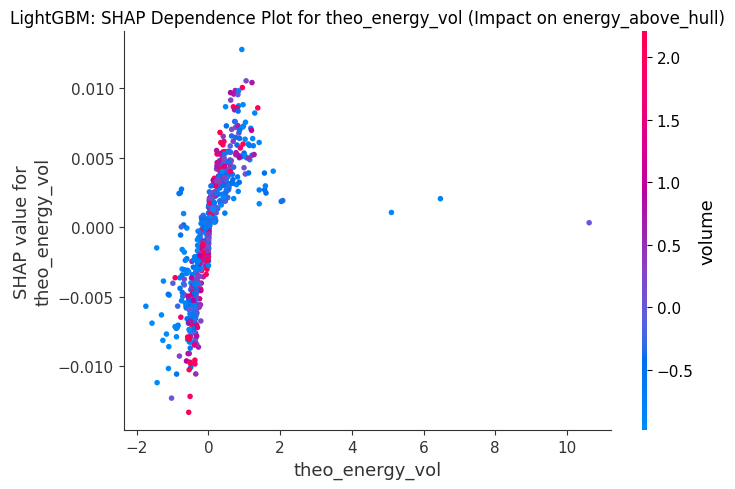

  Generating dependence plot for feature: volume


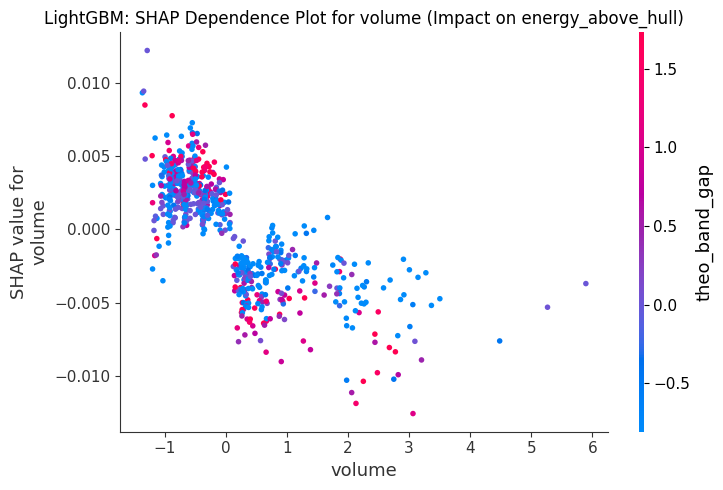

In [ ]:
# Generate SHAP Dependence Plots for the top features of each KPI for all models

if 'shap_results' in locals() and 'target_kpis' in locals() and 'X_test_scaled' in locals():
    top_n_features = 5 # Define how many top features to plot dependence for

    # Ensure X_test_scaled is a pandas DataFrame for consistent feature name handling in plots
    if not isinstance(X_test_scaled, pd.DataFrame):
        print("Warning: X_test_scaled is not a DataFrame. Converting to DataFrame for plotting.")

        X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=loaded_feature_names if 'loaded_feature_names' in locals() else None)
    else:
        X_test_scaled_df = X_test_scaled

    # If feature names are still missing after conversion, try to get them
    if X_test_scaled_df.columns.empty and 'loaded_feature_names' in locals():
         X_test_scaled_df.columns = loaded_feature_names


    print("\n--- Generating SHAP Dependence Plots for All Models and KPIs ---")

    # Iterate through each model in the shap_results
    for model_name, kpi_shap_values in shap_results.items():
        print(f"\n--- Generating SHAP Dependence Plots for {model_name} ---")

        # Iterate through each KPI for the current model
        for kpi, shap_values in kpi_shap_values.items():
            if shap_values is not None: # Check if SHAP values were calculated successfully for this KPI/model
                print(f"\n--- Generating SHAP Dependence Plots for KPI: {kpi} ({model_name}) ---")

                # Calculate mean absolute SHAP values to find top features
                mean_abs_shap_values = np.abs(shap_values).mean(axis=0)
                # Ensure feature names align with mean_abs_shap_values
                if len(mean_abs_shap_values) == X_test_scaled_df.shape[1]:
                    feature_importances = pd.Series(mean_abs_shap_values, index=X_test_scaled_df.columns)
                    top_features = feature_importances.sort_values(ascending=False).head(top_n_features).index.tolist()

                    print(f"Top {top_n_features} features for {kpi} ({model_name}): {top_features}")

                    # Generate dependence plot for each top feature
                    for feature in top_features:
                        print(f"  Generating dependence plot for feature: {feature}")
                        # Ensure the feature exists in the DataFrame used for plotting
                        if feature in X_test_scaled_df.columns:
                            try:
                                # Use the X_test_scaled DataFrame for plotting
                                shap.dependence_plot(feature, shap_values, X_test_scaled_df, interaction_index="auto", show=False)
                                plt.title(f'{model_name}: SHAP Dependence Plot for {feature} (Impact on {kpi})')
                                plt.tight_layout()
                                plt.show()
                            except Exception as e:
                                print(f"    Could not generate dependence plot for {feature} ({model_name}): {e}")
                        else:
                            print(f"    Feature '{feature}' not found in X_test_scaled_df. Skipping dependence plot for {model_name}, {kpi}.")
                else:
                    print(f"  Number of SHAP values ({len(mean_abs_shap_values)}) does not match number of features in X_test_scaled_df ({X_test_scaled_df.shape[1]}). Cannot determine top features for {kpi} ({model_name}).")

            else:
                print(f"SHAP values for {kpi} ({model_name}) are not available. Skipping dependence plots.")

else:
    print("Required variables (shap_results, target_kpis, X_test_scaled) not found. Please run previous cells.")


### Uncertainty Quantification (Assessing Prediction Confidence)

#### Residual Analysis


--- Starting Residual Analysis for All Models ---

--- Analyzing Residuals for XGBoost ---
  Predictions obtained for XGBoost. Shape: (689, 3)
  Residuals calculated for XGBoost.
  Shape of residuals: (689, 3)

  --- Generating Residuals vs. Predicted Plots for XGBoost ---


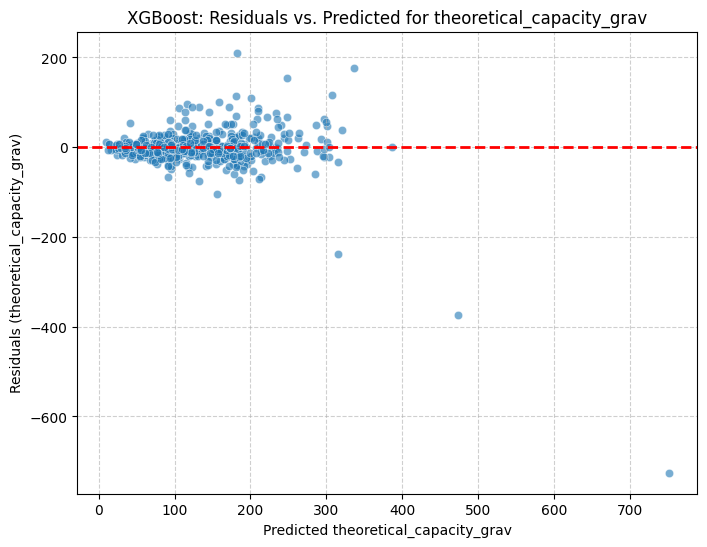

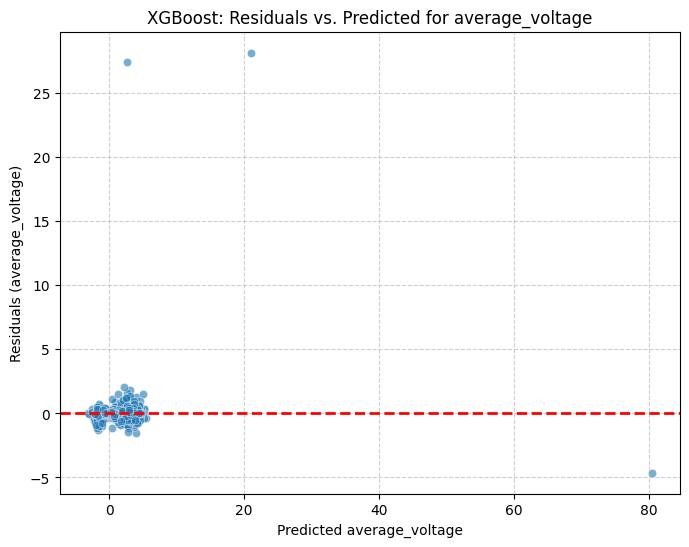

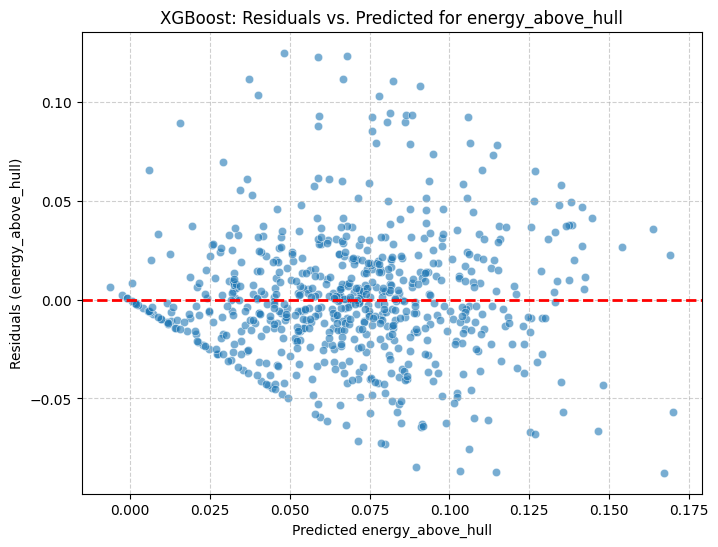


  --- Generating Residuals Histograms for XGBoost ---


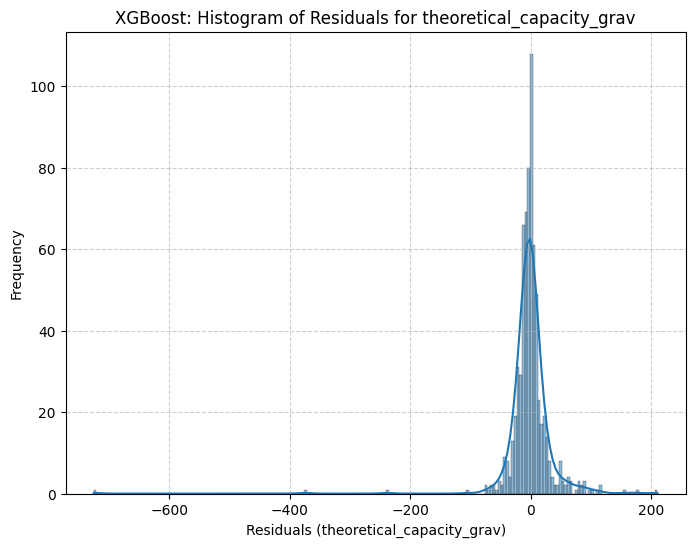

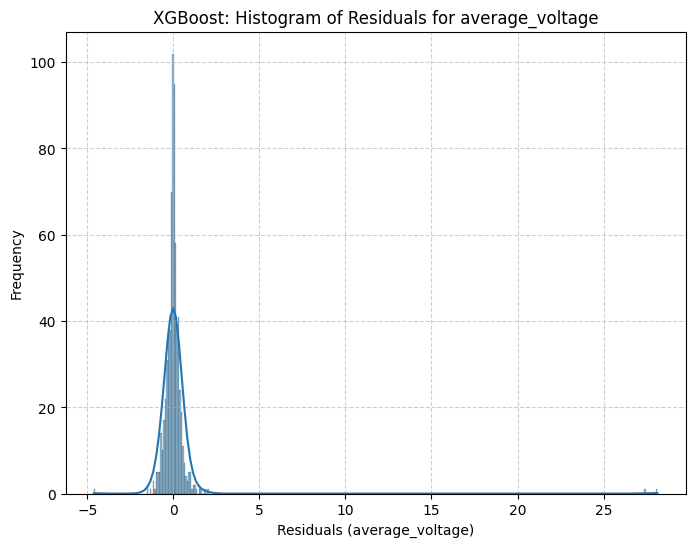

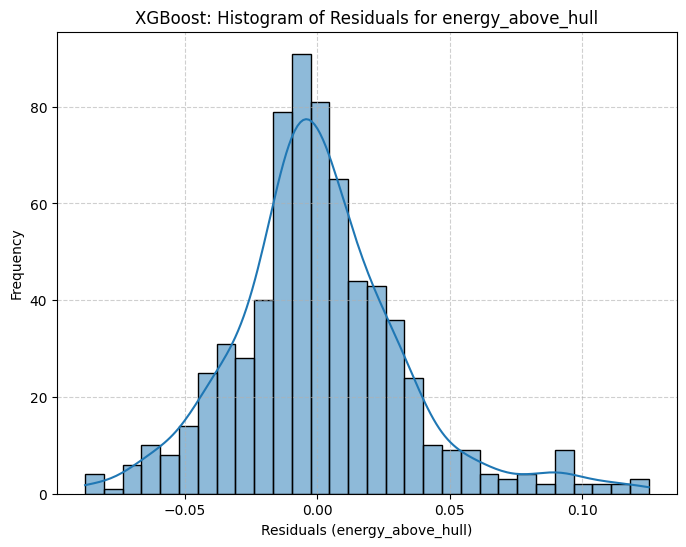


--- Analyzing Residuals for Random Forest ---
  Predictions obtained for Random Forest. Shape: (689, 3)
  Residuals calculated for Random Forest.
  Shape of residuals: (689, 3)

  --- Generating Residuals vs. Predicted Plots for Random Forest ---


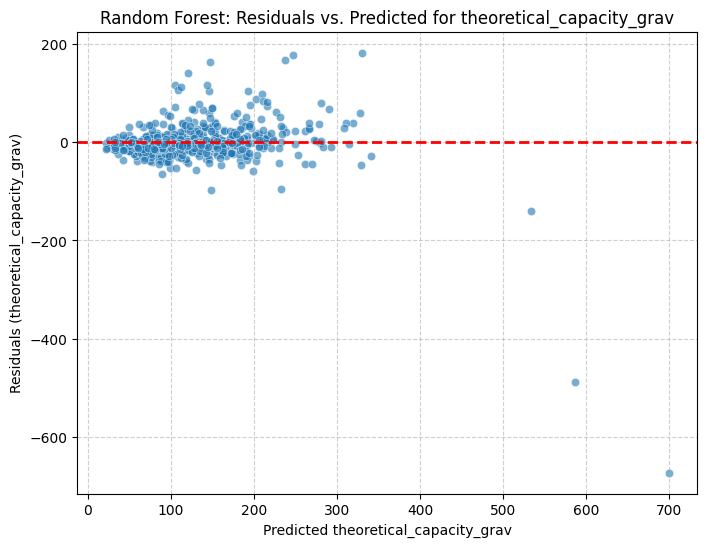

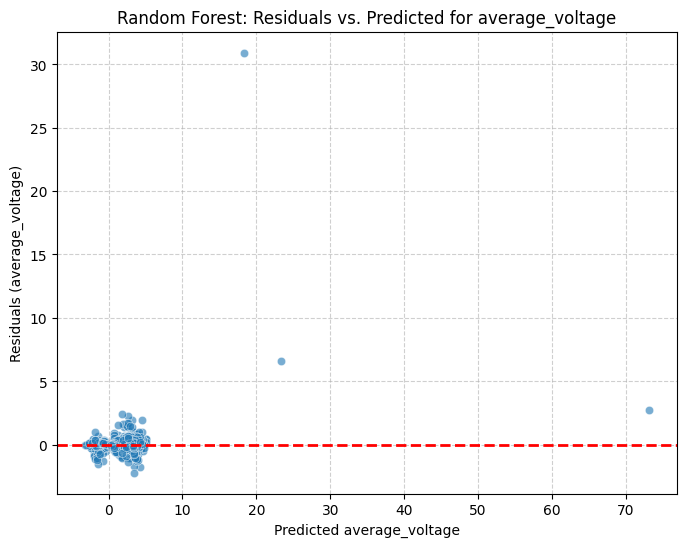

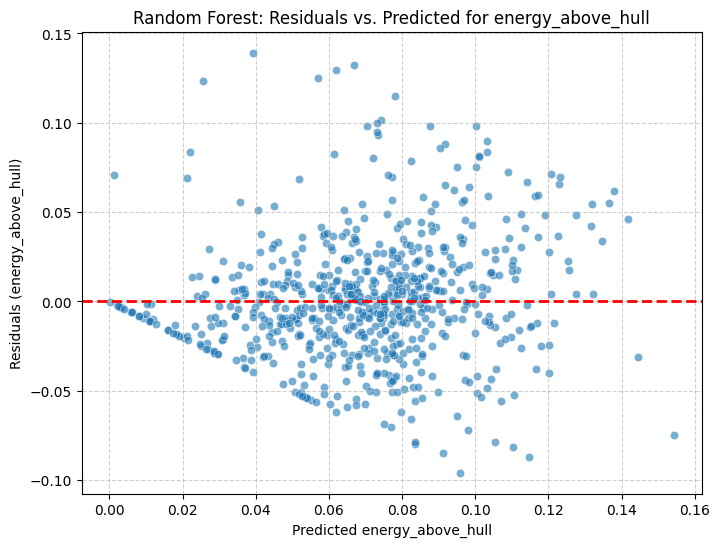


  --- Generating Residuals Histograms for Random Forest ---


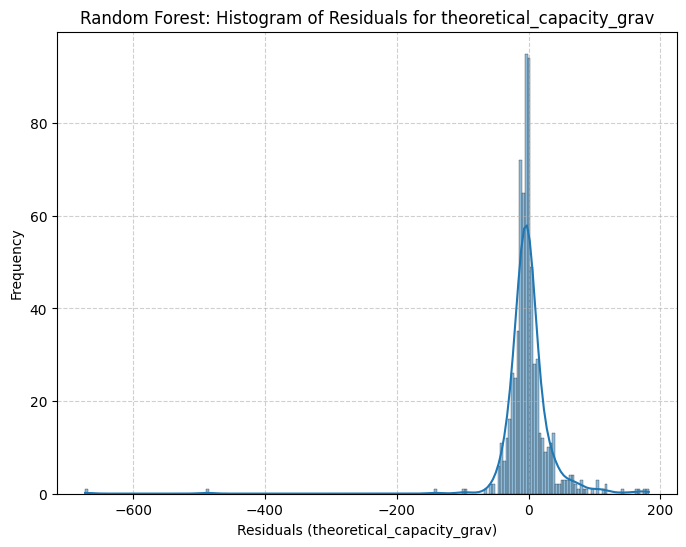

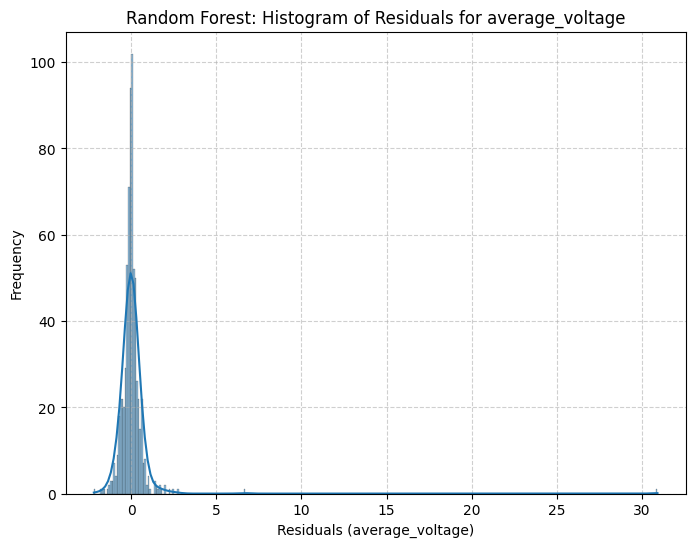

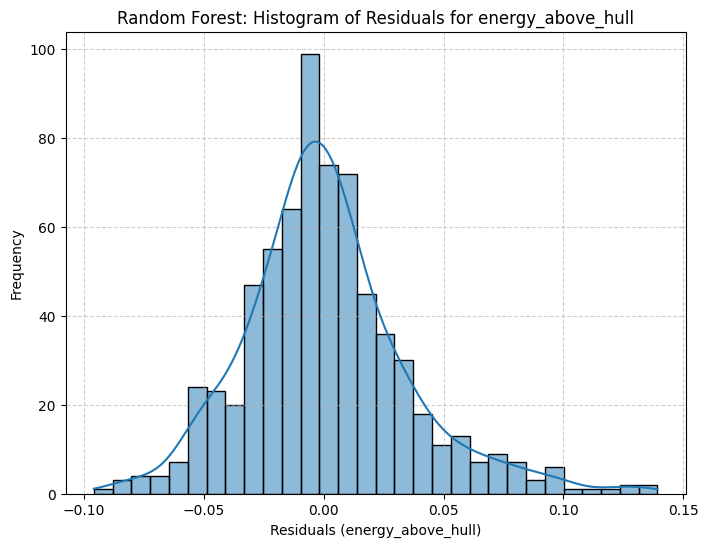


--- Analyzing Residuals for LightGBM ---
  Predictions obtained for LightGBM. Shape: (689, 3)
  Residuals calculated for LightGBM.
  Shape of residuals: (689, 3)

  --- Generating Residuals vs. Predicted Plots for LightGBM ---


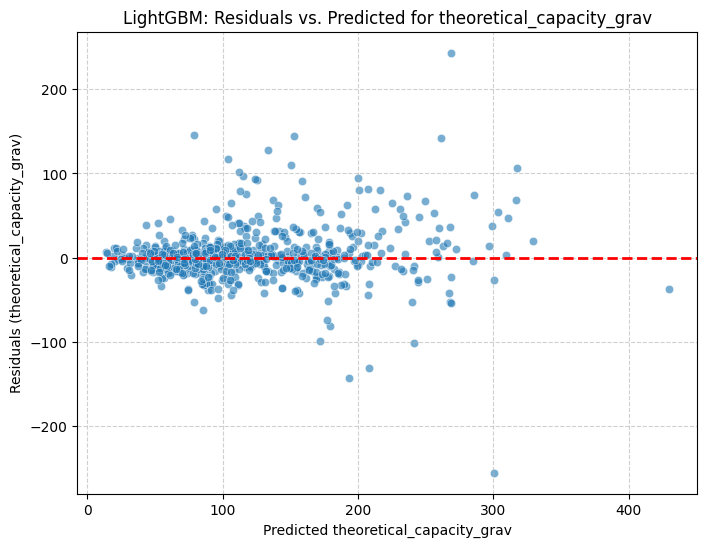

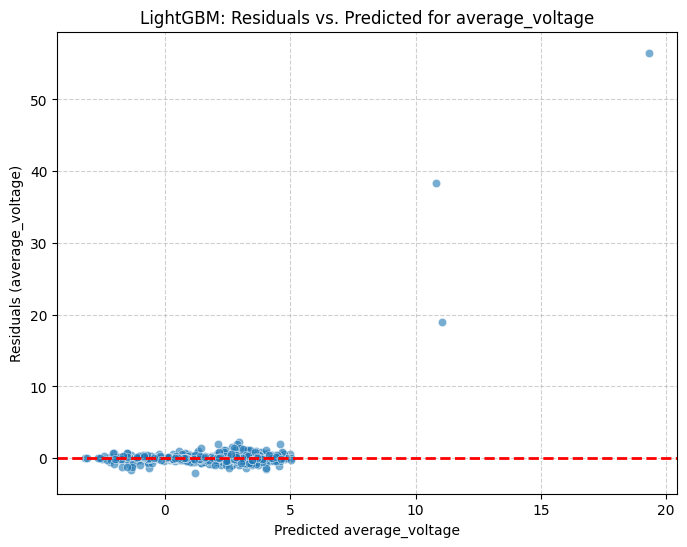

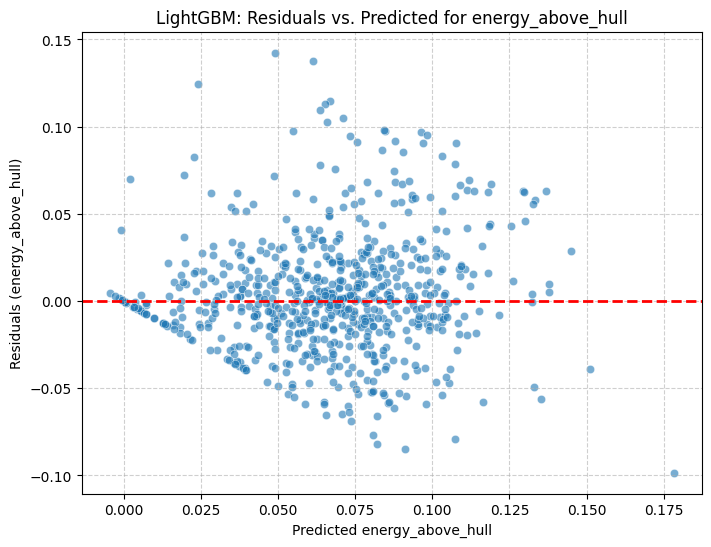


  --- Generating Residuals Histograms for LightGBM ---


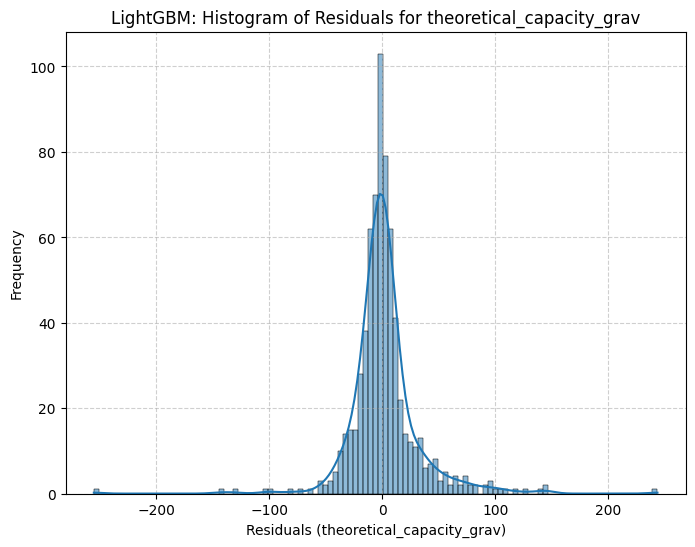

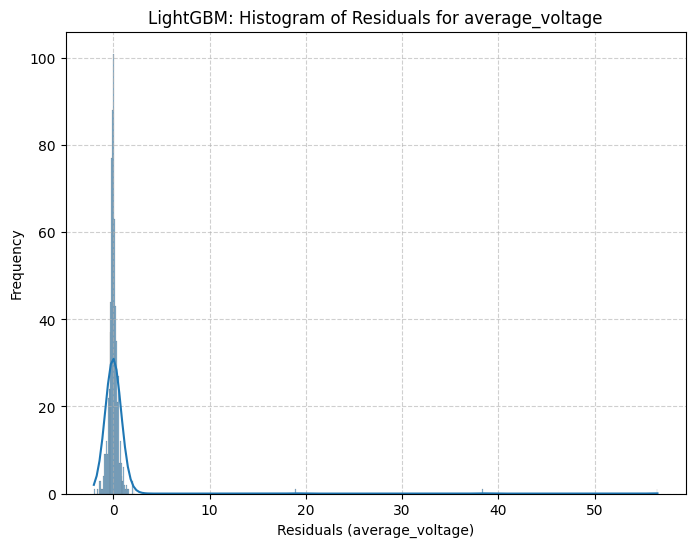

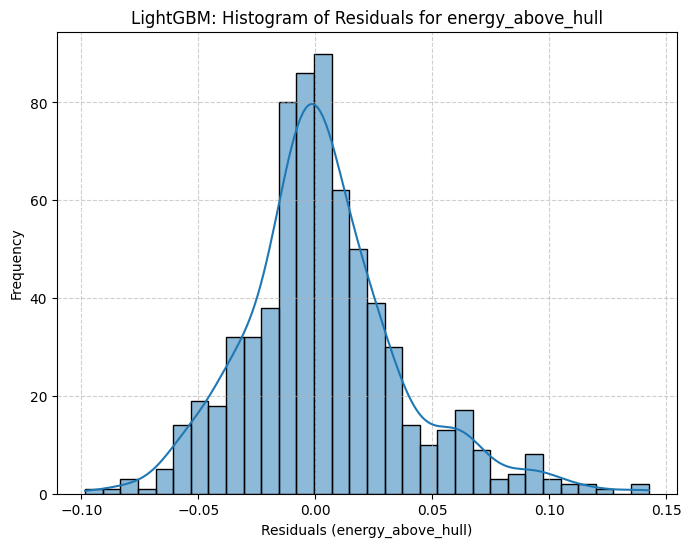

In [ ]:
print("\n--- Starting Residual Analysis for All Models ---")

# Ensure y_test_values and target_kpis are available
if 'y_test_values' not in locals() or 'target_kpis' not in locals():
    print("Error: y_test_values or target_kpis not found. Please run the evaluation cell first.")
    sys.exit("Exiting due to missing actual values.")

# Define the models for residual analysis
models_to_analyze = {
    "XGBoost": loaded_xgboost_model,
    "Random Forest": loaded_random_forest_model,
    "LightGBM": loaded_lightgbm_model
}

for model_name, model in models_to_analyze.items():
    print(f"\n--- Analyzing Residuals for {model_name} ---")

    try:
        # Make predictions using the current model (this will update the global y_pred)
        # We re-predict here to ensure y_pred is correct for this model's residual calculation
        y_pred = model.predict(X_test_scaled)
        print(f"  Predictions obtained for {model_name}. Shape: {y_pred.shape}")


        # Calculate residuals (Actual - Predicted) for each target KPI
        residuals = y_test_values - y_pred
        print(f"  Residuals calculated for {model_name}.")
        print(f"  Shape of residuals: {residuals.shape}")

        # Create DataFrames for easier plotting and analysis
        residuals_df = pd.DataFrame(residuals, columns=target_kpis, index=y_test.index)
        y_pred_df = pd.DataFrame(y_pred, columns=target_kpis, index=y_test.index)

        # Scatter plots of Residuals vs. Predicted values
        print(f"\n  --- Generating Residuals vs. Predicted Plots for {model_name} ---")
        for kpi in target_kpis:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=y_pred_df[kpi], y=residuals_df[kpi], alpha=0.6)
            plt.axhline(0, color='red', linestyle='--', lw=2) # Add a horizontal line at y=0
            plt.title(f'{model_name}: Residuals vs. Predicted for {kpi}')
            plt.xlabel(f'Predicted {kpi}')
            plt.ylabel(f'Residuals ({kpi})')
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.show()

        # Histograms of Residuals
        print(f"\n  --- Generating Residuals Histograms for {model_name} ---")
        for kpi in target_kpis:
            plt.figure(figsize=(8, 6))
            sns.histplot(residuals_df[kpi], kde=True)
            plt.title(f'{model_name}: Histogram of Residuals for {kpi}')
            plt.xlabel(f'Residuals ({kpi})')
            plt.ylabel('Frequency')
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.show()

    except Exception as e:
        print(f"\nError analyzing residuals for {model_name}: {e}")


1. Overall Performance (based on Evaluation Metrics):

The LightGBM model appears to perform best for predicting theoretical_capacity_grav, showing the lowest MAE and RMSE and the highest R-squared (around 0.81). Its MAPE is also the lowest for this KPI (around 18%).
The Random Forest model performs best for predicting average_voltage, with the lowest MAE and RMSE and the highest R-squared (around 0.89). Its MAPE is also the lowest for this KPI (around 20%).
All three models show similar performance for energy_above_hull, with relatively low R-squared values (around 0.45-0.50) and higher MAPE values (ranging from 75% to 90%). This suggests that predicting energy_above_hull is more challenging for these models compared to the other two KPIs.

2. Visualizations (Actual vs. Predicted, Error Plots, Residual Analysis):

Actual vs. Predicted Plots: These plots visually confirm the metric results. The points in the plots for theoretical_capacity_grav (LightGBM) and average_voltage (Random Forest) are generally closer to the identity line (Actual = Predicted), indicating better predictive accuracy for these KPIs by their respective best-performing models. There are noticeable outliers for all models and KPIs, suggesting some materials are particularly difficult to predict.
Absolute and Relative Error Plots: These scatter plots show the distribution of errors per sample. They reveal that while most samples have relatively low errors, there are a few samples with significantly larger absolute and relative errors, contributing to the higher RMSE and MAPE values. This reinforces the observation of outliers.
Residual Analysis:
Residuals vs. Predicted Plots: For theoretical_capacity_grav and average_voltage, the residuals appear somewhat scattered around zero, but there might be some subtle patterns, especially for higher predicted values where the spread of residuals might increase (suggesting potential heteroscedasticity) or slight biases are visible. For energy_above_hull, the residuals might show less clear patterns due to the lower R-squared, but observing the scatter can still be informative about where errors tend to occur.
Residuals Histograms: The histograms show the distribution of errors. Ideally, we'd see a distribution centered around zero. The shape and spread of these histograms provide another view of the error characteristics for each model and KPI.
3. Model Interpretability (SHAP Analysis):

SHAP Summary (Bar) Plots: These plots show the average absolute SHAP value for each feature, indicating global feature importance. The most important features vary by model and KPI. For example:
For theoretical_capacity_grav, features like energy_vol, stability_discharge, theoretical_True, and exp_energy_vol consistently appear as top features across models.
For average_voltage, features like max_voltage_step, energy_grav, and stability_discharge seem important.
For energy_above_hull, features like band_gap, density, and volume might be more influential.
SHAP Summary (Dot) Plots: These plots provide more detail, showing how the value of a feature (color) correlates with its impact on the prediction (SHAP value on the x-axis). For instance, for a feature important for theoretical_capacity_grav, you might observe that high feature values tend to lead to high positive SHAP values (increasing the predicted capacity), while low values lead to negative SHAP values (decreasing the predicted capacity).
SHAP Dependence Plots: These plots delve deeper into the relationship between a feature's value and its SHAP value, often revealing non-linear relationships or interactions with other features. Examining the dependence plots for the top features identified in the summary plots can provide detailed insights into the learned relationships.
Conclusion:

In conclusion, LightGBM is the strongest performer for theoretical_capacity_grav, while Random Forest is best for average_voltage. Predicting energy_above_hull is challenging for all models. The visualizations highlight both overall performance and specific areas of error, while the SHAP analysis provides valuable insights into the key features driving each model's predictions for each KPI, which can inform future model improvements or material design strategies.

## Detailed Explanation of the Notebook

This notebook focuses on evaluating and interpreting three machine learning models (XGBoost, Random Forest, and LightGBM) that were previously trained to predict key performance indicators (KPIs) for materials. The goal is to understand how well these models perform and to gain insights into which material features are most influential in their predictions.

Here's a breakdown of each section:

### 1. Data Loading and Preparation

*   **Libraries Imported**: This cell imports all the necessary Python libraries for the analysis. Key libraries include `os` and `joblib` for file handling, `pandas` for data manipulation, `numpy` for numerical operations, `random` for selecting random samples, `sys` for system-specific parameters and functions, `sklearn.multioutput` for handling multi-output regression models, `sklearn.preprocessing` for data scaling, and `xgboost` for the XGBoost model.
*   **Define File Paths**: This cell defines the locations of the saved model files, the scaler used during training, the feature names file, and the test dataset files (`X_test_scaled.csv` and `Y_test.csv`). This makes the code more organized and easier to manage if file locations change. The paths are printed to the console to confirm they are correctly defined.
*   **Load Models, Scaler, and Feature Names**: This is a crucial step where the previously trained models (XGBoost, Random Forest, and LightGBM), the `StandardScaler` object, and the list of feature names are loaded from their respective `.joblib` files using `joblib.load()`. Loading these components is necessary to apply the models to new data (the test set) and ensure consistency with the training phase (using the same scaler and feature order). The code includes error handling to exit gracefully if loading fails. The types of the loaded objects are printed to verify they are loaded correctly.
*   **Define Target KPIs and Load Test Data**: This cell explicitly defines the names of the three target KPIs being predicted: `theoretical_capacity_grav`, `average_voltage`, and `energy_above_hull`. It then loads the test feature data (`X_test_scaled.csv`) and the actual test target values (`Y_test.csv`) into pandas DataFrames. The `index_col=0` argument is used during loading, assuming the first column of the CSV files contains the index (likely the material ID), which helps maintain the structure of the original data. The shapes of the loaded DataFrames are printed to confirm the number of samples and columns.
*   **Inspect Loaded Test Data**: This cell provides a first look at the loaded test feature data (`X_test_loaded_df_full`). `df.info()` gives a summary of the DataFrame, including column names, non-null counts, and data types. The number of columns and the first few rows (`df.head()`) are displayed to understand the data structure and content. The column names are also listed to confirm the presence of expected features and identifier columns (`material_id` and `formula_pretty`).
*   **Prepare Data for Analysis**: This cell prepares the loaded test data (`X_test_loaded_df_full` and `Y_test_loaded_df`) for model prediction and evaluation. It specifically separates the non-feature columns (`material_id` and `formula_pretty`) from the feature set used for modeling. It then selects only the feature columns required by the models, using the `loaded_feature_names` list. This ensures that the feature set passed to the models is in the correct order and contains only the expected features. Error handling is included in case any required feature names are missing from the loaded data. The final shapes of the feature set (`X_test_scaled`) and target set (`y_test`) are printed.

### 2. Model Prediction and Evaluation

*   **Quick Model Prediction Test**: Before evaluating on the entire test set, this cell performs a quick test prediction for a single, randomly selected material from the test set. This provides an immediate, albeit anecdotal, sense of how the models are performing. It retrieves the actual KPI values for the chosen material and then uses each loaded model (`loaded_xgboost_model`, `loaded_random_forest_model`, `loaded_lightgbm_model`) to predict the KPIs for that material. The actual and predicted values, along with the percentage error, are displayed for each model and KPI for this specific material.
*   **Model Evaluation & Performance Metrics**: This is a key evaluation step. It iterates through each of the loaded models and calculates several standard regression performance metrics on the *entire* test set (`X_test_scaled` and `y_test`). The metrics calculated for each KPI are:
    *   **Mean Absolute Error (MAE)**: The average of the absolute differences between the actual and predicted values. It provides a measure of the average error magnitude in the original units of the KPI.
    *   **Root Mean Squared Error (RMSE)**: The square root of the average of the squared differences between the actual and predicted values. It penalizes larger errors more heavily than MAE and is also in the original units of the KPI.
    *   **R-squared (R2)**: The coefficient of determination, representing the proportion of the variance in the dependent variable (KPI) that is predictable from the independent variables (features). A higher R-squared indicates a better fit of the model to the data.
    *   **Mean Absolute Percentage Error (MAPE)**: The average of the absolute percentage errors. It provides a measure of error relative to the actual value, which can be useful when comparing errors across different scales. It handles cases where the actual value is zero by excluding them from the calculation.
    The calculated metrics are printed for each model and KPI. Finally, a pandas DataFrame (`summary_df`) is created and displayed, summarizing all the performance metrics in a clear table format for easy comparison across models and KPIs.

*   **Calculate Absolute and Relative Errors**: This cell calculates the absolute error (`|Actual - Predicted|`) and relative error (`|Actual - Predicted| / |Actual|`) for each individual prediction made by each model across all samples in the test set. Relative error calculation explicitly handles cases where the actual value is zero to avoid division by zero errors, setting the relative error to NaN in such cases. Summary statistics (`.describe()`) are displayed for both absolute and relative errors for each model, providing insights into the distribution of errors. A combined `error_analysis_df` is created for each model, including material identifiers, actual and predicted values, and calculated errors. The head of this DataFrame and the materials with the largest absolute and relative errors for specific KPIs are displayed to pinpoint where the models are struggling the most.

### 3. Visualizing Model Performance and Errors

*   **Prediction vs. Actual Plots**: These scatter plots visualize the relationship between the actual and predicted values for each KPI and each model. Points that lie close to the red dashed identity line (where Actual = Predicted) indicate accurate predictions. Deviations from this line show the model's errors. These plots help to visually assess the model's overall performance and identify potential biases or patterns in the predictions.
*   **Absolute Error Plot**: This cell generates line plots showing the absolute error for each sample index in the test set for each model and KPI. Each point on the plot represents a material, and its height on the y-axis indicates the magnitude of the absolute error. These plots help to see the distribution of absolute errors across the dataset and identify samples with particularly high errors (outliers). Units are included in the y-axis labels for clarity.
*   **Relative Error Plot**: Similar to the absolute error plot, this cell generates line plots showing the relative error for each sample index (excluding samples with an actual value of zero). This plot is useful for understanding the proportional error, which is important when the scale of the KPI varies significantly across samples. It helps identify instances where the model's prediction is relatively far from the actual value, even if the absolute error is small.
*   **Logarithmic Error Plot**: This cell creates plots of the logarithm (base 10) of the absolute and relative errors. Using a logarithmic scale can be particularly helpful when the errors span several orders of magnitude, making it easier to visualize the distribution of smaller errors and the presence of very large errors. Separate plots are generated for log absolute error and log relative error for each model and KPI.

### 4. Model Interpretability (SHAP Analysis)

*   **Create SHAP Explainers**: This cell initializes SHAP (SHapley Additive exPlanations) explainers for each of the loaded tree-based models (XGBoost, Random Forest, LightGBM). Since these are `MultiOutputRegressor` models, SHAP explainers are created for each individual estimator (corresponding to each target KPI) within the multi-output model. `shap.TreeExplainer` is used as it is optimized for tree-based models. Explainers are necessary to calculate the SHAP values, which provide a way to interpret the contribution of each feature to a prediction.
*   **Calculate SHAP Values**: This cell computes the SHAP values for the entire test dataset (`X_test_scaled_df`) using the explainers created in the previous step. For each model and each KPI, `explainer.shap_values()` calculates the SHAP value for every feature for every sample in the test set. These SHAP values represent the impact of each feature's value on the model's prediction compared to the base value (the average prediction). The results are stored in the `shap_results` dictionary.
*   **SHAP Summary Plots (Dot Plots)**: These plots provide a summary of the SHAP values for each feature. Each point on the plot represents a sample from the dataset. The position on the y-axis indicates the feature, the position on the x-axis indicates the SHAP value (the impact on the model output), and the color indicates the feature value (red for high, blue for low). This plot helps to understand which features are most important overall (features are ordered by importance) and how feature values influence the prediction.
*   **SHAP Summary Plots (Bar Plots)**: These bar plots show the average absolute SHAP value for each feature across the entire dataset. This provides a global measure of feature importance, indicating which features have the largest average impact on the model's predictions. Features are ranked from most important at the top to least important at the bottom.

### 5. Uncertainty Quantification (Residual Analysis)

*   **Residual Analysis**: This cell performs a detailed analysis of the residuals (the difference between the actual and predicted values: `Actual - Predicted`). It generates two types of plots for each model and KPI:
    *   **Residuals vs. Predicted Plots**: These scatter plots show the residuals on the y-axis and the predicted values on the x-axis. Ideally, residuals should be randomly scattered around zero, with no discernible patterns. Patterns in these plots (e.g., a cone shape, a curve) can indicate issues like heteroscedasticity (the variance of the errors is not constant) or bias in the model. A red dashed line at y=0 is included as a reference.
    *   **Residuals Histograms**: These histograms show the distribution of the residuals. For a well-performing model with normally distributed errors, the histogram should approximate a normal distribution centered around zero. The shape and spread of the histogram provide insights into the characteristics of the model's errors.

### Summary of Results and Findings

This markdown cell provides a summary of the key findings from the model evaluation and analysis. It synthesizes the results from the performance metrics, visualizations, and SHAP analysis to draw conclusions about the strengths and weaknesses of each model for predicting the different KPIs. It highlights which model performs best for which KPI, discusses the overall predictability of each KPI, and identifies the most influential features based on the SHAP analysis. It serves as a narrative summary of the entire notebook's analysis.